In [1]:

'''
Editor: @Hyunhomo
Reference: https://github.com/TobiasGlaubach/python-ml-turbofan
'''

## Import libraries in python
import os
from tqdm import tqdm

import pandas as pd
import padasip as pa
# pa.filters.FilterRLS(n)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import importlib
from scipy.stats import randint, expon, uniform

import sklearn as sk
from sklearn import svm
from sklearn.utils import shuffle
from sklearn import metrics
from sklearn import preprocessing
from sklearn import pipeline
from sklearn.metrics import mean_squared_error
from math import sqrt

import scipy.stats as stats
from scipy.stats import ttest_1samp

num_cycles = 4000000


In [2]:
df_train_ttf_merged = pd.read_csv('Data/01_M02_DC_train_ttf_merged.csv')
df_train_ttf_merged


,time,Tool,stage,Lot,runnum,recipe,recipe_step,IONGAUGEPRESSURE,ETCHBEAMVOLTAGE,ETCHBEAMCURRENT,...,ACTUALROTATIONANGLE,FIXTURESHUTTERPOSITION,ETCHSOURCEUSAGE,ETCHAUXSOURCETIMER,ETCHAUX2SOURCETIMER,ACTUALSTEPDURATION,TTF_FlowCool Pressure Dropped Below Limit,TTF_Flowcool Pressure Too High Check Flowcool Pump,TTF_Flowcool leak,failure_cycle
0,3283834,01M02,1,9253,10511673,67,1,-0.079428,-0.958814,-0.959509,...,-0.122437,0.0,2.395370,2.871511,3.175941,4.037785,623234.0,9146470.0,632514.0,1
1,3283838,01M02,1,9253,10511673,67,1,-0.079419,-0.958928,-0.959651,...,-0.122437,0.0,2.395370,2.871511,3.175941,4.037785,623230.0,9146466.0,632510.0,1
2,3283842,01M02,1,9253,10511673,67,1,-0.079409,-0.959156,-0.960006,...,-0.122437,0.0,2.395370,2.871511,3.175941,4.037785,623226.0,9146462.0,632506.0,1
3,3283846,01M02,1,9253,10511673,67,1,-0.079420,-0.958928,-0.959297,...,-0.122437,0.0,2.395370,2.871511,3.175941,4.037785,623222.0,9146458.0,632502.0,1
4,3283850,01M02,1,9253,10511673,67,1,-0.079430,-0.959269,-0.959438,...,-0.122437,0.0,2.395370,2.871511,3.175941,4.037785,623218.0,9146454.0,632498.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3761705,31427334,01M02,1,9643,12310888,67,33,0.031457,0.711411,1.370556,...,-0.122455,0.0,-1.522929,-1.512464,-1.381748,0.021044,498.0,16.0,3912108.0,25
3761706,31427338,01M02,1,9643,12310888,67,33,0.031457,0.710898,1.373038,...,-0.122455,0.0,-1.522925,-1.512460,-1.381744,0.021044,494.0,12.0,3912104.0,25
3761707,31427342,01M02,1,9643,12310888,67,33,0.031457,0.711126,1.373749,...,-0.122455,0.0,-1.522922,-1.512459,-1.381742,0.021044,490.0,8.0,3912100.0,25
3761708,31427346,01M02,1,9643,12310888,67,33,0.031457,0.710387,1.379778,...,-0.122455,0.0,-1.522919,-1.512455,-1.381738,0.021044,486.0,4.0,3912096.0,25


In [3]:
#Only count 
df_train_ttf_merged = df_train_ttf_merged.loc[df_train_ttf_merged['FIXTURESHUTTERPOSITION'] == 1.0]
df_train_ttf_merged

,time,Tool,stage,Lot,runnum,recipe,recipe_step,IONGAUGEPRESSURE,ETCHBEAMVOLTAGE,ETCHBEAMCURRENT,...,ACTUALROTATIONANGLE,FIXTURESHUTTERPOSITION,ETCHSOURCEUSAGE,ETCHAUXSOURCETIMER,ETCHAUX2SOURCETIMER,ACTUALSTEPDURATION,TTF_FlowCool Pressure Dropped Below Limit,TTF_Flowcool Pressure Too High Check Flowcool Pump,TTF_Flowcool leak,failure_cycle
49,3284030,01M02,1,9253,10511673,67,3,-0.000342,-0.005718,-0.061104,...,-0.122437,1.0,2.395414,2.871561,3.175993,4.037785,623038.0,9146274.0,632318.0,1
50,3284034,01M02,1,9253,10511673,67,3,-0.000342,-0.005489,-0.056493,...,-0.122437,1.0,2.395417,2.871564,3.175997,4.037785,623034.0,9146270.0,632314.0,1
51,3284038,01M02,1,9253,10511673,67,3,-0.000342,-0.005775,-0.060323,...,-0.122437,1.0,2.395420,2.871568,3.176000,4.037785,623030.0,9146266.0,632310.0,1
52,3284042,01M02,1,9253,10511673,67,3,-0.000342,-0.005775,-0.061814,...,-0.122437,1.0,2.395422,2.871572,3.176004,4.037785,623026.0,9146262.0,632306.0,1
53,3284046,01M02,1,9253,10511673,67,3,-0.000342,-0.005375,-0.055429,...,-0.122437,1.0,2.395427,2.871576,3.176008,4.037785,623022.0,9146258.0,632302.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3761694,31427290,01M02,1,9643,12310888,67,31,0.037880,0.710898,1.376159,...,-0.122455,1.0,-1.522963,-1.512505,-1.381790,0.021044,542.0,60.0,3912152.0,25
3761695,31427294,01M02,1,9643,12310888,67,31,0.037880,0.710615,1.381054,...,-0.122455,1.0,-1.522960,-1.512501,-1.381787,0.021044,538.0,56.0,3912148.0,25
3761696,31427298,01M02,1,9643,12310888,67,31,0.037880,0.711183,1.378641,...,-0.122455,1.0,-1.522957,-1.512498,-1.381783,0.021044,534.0,52.0,3912144.0,25
3761697,31427302,01M02,1,9643,12310888,67,31,0.037880,0.710330,1.376443,...,-0.122455,1.0,-1.522954,-1.512494,-1.381779,0.021044,530.0,48.0,3912140.0,25


In [4]:
df_train_ttf_merged[df_train_ttf_merged['failure_cycle'] == 1]

,time,Tool,stage,Lot,runnum,recipe,recipe_step,IONGAUGEPRESSURE,ETCHBEAMVOLTAGE,ETCHBEAMCURRENT,...,ACTUALROTATIONANGLE,FIXTURESHUTTERPOSITION,ETCHSOURCEUSAGE,ETCHAUXSOURCETIMER,ETCHAUX2SOURCETIMER,ACTUALSTEPDURATION,TTF_FlowCool Pressure Dropped Below Limit,TTF_Flowcool Pressure Too High Check Flowcool Pump,TTF_Flowcool leak,failure_cycle
49,3284030,01M02,1,9253,10511673,67,3,-0.000342,-0.005718,-0.061104,...,-0.122437,1.0,2.395414,2.871561,3.175993,4.037785,623038.0,9146274.0,632318.0,1
50,3284034,01M02,1,9253,10511673,67,3,-0.000342,-0.005489,-0.056493,...,-0.122437,1.0,2.395417,2.871564,3.175997,4.037785,623034.0,9146270.0,632314.0,1
51,3284038,01M02,1,9253,10511673,67,3,-0.000342,-0.005775,-0.060323,...,-0.122437,1.0,2.395420,2.871568,3.176000,4.037785,623030.0,9146266.0,632310.0,1
52,3284042,01M02,1,9253,10511673,67,3,-0.000342,-0.005775,-0.061814,...,-0.122437,1.0,2.395422,2.871572,3.176004,4.037785,623026.0,9146262.0,632306.0,1
53,3284046,01M02,1,9253,10511673,67,3,-0.000342,-0.005375,-0.055429,...,-0.122437,1.0,2.395427,2.871576,3.176008,4.037785,623022.0,9146258.0,632302.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131029,3907052,01M02,1,9361,10548007,67,43,-0.022398,1.188186,0.780769,...,-0.122455,1.0,2.787061,3.309795,3.631592,0.803526,16.0,8523252.0,9296.0,1
131030,3907056,01M02,1,9361,10548007,67,43,-0.022398,1.189893,0.784031,...,-0.122455,1.0,2.787064,3.309799,3.631596,0.803526,12.0,8523248.0,9292.0,1
131031,3907060,01M02,1,9361,10548007,67,43,-0.022398,1.188244,0.785806,...,-0.122455,1.0,2.787067,3.309802,3.631600,0.803526,8.0,8523244.0,9288.0,1
131032,3907064,01M02,1,9361,10548007,67,43,-0.022398,1.188586,0.788856,...,-0.122455,1.0,2.787070,3.309806,3.631604,0.803526,4.0,8523240.0,9284.0,1


In [5]:
## Load fault data if needed
df_01_M02_train_fault_data = pd.read_csv('Data/01_M02_train_fault_data.csv', nrows = num_cycles)
# pd.set_option('display.max_rows', 1000)
# df_01_M02_train_fault_data
# last time row : 25633658

time_FPDBL_fault = df_01_M02_train_fault_data['time'].loc[df_01_M02_train_fault_data['fault_name'] == 'FlowCool Pressure Dropped Below Limit']
time_FPDBL_fault

0       3907068
1       3915070
4       3918310
5       3937494
6       3940162
7       3958954
8       3962388
9       3968458
11      3971424
12      3973348
13      8059958
14      8072052
15      8105258
16      8123030
18      8124986
19      8125434
20      8127122
21      8132488
22      8136008
53     18057900
55     18074648
56     18097634
57     18108796
58     18139306
64     22575152
65     22779500
66     22793870
67     22828180
74     23630826
76     23834942
77     24521052
78     25002546
80     25136976
81     25636030
82     25637472
83     28029182
84     28113782
85     28126778
88     31427832
89     35337042
91     35479832
93     35667758
94     35672222
95     36022710
96     36132446
97     36134280
99     36140216
100    36145322
101    36402870
104    36712164
105    36765886
107    36777452
108    36797152
Name: time, dtype: int64

Index(['time', 'Tool', 'stage', 'Lot', 'runnum', 'recipe', 'recipe_step',
       'IONGAUGEPRESSURE', 'ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT',
       'ETCHSUPPRESSORVOLTAGE', 'ETCHSUPPRESSORCURRENT', 'FLOWCOOLFLOWRATE',
       'FLOWCOOLPRESSURE', 'ETCHGASCHANNEL1READBACK', 'ETCHPBNGASREADBACK',
       'FIXTURETILTANGLE', 'ROTATIONSPEED', 'ACTUALROTATIONANGLE',
       'FIXTURESHUTTERPOSITION', 'ETCHSOURCEUSAGE', 'ETCHAUXSOURCETIMER',
       'ETCHAUX2SOURCETIMER', 'ACTUALSTEPDURATION',
       'TTF_FlowCool Pressure Dropped Below Limit',
       'TTF_Flowcool Pressure Too High Check Flowcool Pump',
       'TTF_Flowcool leak', 'failure_cycle'],
      dtype='object')


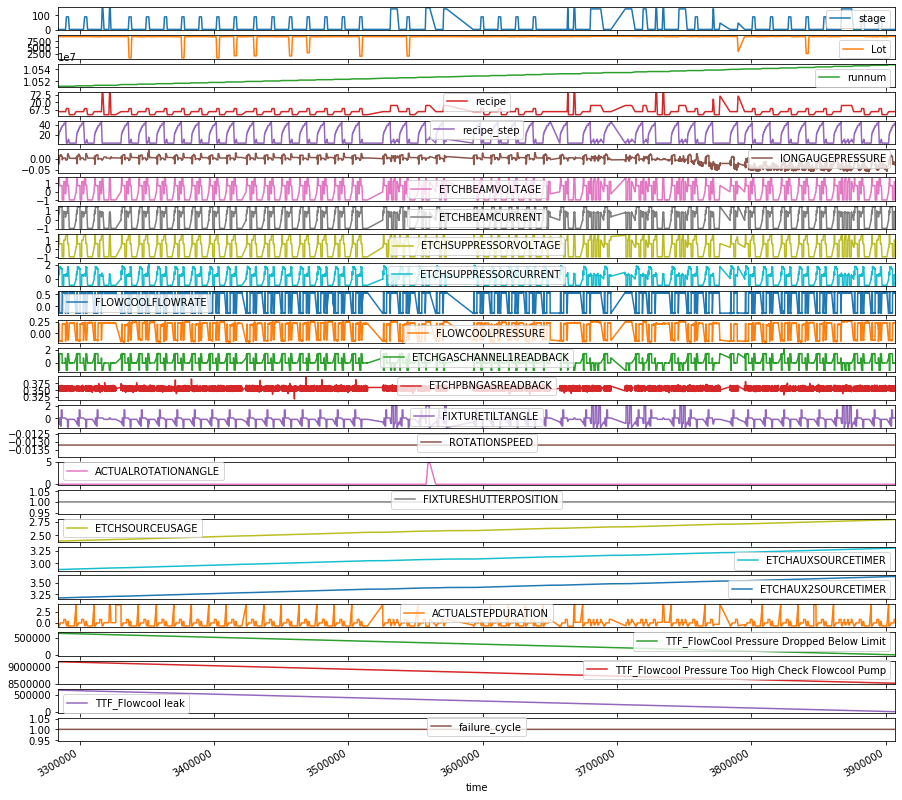

In [6]:
##Plot first cycle 

# df_train_ttf_merged = df_train_ttf_merged[df_train_ttf_merged['recipe_step']!=49]


# cols_attributes = ['time','IONGAUGEPRESSURE','ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT', 'ETCHSUPPRESSORCURRENT', 'ETCHGASCHANNEL1READBACK','FLOWCOOLFLOWRATE', 'FLOWCOOLPRESSURE']
cols_attributes =  df_train_ttf_merged.columns
print (cols_attributes)
t = pd.DataFrame(df_train_ttf_merged[df_train_ttf_merged['failure_cycle'] == 1][cols_attributes].values, columns=cols_attributes).plot(x = 'time', subplots=True, figsize=(15, 15))



In [7]:
# function to reshape features into (samples, time steps, features)
def gen_sequence(id_df, seq_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    # for one id I put all the rows in a single matrix
    data_matrix = id_df[seq_cols].values
#     print ("data_matrix", data_matrix)
    print (" data_matrix.shape",  data_matrix.shape)
#     print ("data_matrix.shape[0]", data_matrix.shape[0])
    num_elements = data_matrix.shape[0]
#     print ("num_elements", num_elements)
    # Iterate over two lists in parallel.
    # For example id1 have 192 rows and sequence_length is equal to 50
    # so zip iterate over two following list of numbers (0,112),(50,192)
    # 0 50 -> from row 0 to row 50
    # 1 51 -> from row 1 to row 51
    # 2 52 -> from row 2 to row 52
    # ...
    # 111 191 -> from row 111 to 191
    for start, stop in zip(range(0, num_elements - seq_length - pred_length), range(seq_length, num_elements - pred_length)):
        yield data_matrix[start:stop, :]


        
def gen_target(id_df, seq_length, pred_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    # for one id I put all the rows in a single matrix
    data_matrix = id_df[seq_cols].values
#     print (" data_matrix.shape",  data_matrix.shape)
    num_elements = data_matrix.shape[0]

#     print ("num_elements", num_elements)
    # Iterate over two lists in parallel.
    # For example id1 have 192 rows and sequence_length is equal to 50
    # so zip iterate over two following list of numbers (0,112),(50,192)
    # 0 50 -> from row 0 to row 50
    # 1 51 -> from row 1 to row 51
    # 2 52 -> from row 2 to row 52
    # ...
    # 111 191 -> from row 111 to 191
    for start, stop in zip(range(seq_length, num_elements  -pred_length), range(seq_length + pred_length , num_elements )):
        yield data_matrix[start:stop, :]
        
        
        
def gen_labels(id_df, seq_length, label):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    # For one id I put all the labels in a single matrix.
    # For example:
    # [[1]
    # [4]
    # [1]
    # [5]
    # [9]
    # ...
    # [200]]
    data_matrix = id_df[label].values
    num_elements = data_matrix.shape[0]
    # I have to remove the first seq_length labels
    # because for one id the first sequence of seq_length size have as target
    # the last label (the previus ones are discarded).
    # All the next id's sequences will have associated step by step one label as target.
    return data_matrix[seq_length:num_elements- pred_length, :]
        

In [8]:
### Define functions for anomaly detection (analysis of prediction errors)
'''

'''


def EWMA_Calc(epsilon, mu, lmbd_mu):
    """
    epsilon - input value for current time stamp (prediction error)
    mu - previous EWMA (average of until previous time stamp)
    lmbd_mu - a constant smoothing factor for EWMA weighting decrease
    """
    # calculation formula
    ewma = (lmbd_mu * epsilon) + ((1-lmbd_mu)*mu) 
    # return the result
    return ewma




def EWMA_Update(epsilon, anomaly, mu, sigma, lmbd_mu, lmbd_sigma):
    """
    epsilon - input value for current time stamp (prediction error)
    anomaly - True(1)/False(0) of anomaly until previous time stamp
    mu - previous EWMA (average of until previous time stamp)
    sigma - previous absolute deviation
    lmbd_mu - a constant smoothing factor for EWMA weighting decrease
    lmbd_sigma - a constant smoothing factor for the calculation of updating absolute deviation
    """
    if anomaly == False :
        # update absolute deviation(sigma) if there is no anomaly up to now
        sigma = EWMA_Calc ( abs(epsilon - mu), sigma , lmbd_sigma )
        
    # update EWMA 
    mu = EWMA_Calc( epsilon, mu, lmbd_mu )
    sigma = sigma
    # return mu and sigma, mu(average is always updated, 
    # but abs deviation is updated only when anomaly is False)
    
    return mu, sigma




def InitPhaseOne (epsilon, mu, sigma, lmbd_mu, lmbd_sigma, anomaly=False):
    """
    'initial phase to calculate/update average for the first few time stamps'
    
    """
    mu, sigma = EWMA_Update(epsilon, anomaly, mu, sigma, lmbd_mu, lmbd_sigma)
    
    return mu, sigma
    
     
    
    
def InitPhaseTwo (epsilon, mu, sigma, lmbd_mu, lmbd_sigma, thold_ad, anomaly=False):
    """
    'second phase of initialization to adapt threshold'
    thold_ad - threshold factor for the anomaly detection 
    
    """
    mu, sigma = EWMA_Update(epsilon, anomaly, mu, sigma, lmbd_mu, lmbd_sigma)    
    
    if abs(epsilon - mu) > sigma * thold_ad : 
        thold_ad = abs(epsilon - mu) / sigma
    
    
    return mu, sigma , thold_ad





def InitPhasePvalue (epsilon, mu, sigma, thold_p, conf_lv = 0.05):
    """
    'induce thold_p value to evaluate p-value in detection step'
    thold_p - threshold factor for the p-value
    conf_lv - user defined confidence level, 0.05 means 95%
    
    """       
    fixed_thold = stats.norm.ppf(conf_lv, loc = mu, scale = thold_p*sigma)
    deviation_thold = abs(fixed_thold - mu)
    
    # loop until thold_p shows can be enough variance in normal distribution    
    while abs(epsilon-mu)> deviation_thold :
        thold_p += 0.1        
        fixed_thold = stats.norm.ppf(conf_lv, loc = mu, scale = thold_p*sigma)
        deviation_thold = abs(fixed_thold - mu)
        
#         print ("bad loop- thold_p:%s, sigma:%s" %(thold_p,sigma))
        
    
    return thold_p



    
    
def Detection (epsilon, mu, sigma, lmbd_mu, lmbd_sigma, thold_ad, thold_p, anomaly=False):
    
    '''
    main function which detect anomaly and calculate p-value
    epsilon - current inpur prediction error
    anomaly - default is False, the detection result (True/False) will be return
    mu, sigma - updated average or deviation value during initalization phase
    lmbd_mu, lmbd_sigma - manually selected smoothing factor for EWMA calculation
    thold_ad, thold_p - adaptive threshold factor value, initial value is determined in inital phase
    
    '''
    
    if abs(epsilon - mu) > sigma * thold_ad : 
        anomaly = True
    
    
    mu, sigma = EWMA_Update(epsilon, anomaly, mu, sigma, lmbd_mu, lmbd_sigma)
    
    # half tailed p-value (only concerning deviation from the mean, range:[0,0.5])
    # if p_value is supposed to be used for anomaly detection, 
    # then anomaly is true when p_value is larger than conf_lv(user defined confidence level)  
    if epsilon > mu :
        p_value = stats.norm.sf(epsilon, mu, thold_p*sigma) #p-value right tailed (right hand side of mean)
    else :
        p_value = stats.norm.cdf(epsilon, mu, thold_p*sigma) #p-value left tailed (left hand side of mean)
#     print (p_value)

    
    return mu, sigma , anomaly, p_value



In [9]:
'''

 data_matrix.shape (1291, 11)
 data_matrix.shape (2774, 11)
 data_matrix.shape (1055, 11)
 data_matrix.shape (47, 11)
 data_matrix.shape (560407, 11)
 data_matrix.shape (174, 11)
 data_matrix.shape (73, 11)
 data_matrix.shape (38, 11)
 data_matrix.shape (16, 11)
 data_matrix.shape (61250, 11)
 data_matrix.shape (1029592, 11)
 data_matrix.shape (7507, 11)
 data_matrix.shape (306920, 11)
 data_matrix.shape (58763, 11)
 data_matrix.shape (37463, 11)
 data_matrix.shape (106375, 11)
 data_matrix.shape (56916, 11)
 data_matrix.shape (4421, 11)
 data_matrix.shape (12266, 11)
 data_matrix.shape (70580, 11)
 data_matrix.shape (613419, 11)
 data_matrix.shape (398, 11)


 data_matrix.shape (560407, 11)
 data_matrix.shape (61250, 11)
 data_matrix.shape (1029592, 11)
 data_matrix.shape (7507, 11)
 data_matrix.shape (306920, 11)
 data_matrix.shape (58763, 11)
 data_matrix.shape (37463, 11)
 data_matrix.shape (106375, 11)
 data_matrix.shape (56916, 11)
 data_matrix.shape (4421, 11)
 data_matrix.shape (12266, 11)
 data_matrix.shape (70580, 11)

 
'''

# sequence_length = 100
sequence_length = 10
pred_length = 1
lr = 0.99
# cycle_idx = 96 # 1~100
# sensor_idx = 14  # 0~13, sensor 2,3,4,7,8,9,11,12,13,14,15,17,20 and 21 in order

# RMSE of first n samples and last n samples
n = 1000

cycle_list = df_train_ttf_merged['failure_cycle'].unique()
print (cycle_list)

# cycle_list = cycle_list[[ 0, 5, 10, 12, 13, 14, 16, 17, 18, 19]]

cycle_list = cycle_list[[ 0, 10,13, 16, 17]]

print (len(cycle_list))
print (cycle_list)


p_err_u_list = []



[ 1  2  3  4  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25]
5
[ 1 13 16 19 20]


sequence_cols ['IONGAUGEPRESSURE', 'ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT', 'ETCHSUPPRESSORVOLTAGE', 'ETCHSUPPRESSORCURRENT', 'FLOWCOOLFLOWRATE', 'FLOWCOOLPRESSURE', 'ETCHGASCHANNEL1READBACK', 'ETCHPBNGASREADBACK', 'FIXTURETILTANGLE', 'ACTUALSTEPDURATION']
sequence generated, concatenating...
 data_matrix.shape (61250, 11)
 data_matrix.shape (306920, 11)
 data_matrix.shape (106375, 11)
 data_matrix.shape (56916, 11)
concatenated!


  0%|          | 0/531416 [00:00<?, ?it/s]

 data_matrix.shape (108317, 11)
sensor loop 0: IONGAUGEPRESSURE
RLS for adaptation(other cycles)


  1%|          | 915/108305 [00:00<00:11, 9139.92it/s]

Initialized value of sensor 0 -  mu:[-0.003368], signma:[0.0037143], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:11<00:00, 9184.52it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


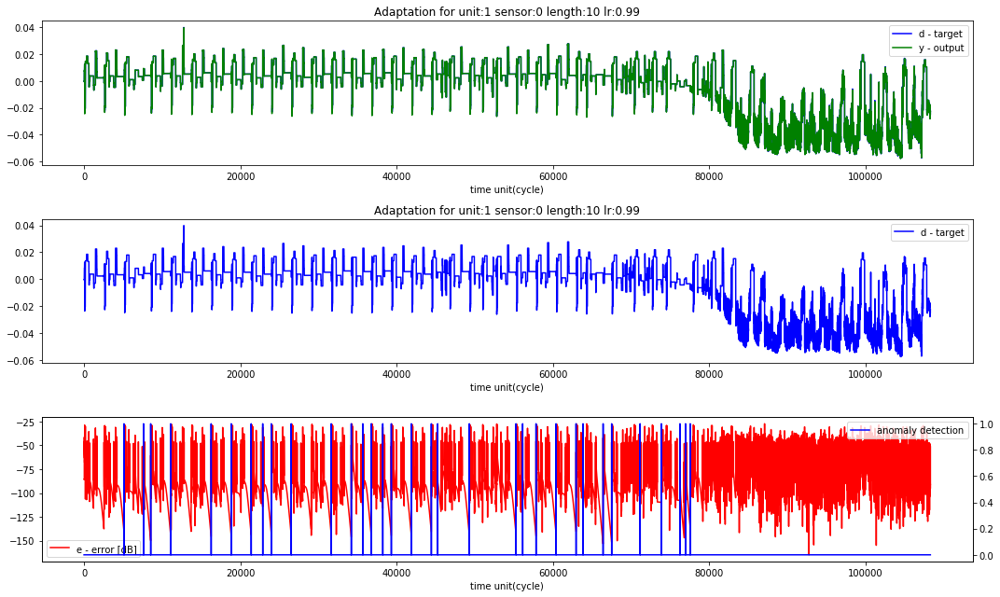

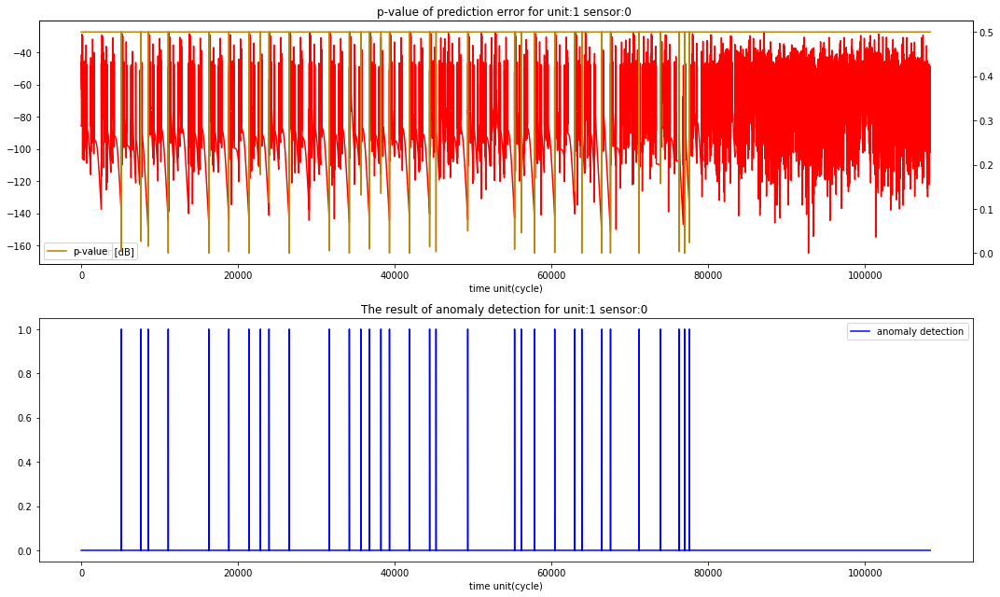

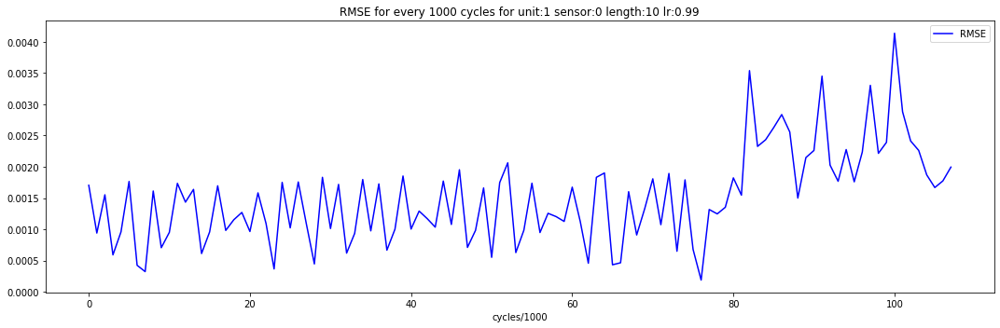

  1%|          | 2705/531416 [00:00<00:19, 27045.32it/s]

sensor loop 1: ETCHBEAMVOLTAGE
RLS for adaptation(other cycles)


  1%|          | 911/108305 [00:00<00:11, 9102.07it/s]

Initialized value of sensor 1 -  mu:[0.06567536], signma:[0.07325868], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:11<00:00, 9132.77it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


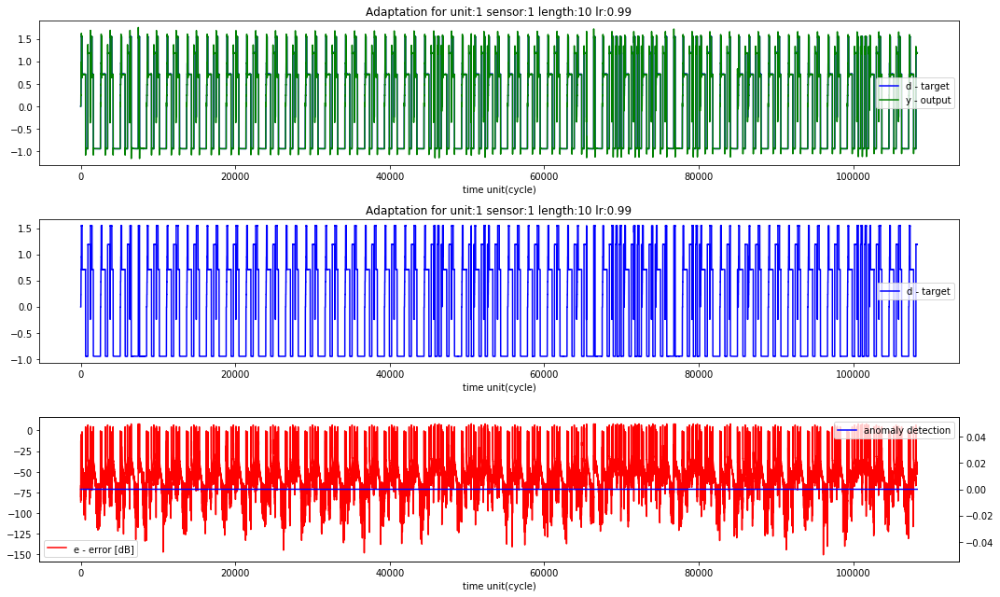

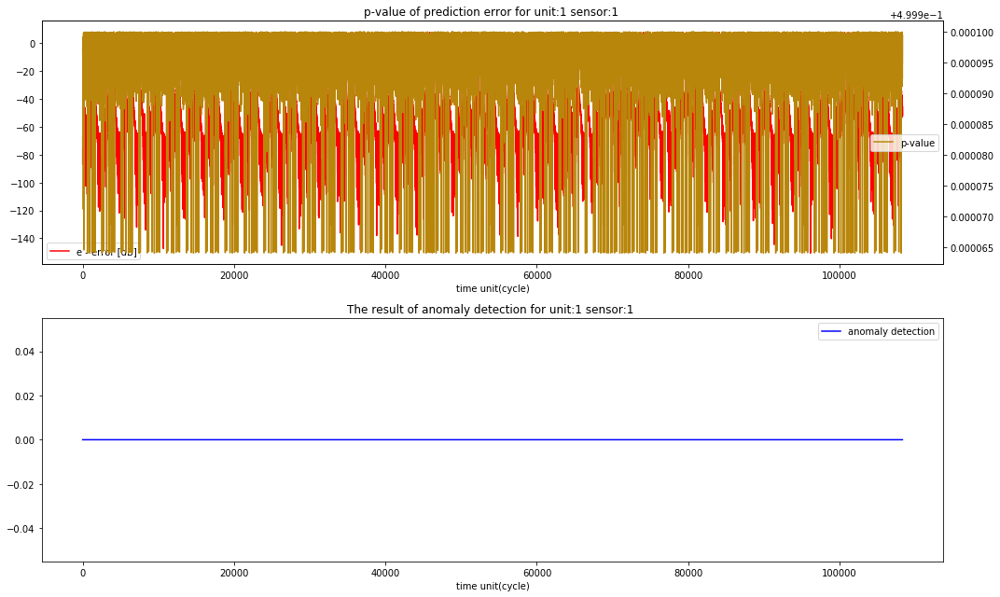

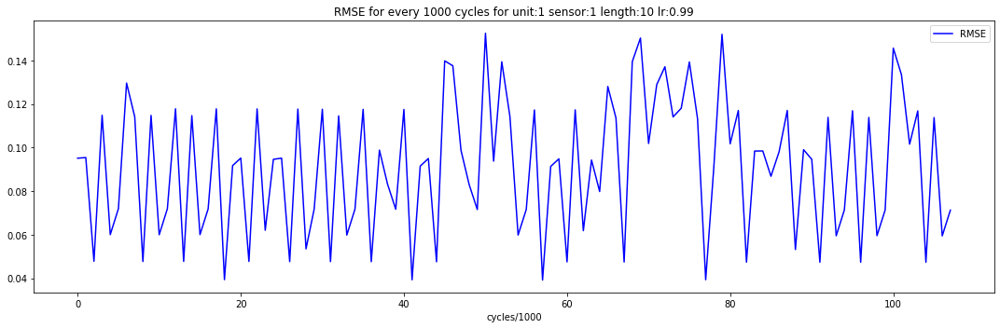

  1%|          | 3494/531416 [00:00<00:15, 34936.87it/s]

sensor loop 2: ETCHBEAMCURRENT
RLS for adaptation(other cycles)


  1%|          | 921/108305 [00:00<00:11, 9208.95it/s]

Initialized value of sensor 2 -  mu:[-0.01575818], signma:[0.04443101], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:13<00:00, 8087.91it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


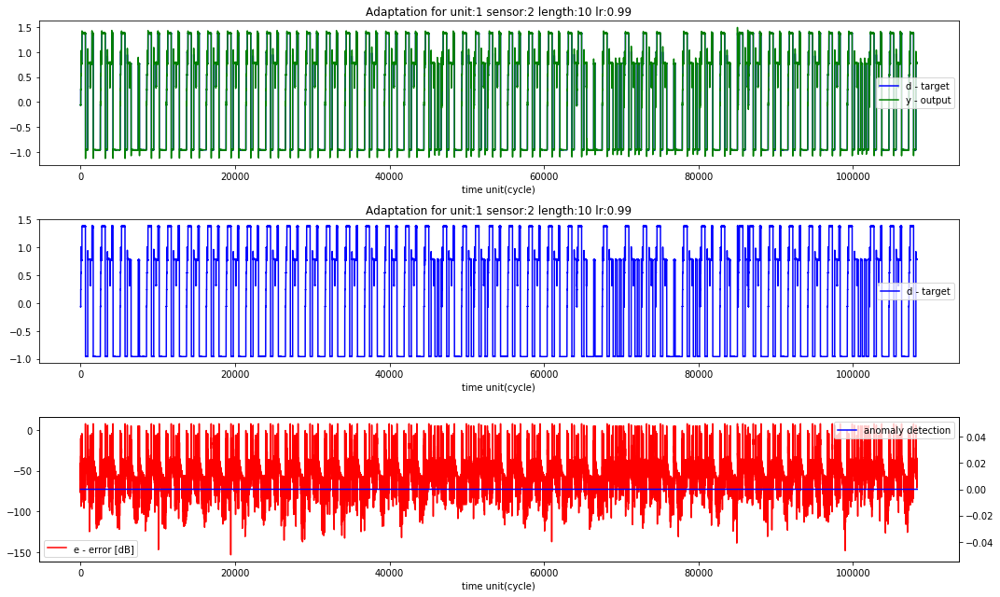

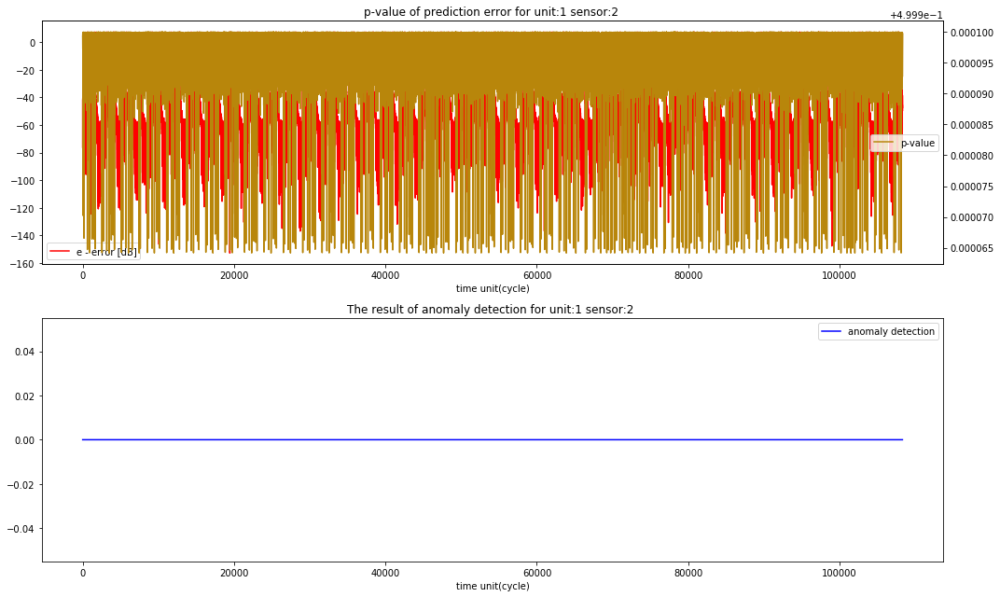

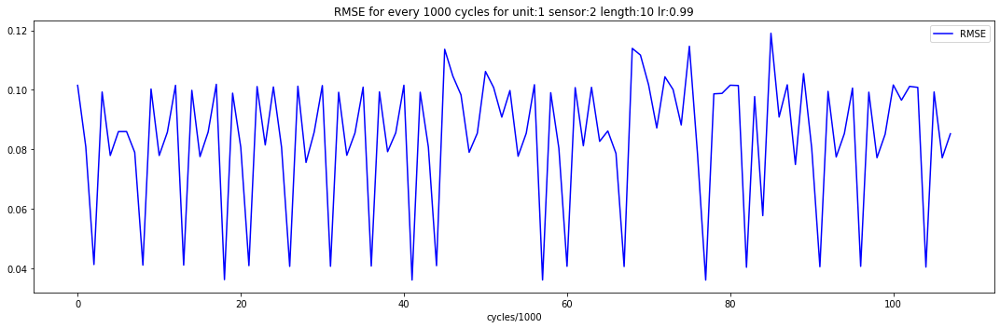

  1%|          | 3485/531416 [00:00<00:15, 34842.39it/s]

sensor loop 3: ETCHSUPPRESSORVOLTAGE
RLS for adaptation(other cycles)


  1%|          | 850/108305 [00:00<00:12, 8491.42it/s]

Initialized value of sensor 3 -  mu:[0.12050227], signma:[0.11813149], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:12<00:00, 9015.62it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


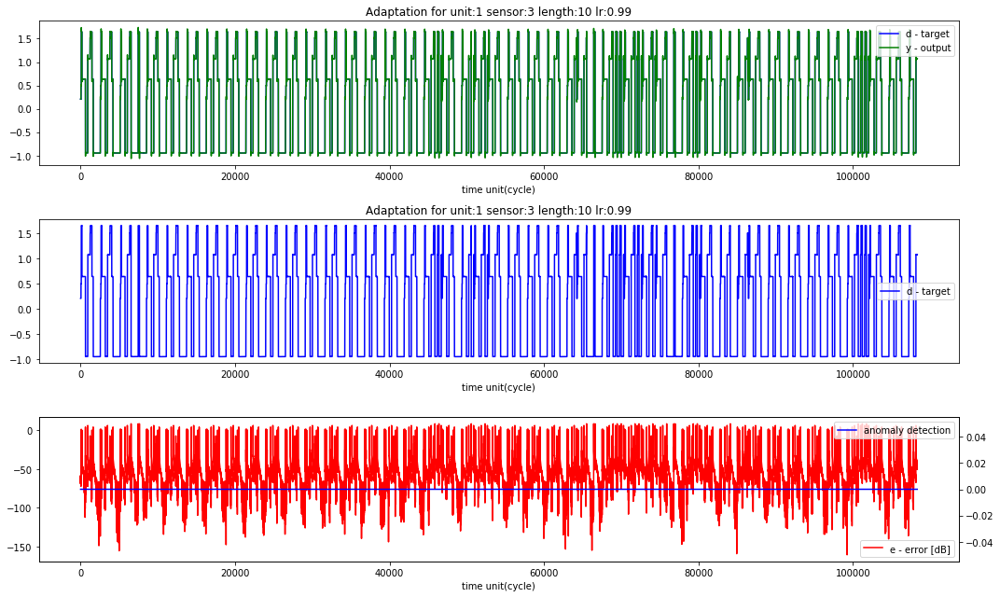

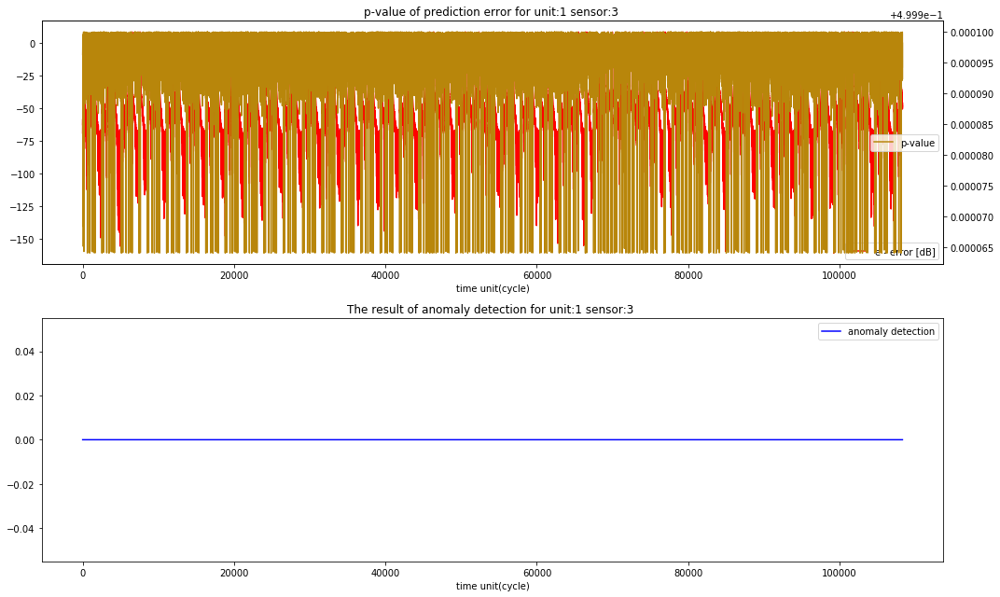

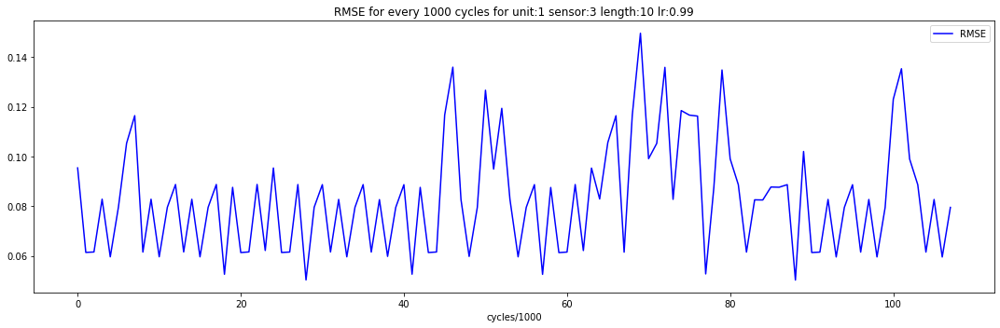

  1%|          | 3567/531416 [00:00<00:14, 35665.87it/s]

sensor loop 4: ETCHSUPPRESSORCURRENT
RLS for adaptation(other cycles)


  1%|          | 907/108305 [00:00<00:11, 9063.50it/s]

Initialized value of sensor 4 -  mu:[-0.02919525], signma:[0.06057084], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:12<00:00, 9013.72it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


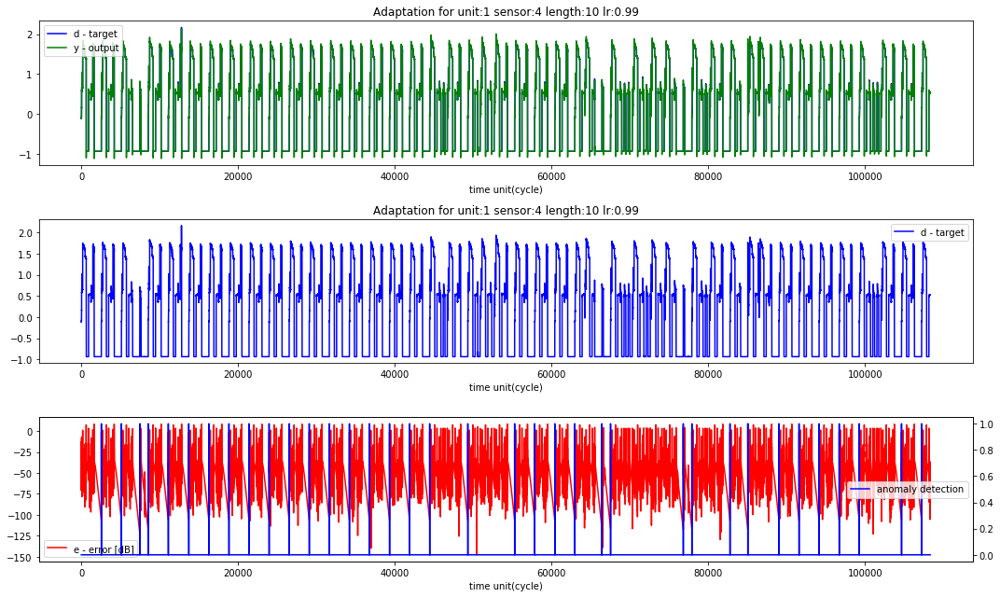

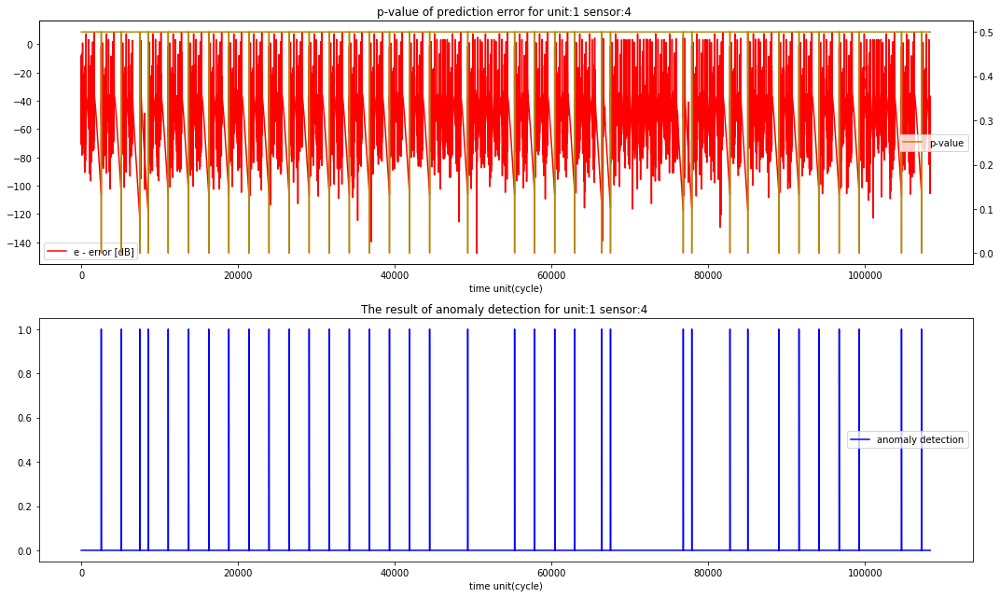

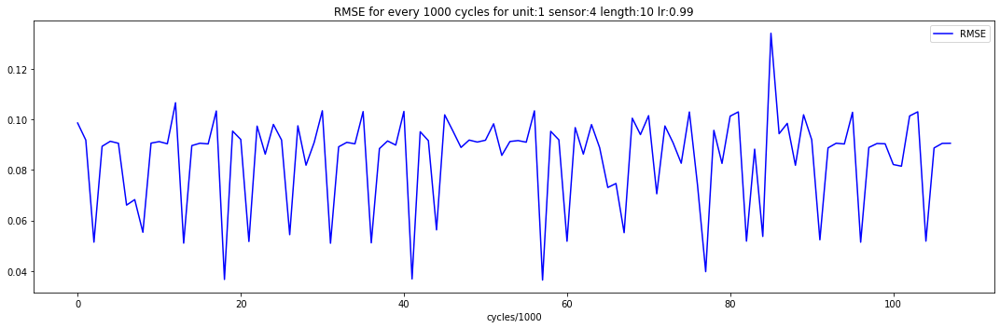

  1%|          | 3351/531416 [00:00<00:15, 33502.44it/s]

sensor loop 5: FLOWCOOLFLOWRATE
RLS for adaptation(other cycles)


  1%|          | 909/108305 [00:00<00:11, 9081.37it/s]

Initialized value of sensor 5 -  mu:[0.08116604], signma:[0.09539673], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:12<00:00, 8795.38it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


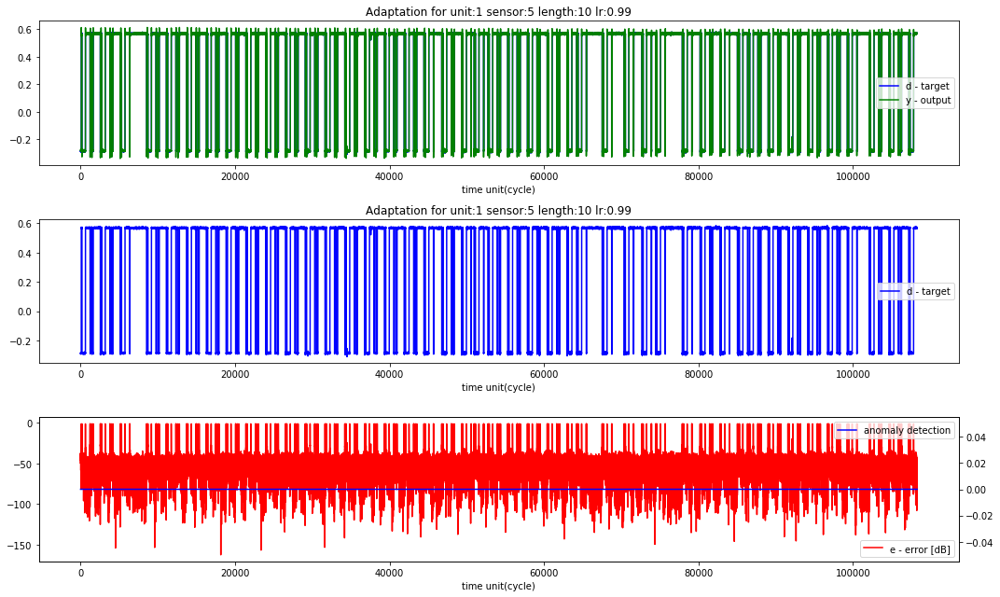

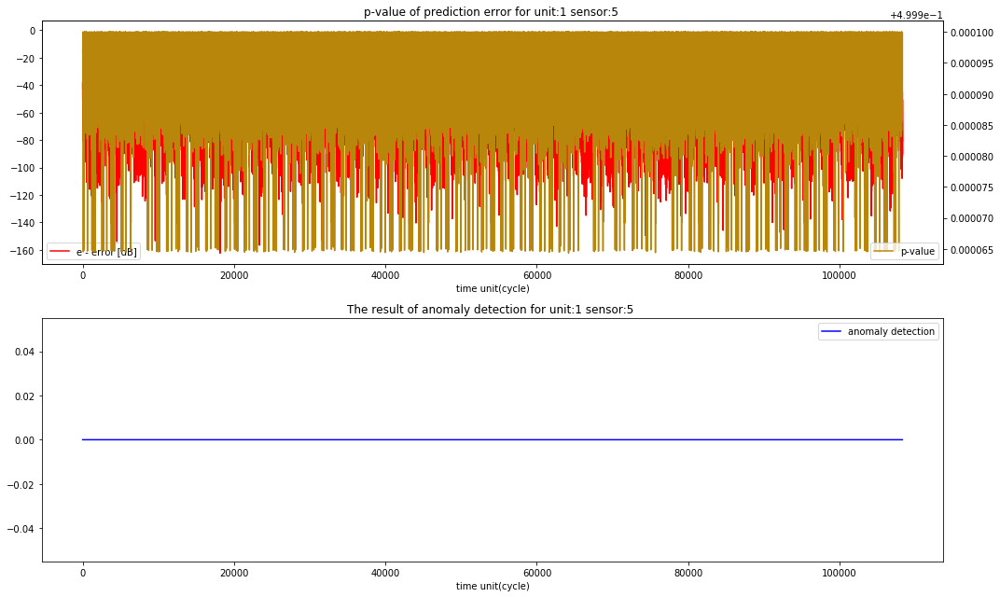

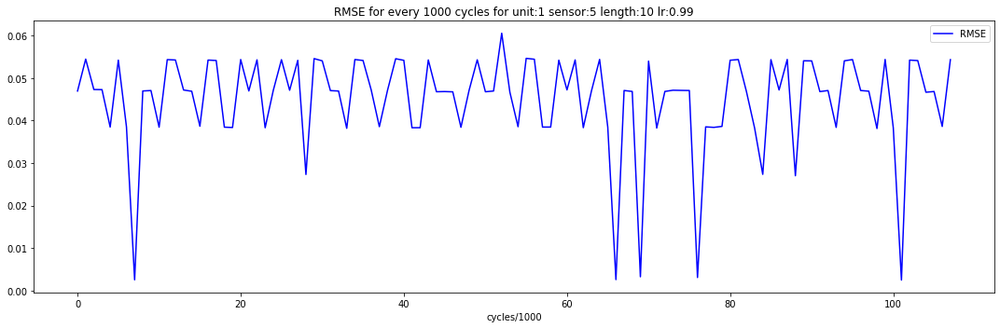

  1%|          | 3837/531416 [00:00<00:13, 38368.12it/s]

sensor loop 6: FLOWCOOLPRESSURE
RLS for adaptation(other cycles)


  1%|          | 942/108305 [00:00<00:11, 9419.60it/s]

Initialized value of sensor 6 -  mu:[0.03393776], signma:[0.03746639], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:12<00:00, 9011.39it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


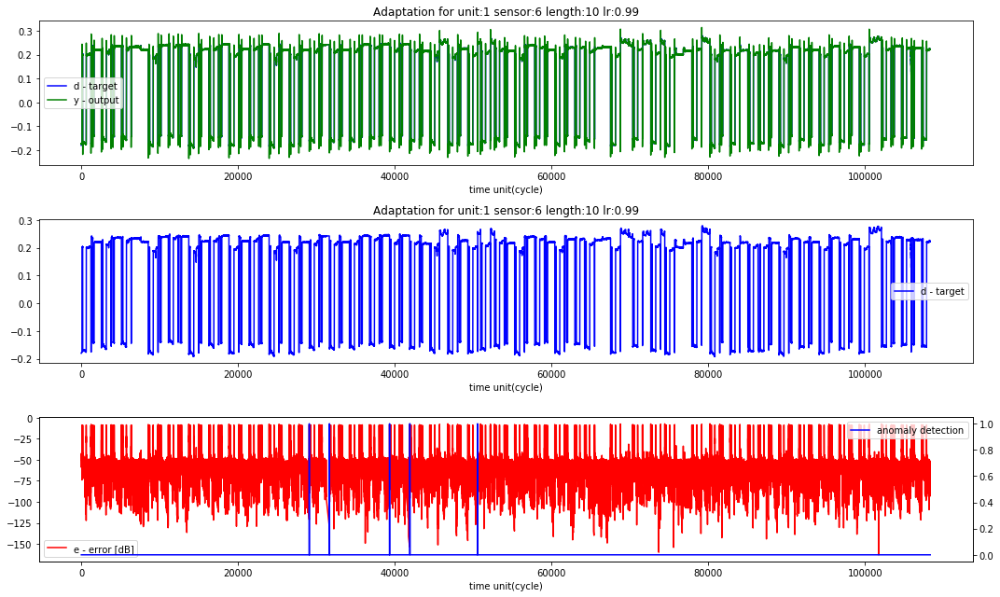

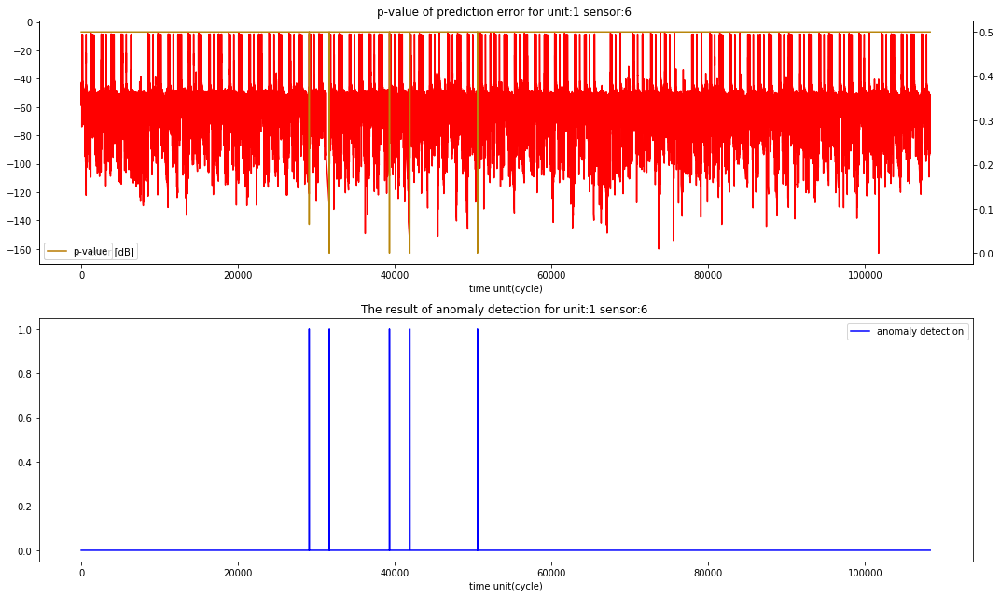

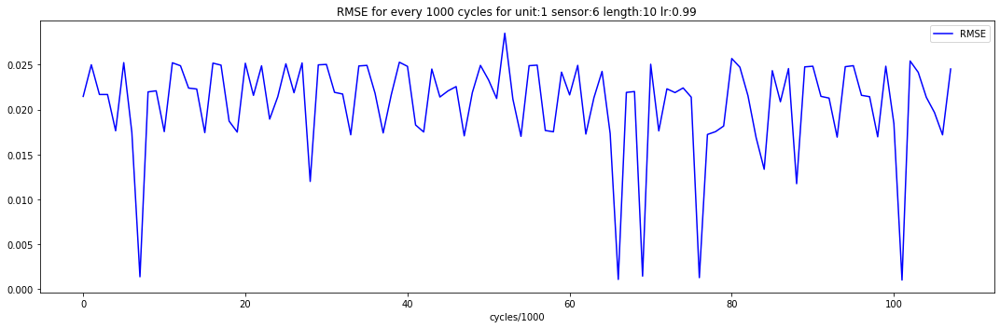

  1%|          | 3090/531416 [00:00<00:17, 30895.17it/s]

sensor loop 7: ETCHGASCHANNEL1READBACK
RLS for adaptation(other cycles)


  1%|          | 899/108305 [00:00<00:11, 8987.03it/s]

Initialized value of sensor 7 -  mu:[-0.26258604], signma:[0.27297604], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:12<00:00, 8811.79it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


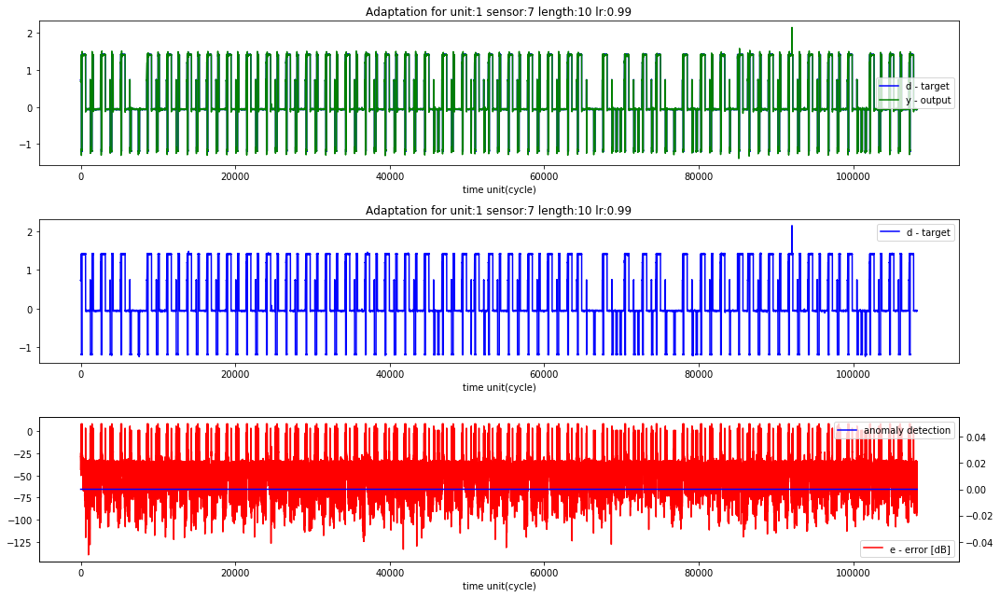

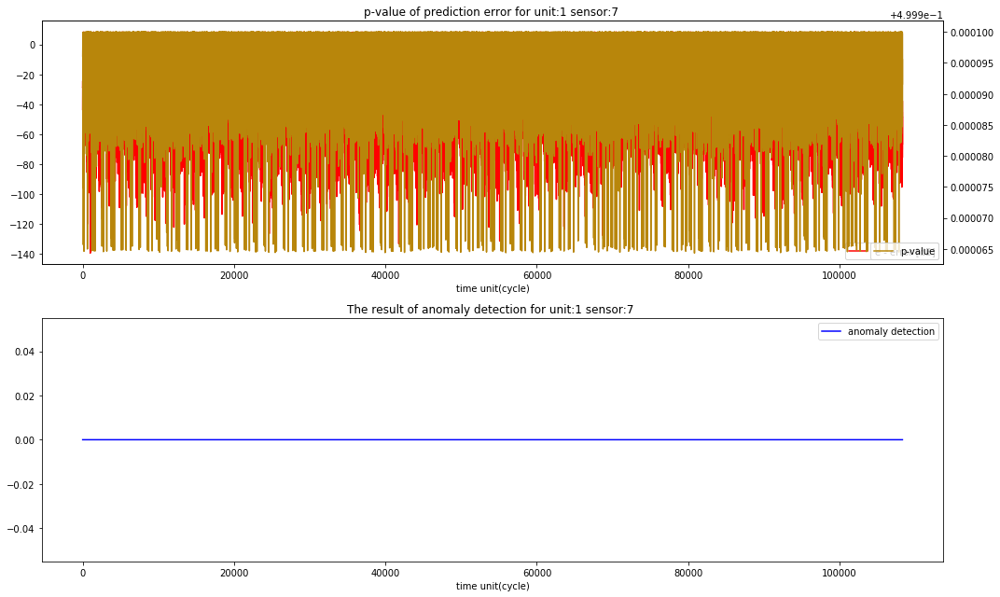

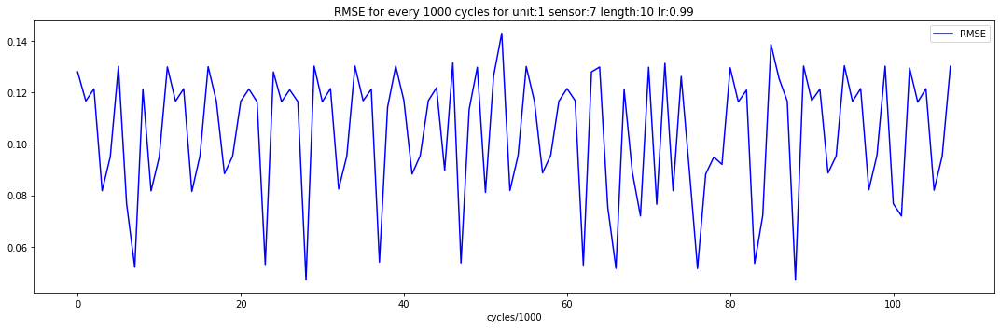

  1%|          | 3179/531416 [00:00<00:16, 31787.15it/s]

sensor loop 8: ETCHPBNGASREADBACK
RLS for adaptation(other cycles)


  1%|          | 907/108305 [00:00<00:11, 9068.28it/s]

Initialized value of sensor 8 -  mu:[7.72265863e-05], signma:[0.00252863], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:11<00:00, 9245.26it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


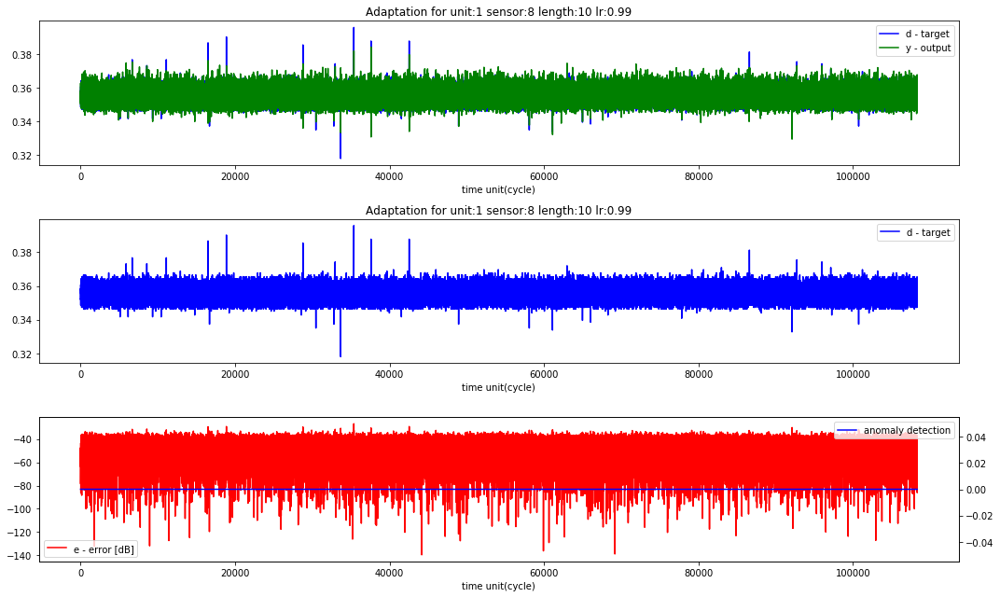

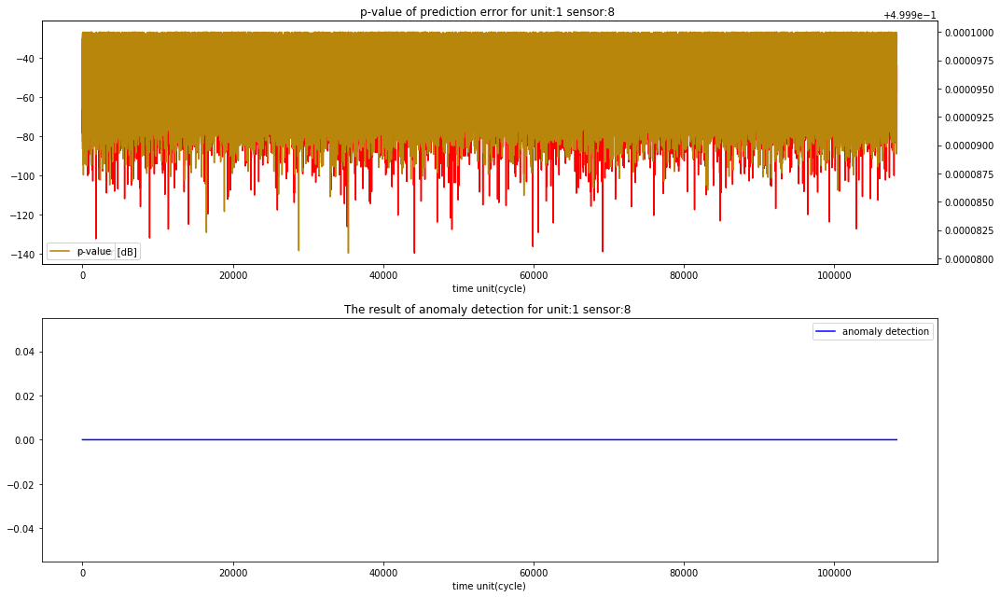

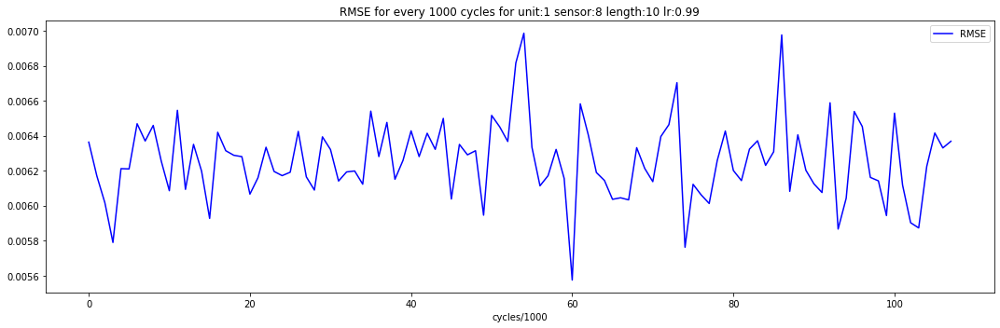

  1%|          | 3625/531416 [00:00<00:14, 36249.08it/s]

sensor loop 9: FIXTURETILTANGLE
RLS for adaptation(other cycles)


  1%|          | 904/108305 [00:00<00:11, 9038.26it/s]

Initialized value of sensor 9 -  mu:[-0.03206258], signma:[0.03374167], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:11<00:00, 9136.91it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


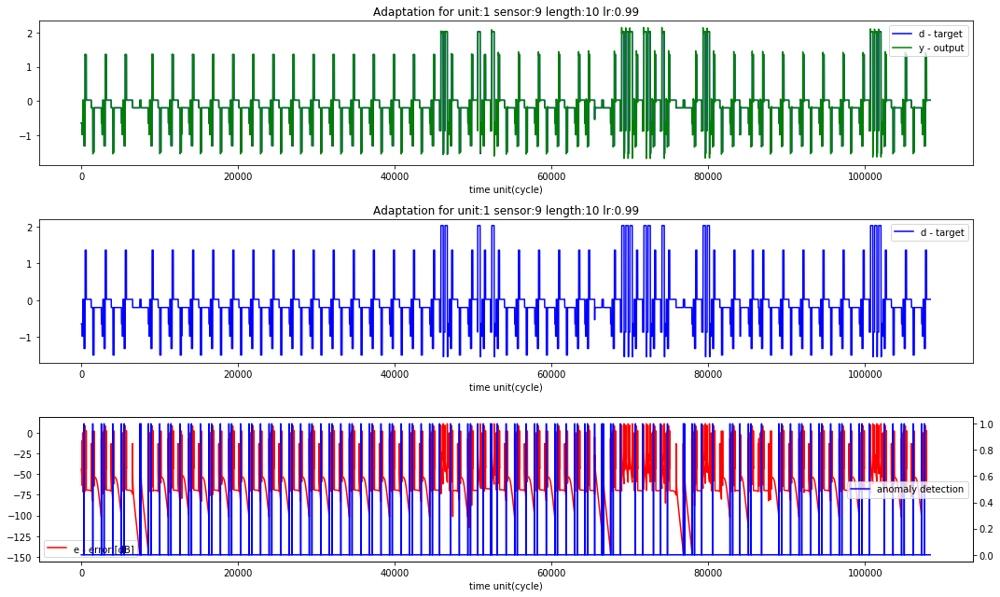

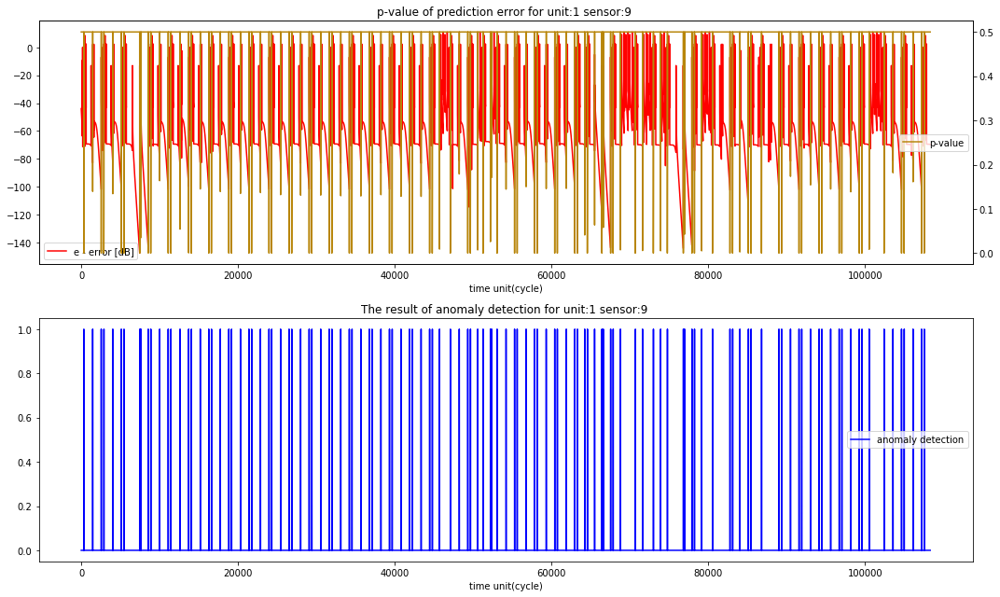

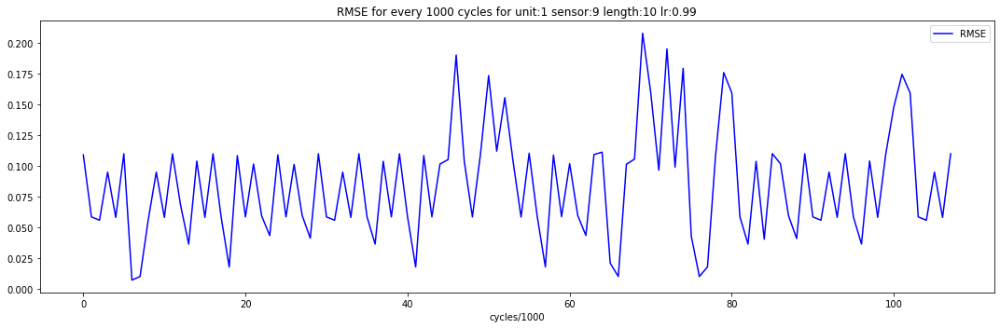

  1%|          | 3544/531416 [00:00<00:14, 35433.61it/s]

sensor loop 10: ACTUALSTEPDURATION
RLS for adaptation(other cycles)


  1%|          | 910/108305 [00:00<00:11, 9094.85it/s]

Initialized value of sensor 10 -  mu:[-0.03059577], signma:[0.00602756], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 108305/108305 [00:11<00:00, 9164.92it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


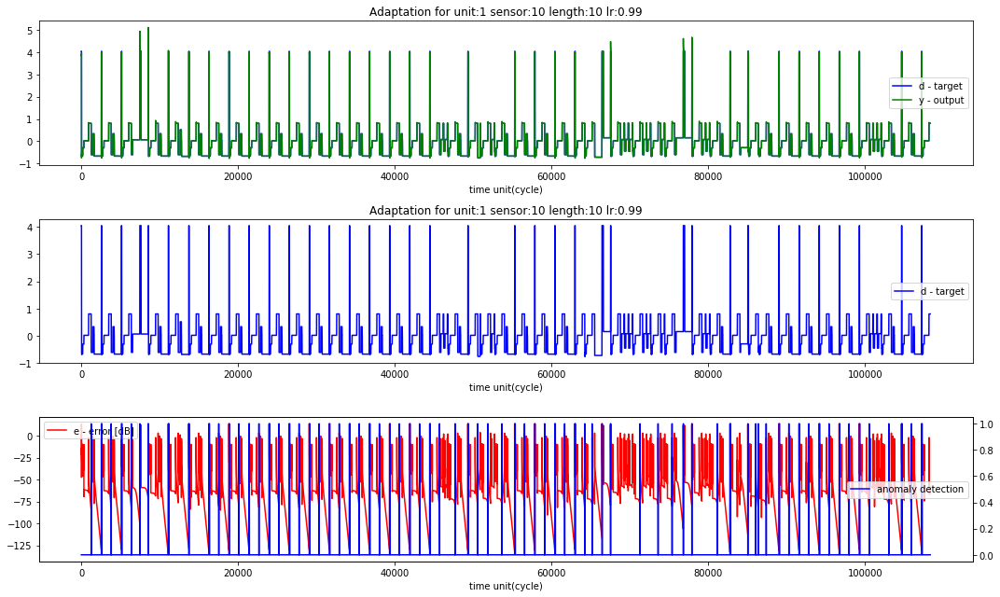

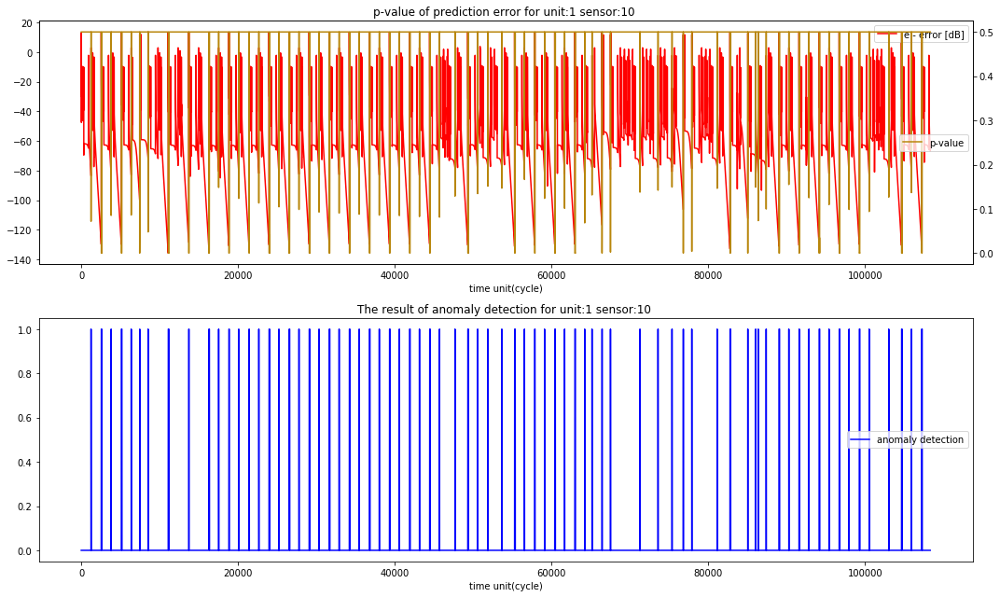

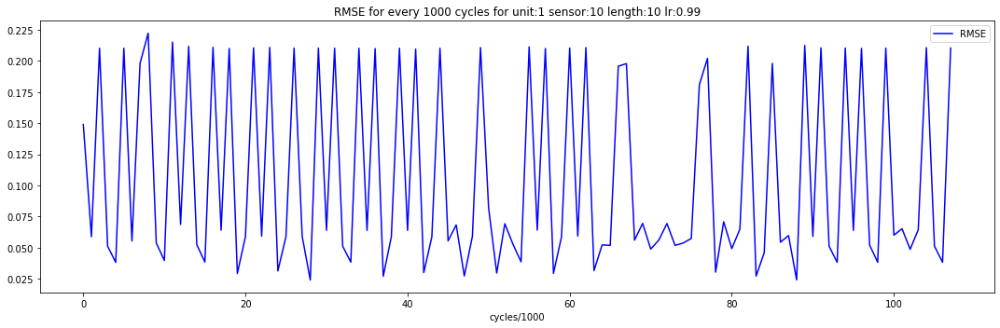

sequence_cols ['IONGAUGEPRESSURE', 'ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT', 'ETCHSUPPRESSORVOLTAGE', 'ETCHSUPPRESSORCURRENT', 'FLOWCOOLFLOWRATE', 'FLOWCOOLPRESSURE', 'ETCHGASCHANNEL1READBACK', 'ETCHPBNGASREADBACK', 'FIXTURETILTANGLE', 'ACTUALSTEPDURATION']
sequence generated, concatenating...
 data_matrix.shape (108317, 11)
 data_matrix.shape (306920, 11)
 data_matrix.shape (106375, 11)
 data_matrix.shape (56916, 11)
concatenated!


  0%|          | 0/578483 [00:00<?, ?it/s]

 data_matrix.shape (61250, 11)
sensor loop 0: IONGAUGEPRESSURE
RLS for adaptation(other cycles)


  1%|▏         | 913/61238 [00:00<00:06, 9119.20it/s]

Initialized value of sensor 0 -  mu:[-0.00336799], signma:[0.00371439], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:06<00:00, 9169.17it/s]


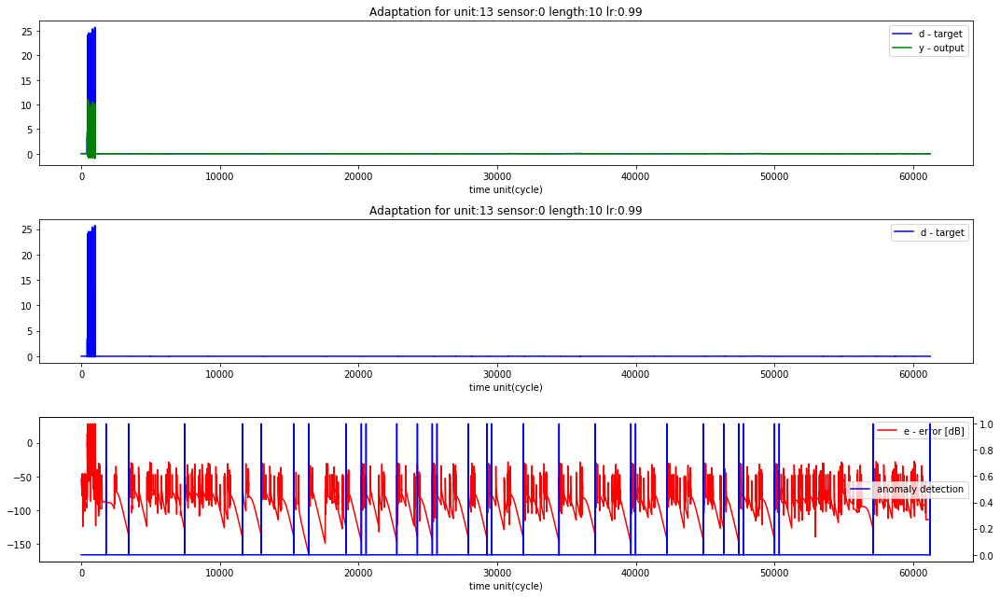

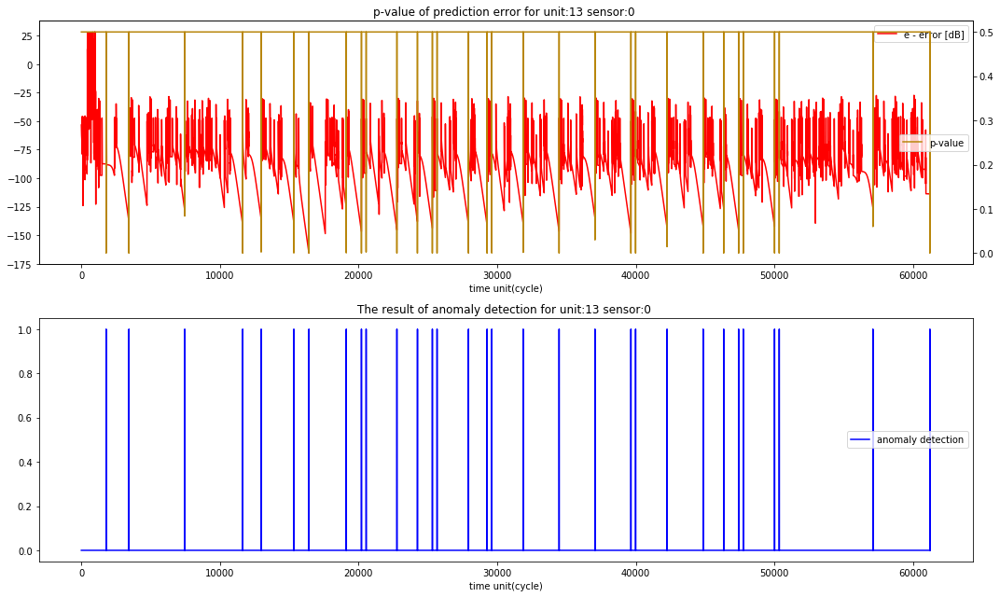

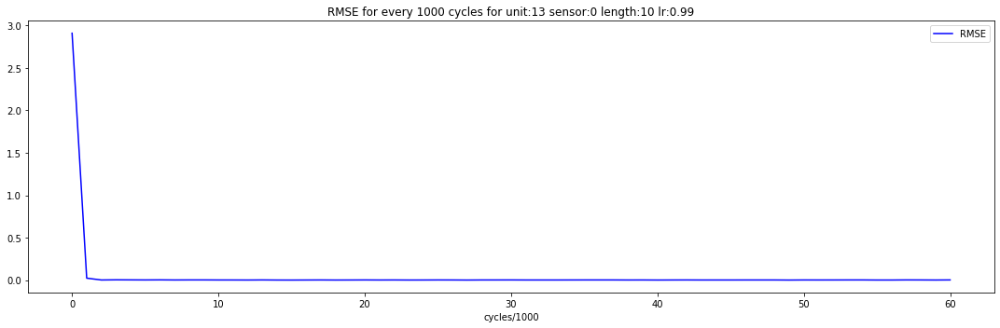

  1%|          | 3512/578483 [00:00<00:16, 35110.41it/s]

sensor loop 1: ETCHBEAMVOLTAGE
RLS for adaptation(other cycles)


  2%|▏         | 933/61238 [00:00<00:06, 9326.72it/s]

Initialized value of sensor 1 -  mu:[0.06547098], signma:[0.07239597], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:06<00:00, 9047.53it/s]


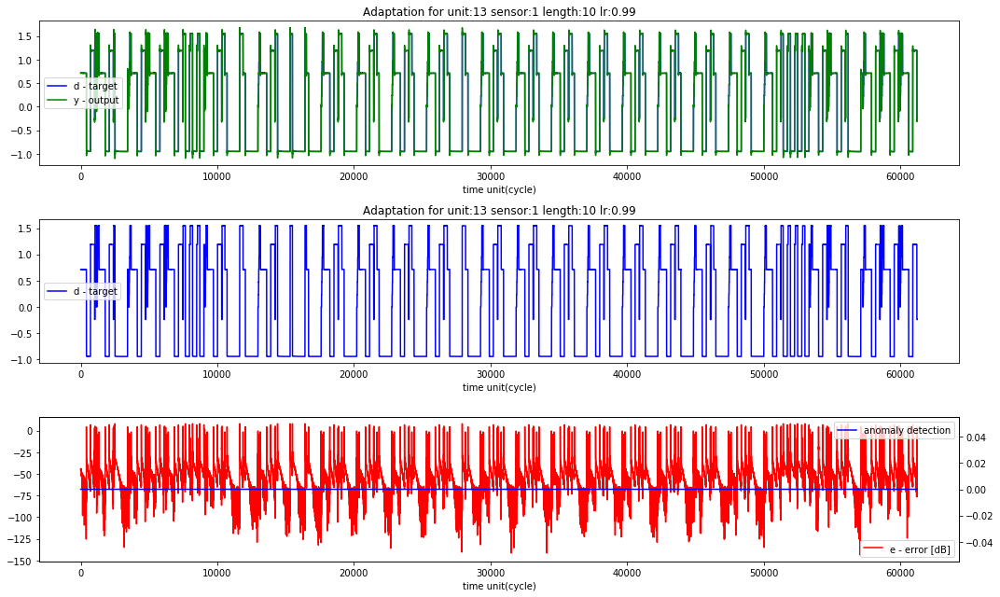

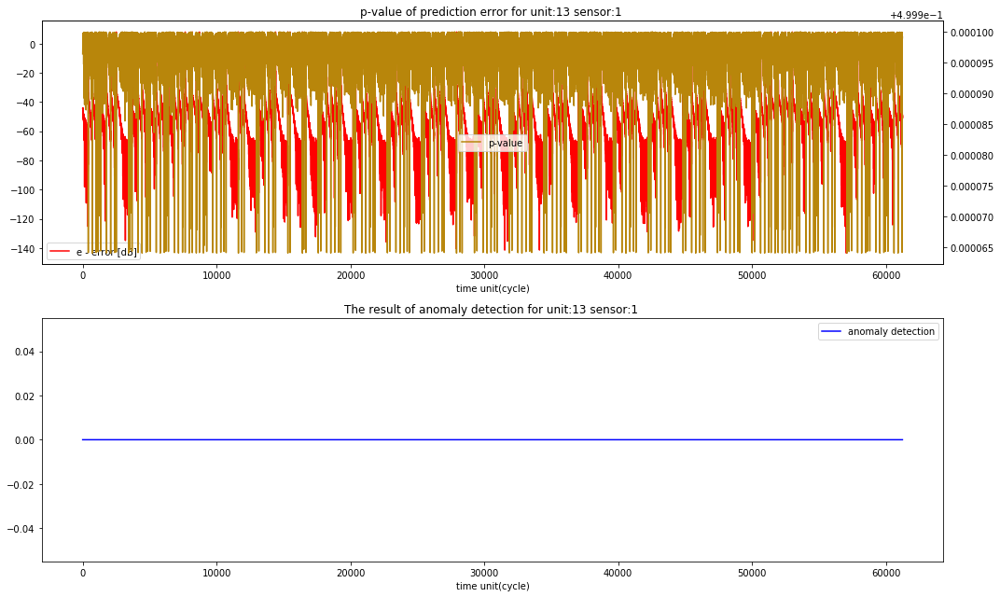

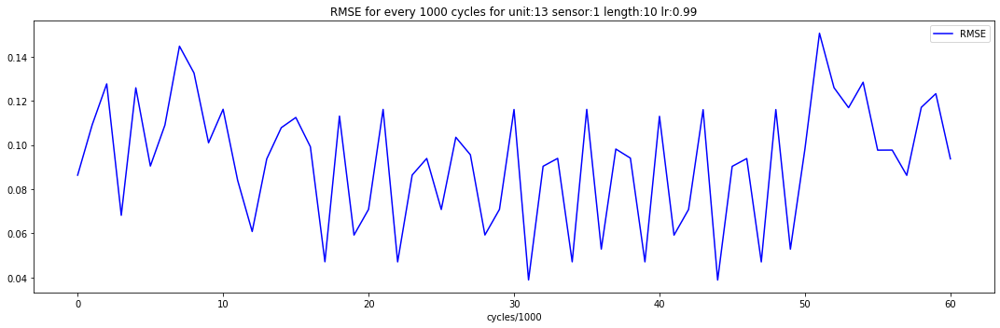

  1%|          | 3352/578483 [00:00<00:17, 33517.55it/s]

sensor loop 2: ETCHBEAMCURRENT
RLS for adaptation(other cycles)


  1%|▏         | 898/61238 [00:00<00:06, 8973.91it/s]

Initialized value of sensor 2 -  mu:[-0.0154001], signma:[0.04406583], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:06<00:00, 8907.64it/s]


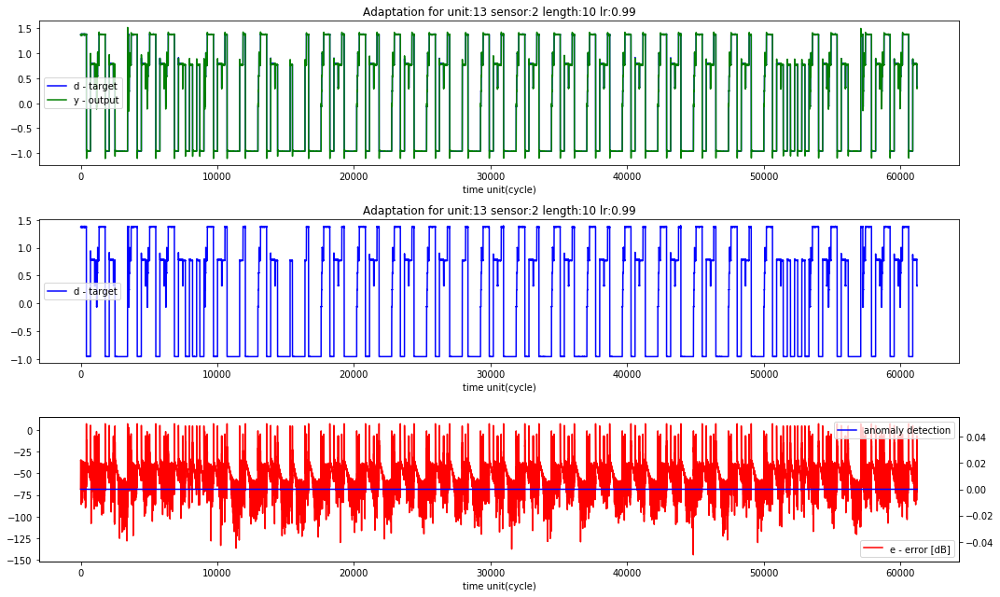

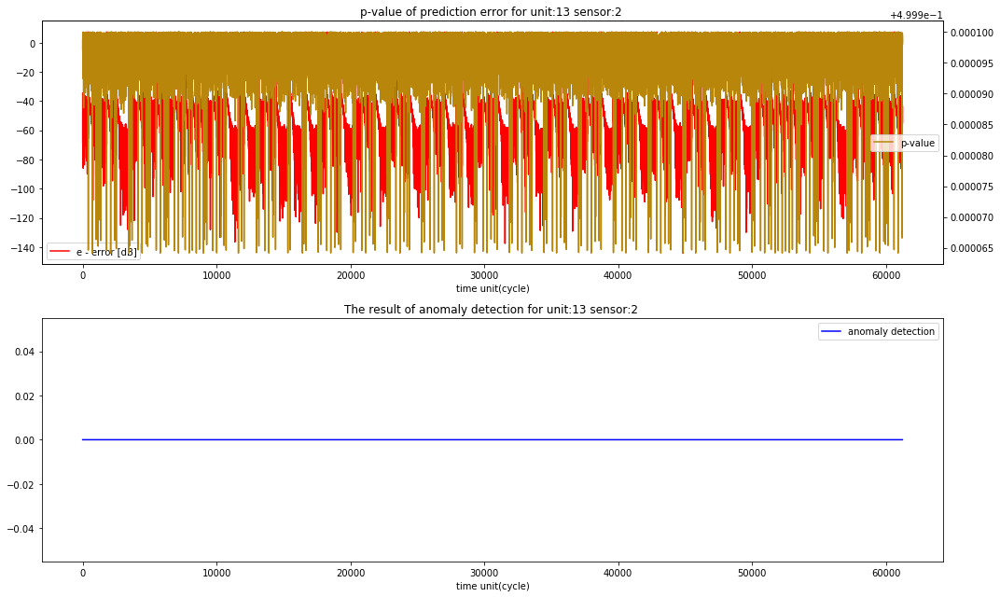

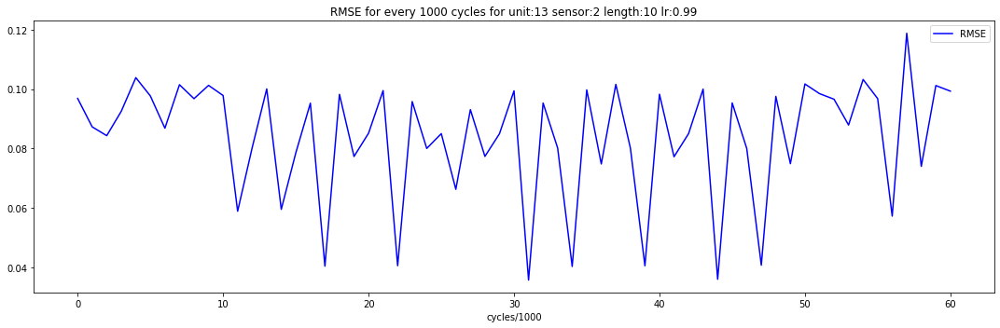

  0%|          | 2676/578483 [00:00<00:21, 26753.46it/s]

sensor loop 3: ETCHSUPPRESSORVOLTAGE
RLS for adaptation(other cycles)


  1%|▏         | 837/61238 [00:00<00:07, 8363.49it/s]

Initialized value of sensor 3 -  mu:[0.12062146], signma:[0.11850958], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:06<00:00, 8971.37it/s]


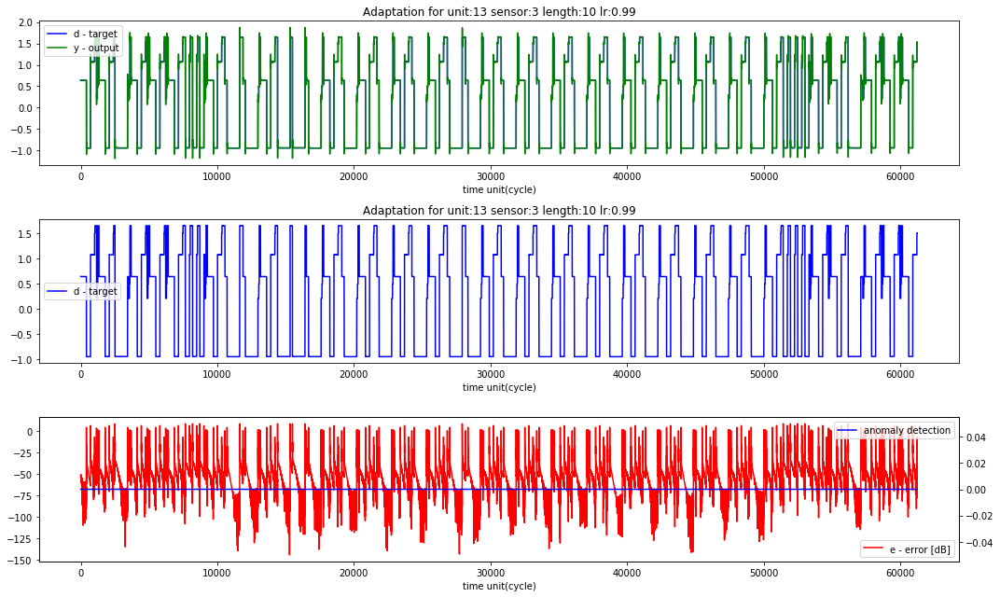

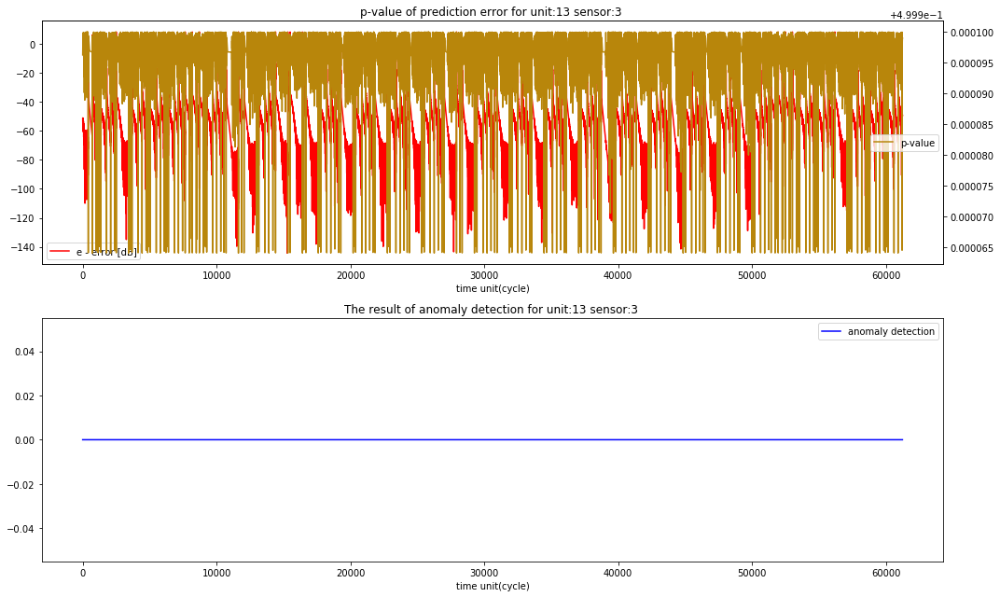

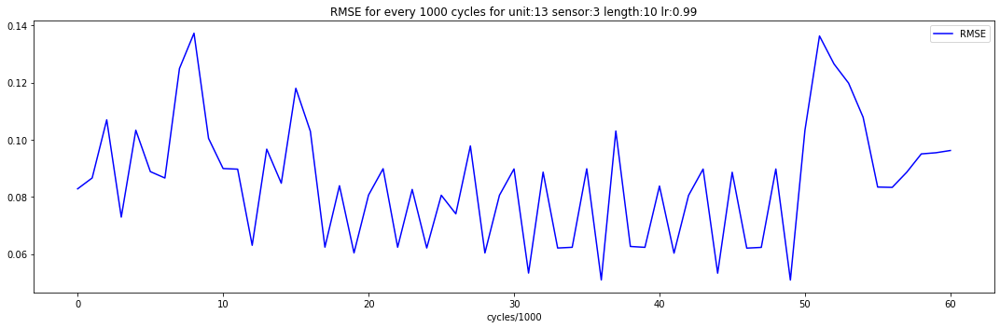

  1%|          | 3395/578483 [00:00<00:16, 33943.88it/s]

sensor loop 4: ETCHSUPPRESSORCURRENT
RLS for adaptation(other cycles)


  1%|▏         | 904/61238 [00:00<00:06, 9036.54it/s]

Initialized value of sensor 4 -  mu:[-0.02939156], signma:[0.06268237], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:07<00:00, 8728.22it/s]


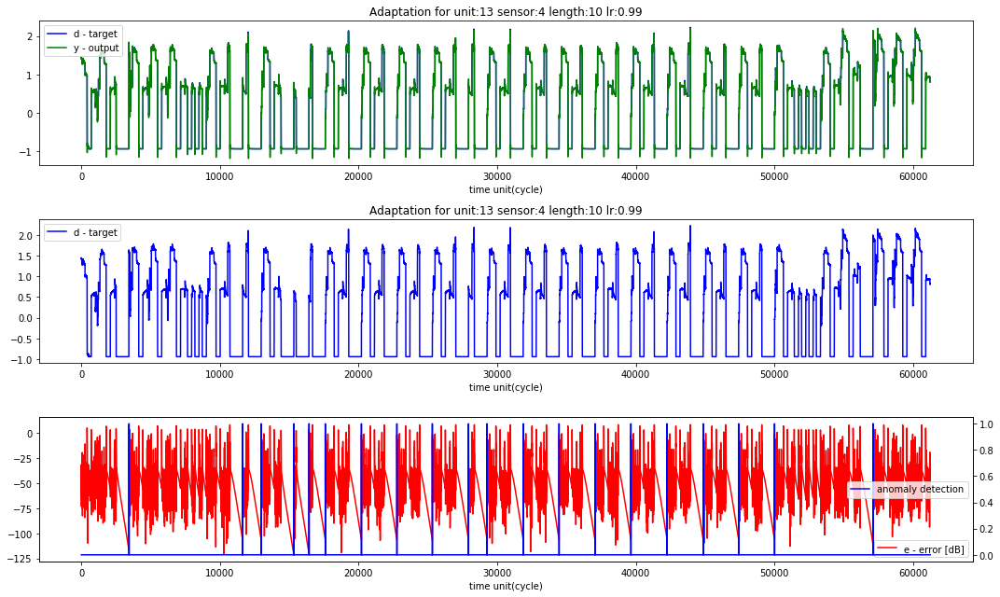

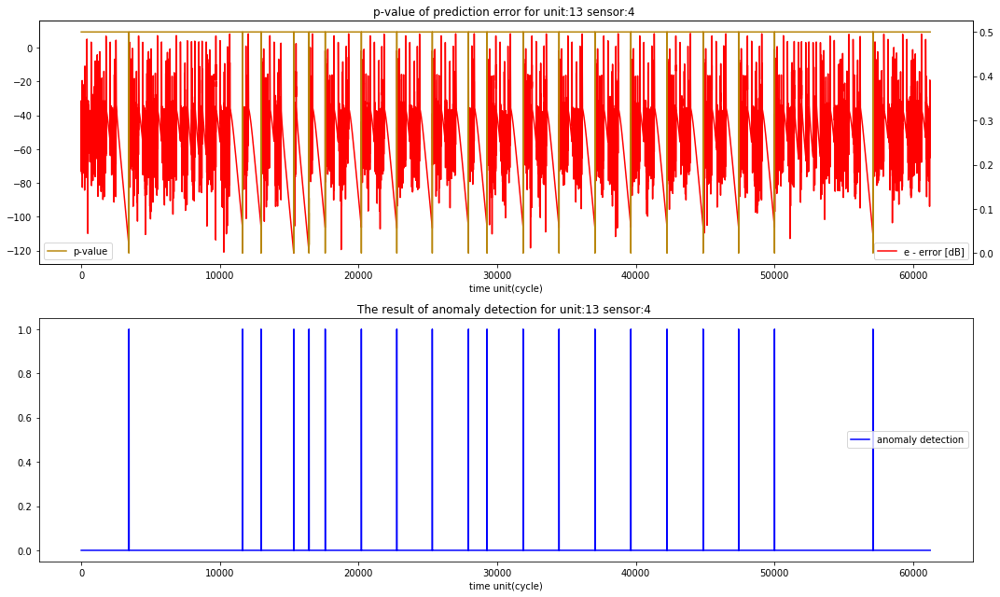

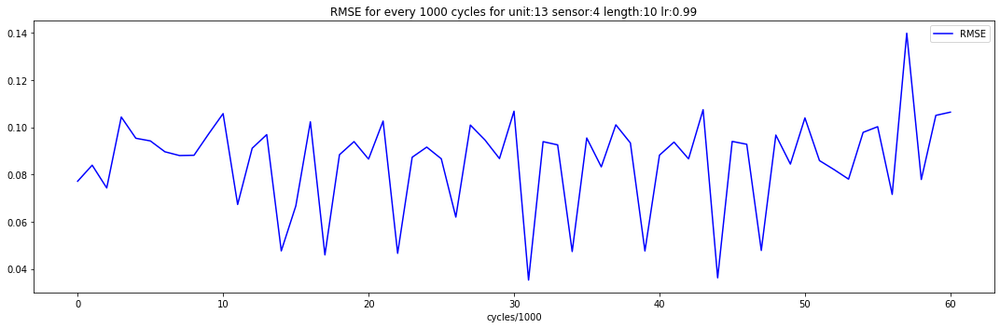

  1%|          | 3551/578483 [00:00<00:16, 35502.75it/s]

sensor loop 5: FLOWCOOLFLOWRATE
RLS for adaptation(other cycles)


  1%|▏         | 902/61238 [00:00<00:06, 9015.45it/s]

Initialized value of sensor 5 -  mu:[0.08115424], signma:[0.09554411], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:07<00:00, 8650.12it/s]


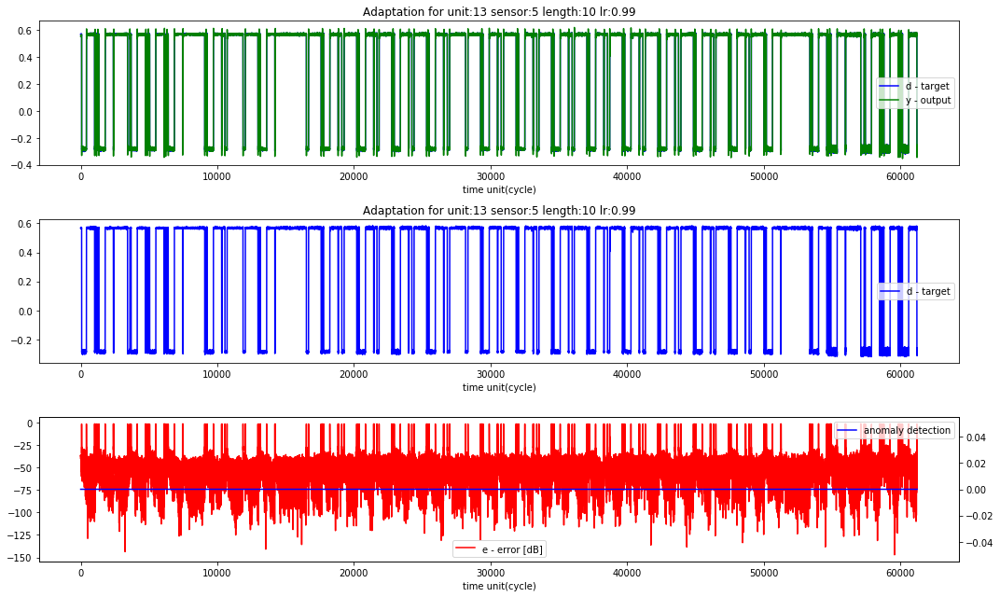

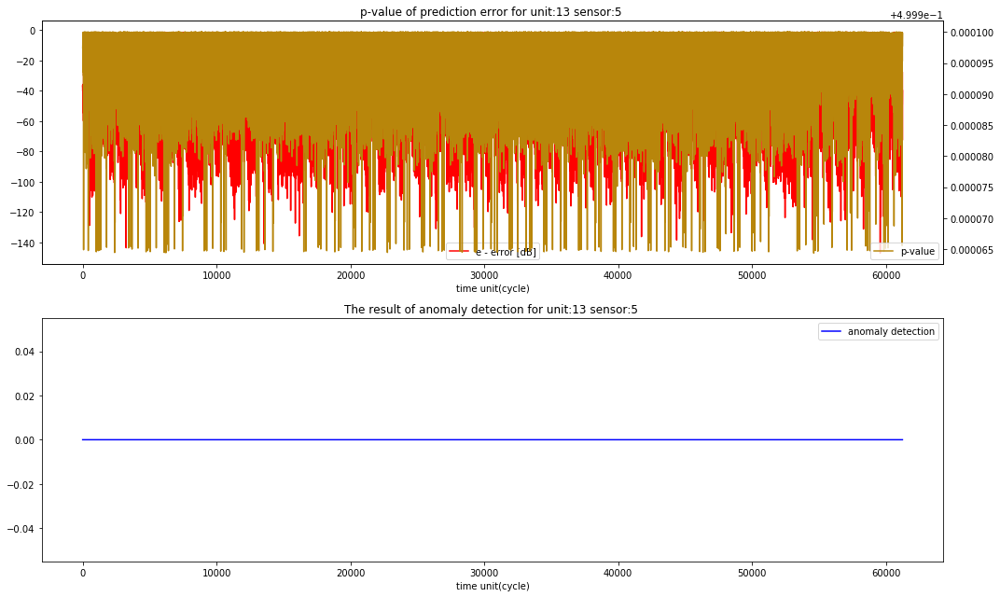

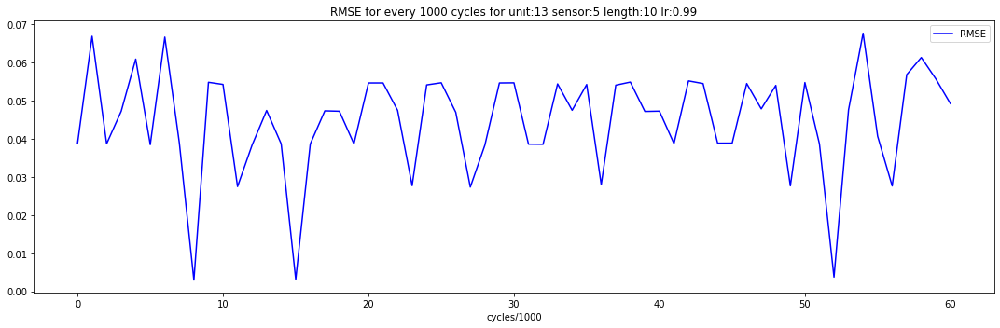

  1%|          | 3439/578483 [00:00<00:16, 34382.16it/s]

sensor loop 6: FLOWCOOLPRESSURE
RLS for adaptation(other cycles)


  1%|▏         | 873/61238 [00:00<00:06, 8727.89it/s]

Initialized value of sensor 6 -  mu:[0.03404139], signma:[0.03744594], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:07<00:00, 8621.95it/s]


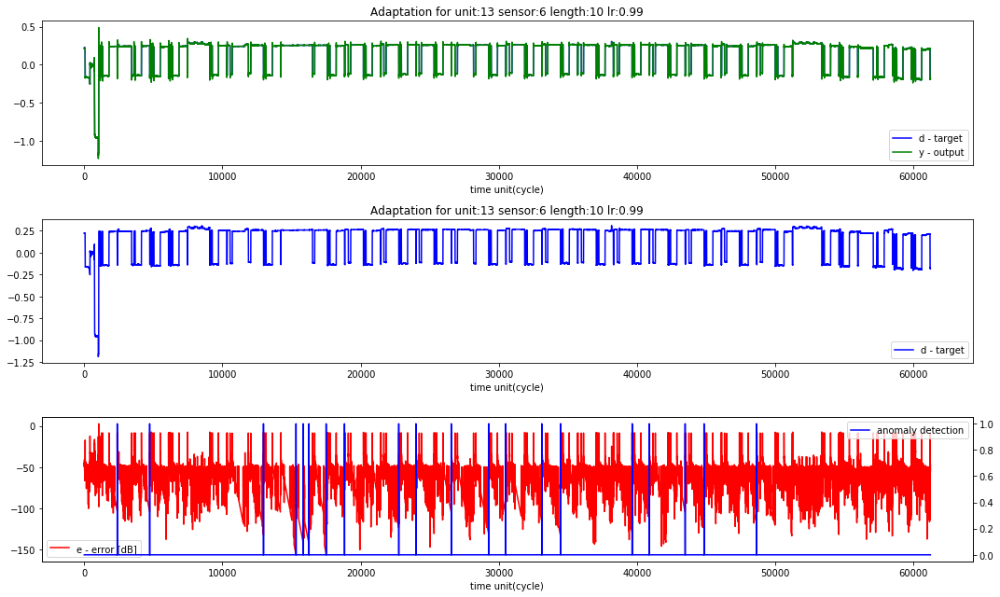

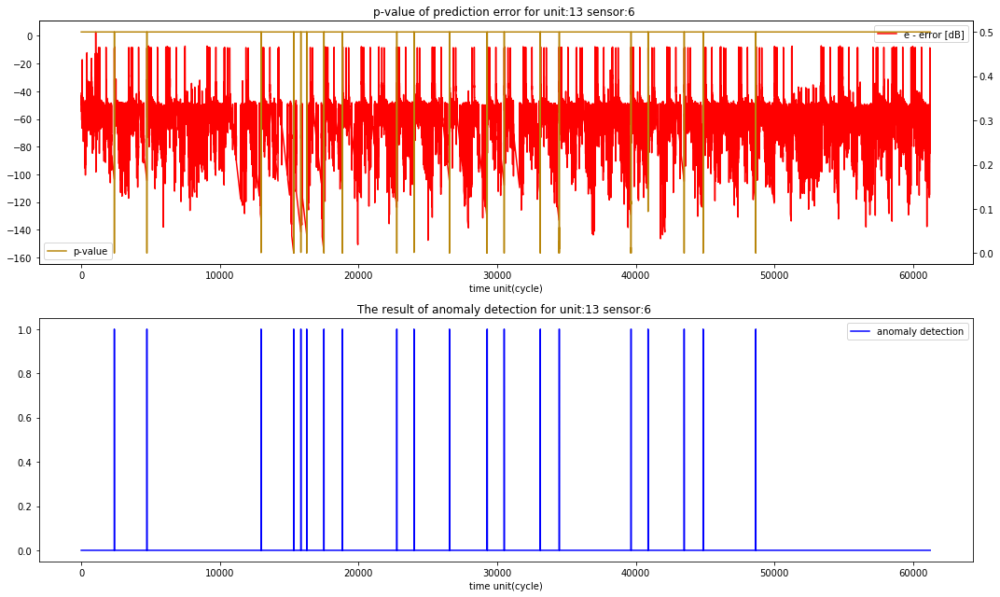

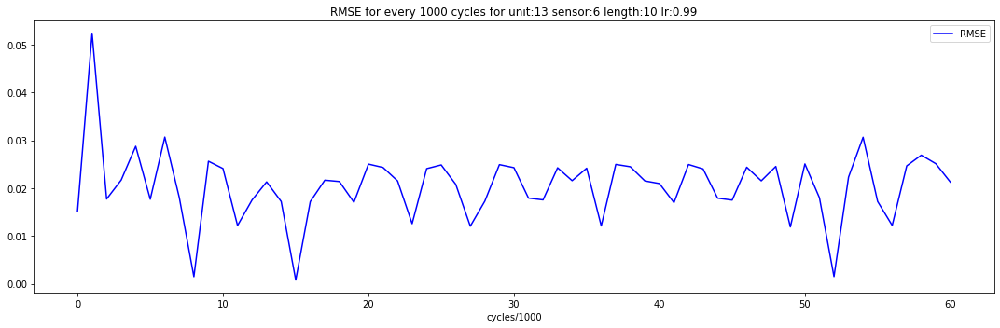

  1%|          | 3035/578483 [00:00<00:18, 30345.18it/s]

sensor loop 7: ETCHGASCHANNEL1READBACK
RLS for adaptation(other cycles)


  1%|▏         | 906/61238 [00:00<00:06, 9051.05it/s]

Initialized value of sensor 7 -  mu:[-0.26258589], signma:[0.27297603], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:06<00:00, 9223.09it/s]


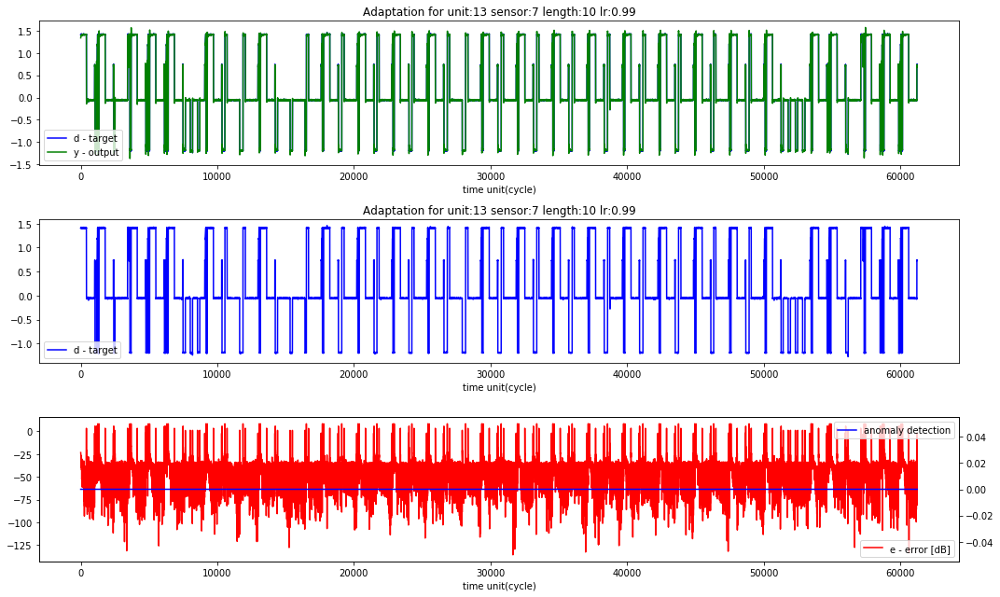

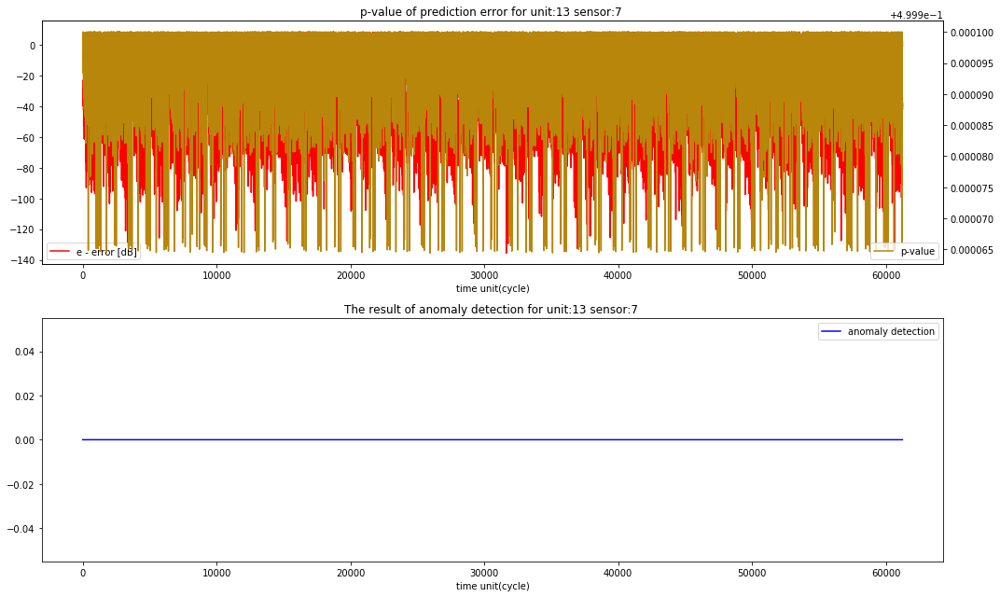

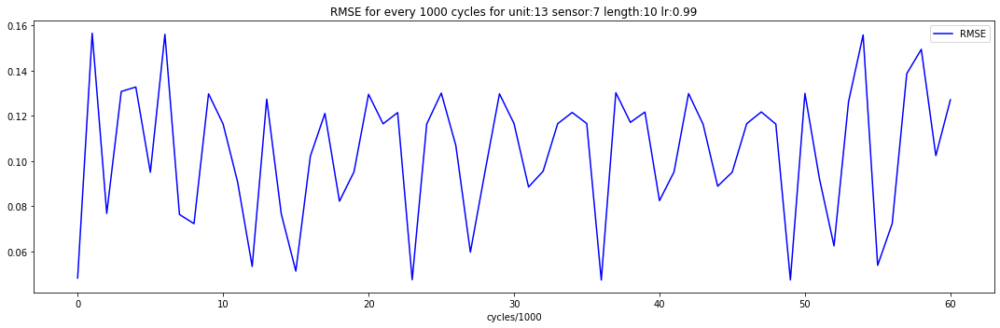

  1%|          | 3682/578483 [00:00<00:15, 36816.35it/s]

sensor loop 8: ETCHPBNGASREADBACK
RLS for adaptation(other cycles)


  1%|▏         | 869/61238 [00:00<00:06, 8681.73it/s]

Initialized value of sensor 8 -  mu:[0.00013051], signma:[0.00347721], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:06<00:00, 8800.10it/s]


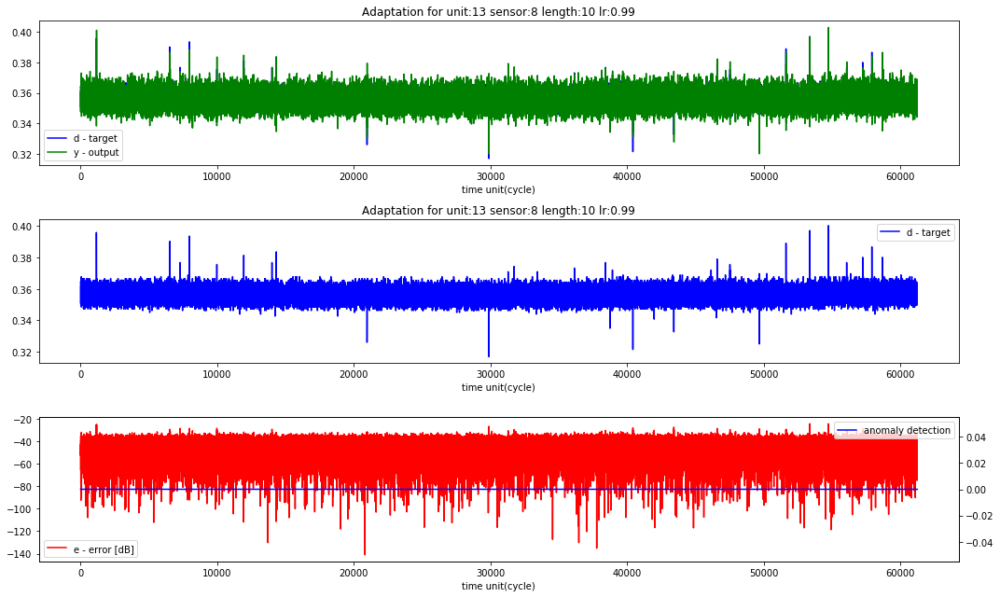

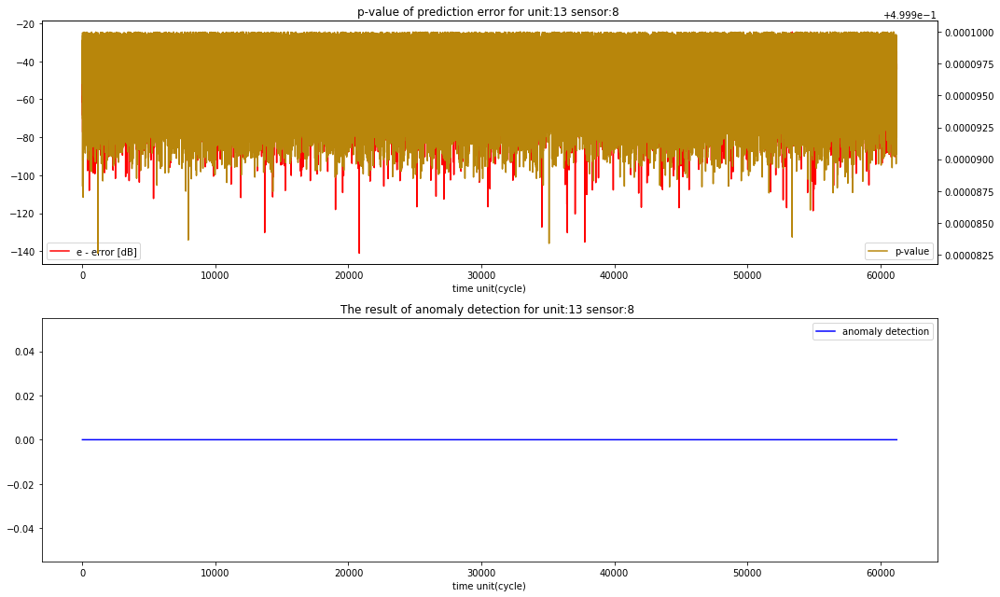

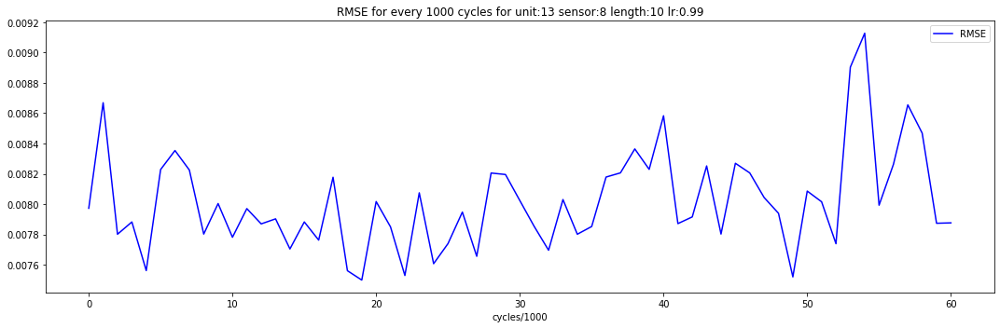

  1%|          | 3344/578483 [00:00<00:17, 33435.17it/s]

sensor loop 9: FIXTURETILTANGLE
RLS for adaptation(other cycles)


  1%|▏         | 785/61238 [00:00<00:07, 7843.95it/s]

Initialized value of sensor 9 -  mu:[-0.03207483], signma:[0.03373894], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:07<00:00, 8199.96it/s]


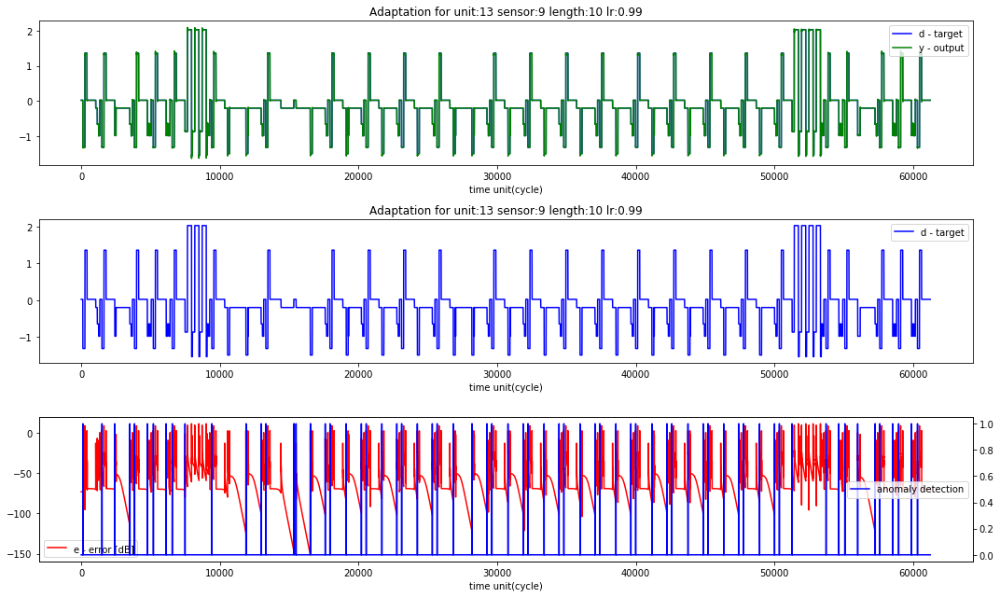

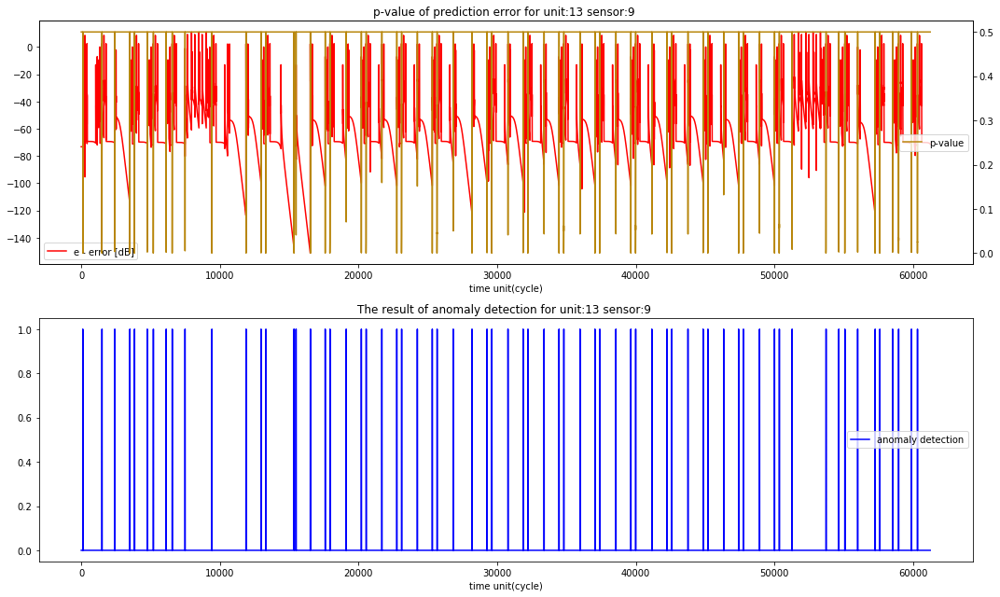

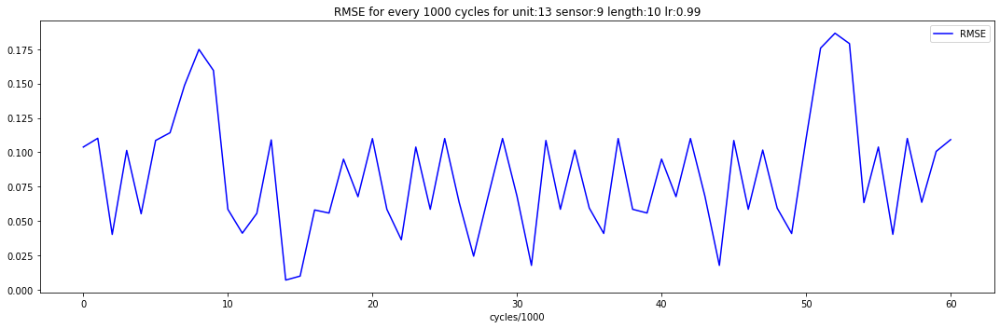

  1%|          | 3280/578483 [00:00<00:17, 32795.03it/s]

sensor loop 10: ACTUALSTEPDURATION
RLS for adaptation(other cycles)


  1%|▏         | 903/61238 [00:00<00:06, 9029.00it/s]

Initialized value of sensor 10 -  mu:[-0.0305821], signma:[0.00603266], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 61238/61238 [00:06<00:00, 9069.39it/s]


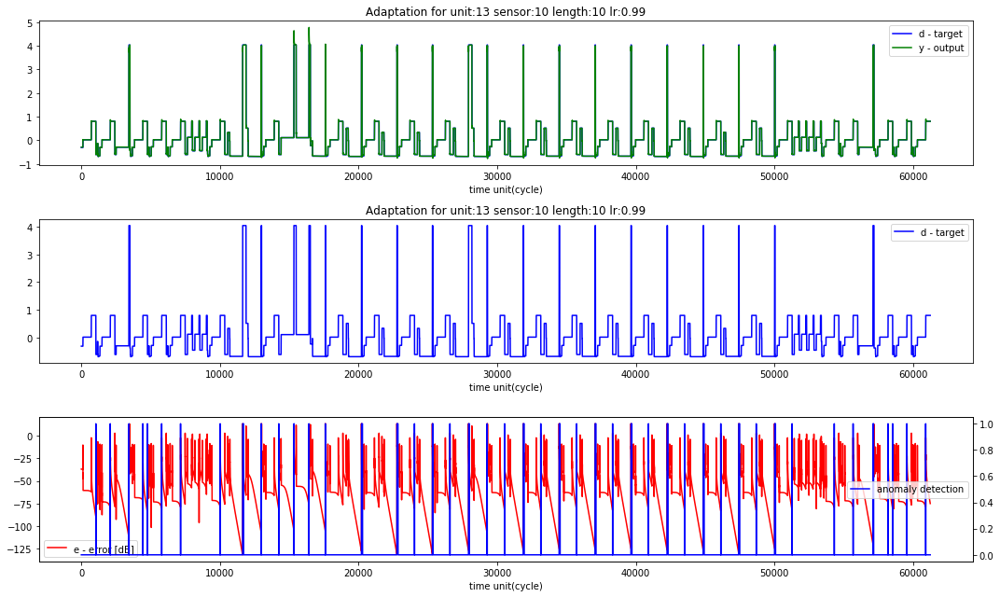

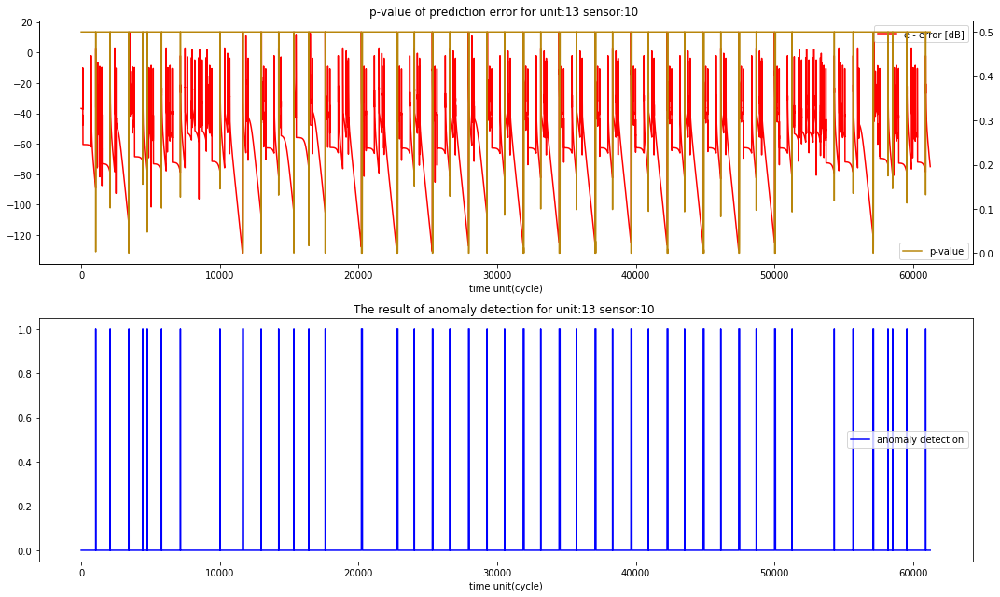

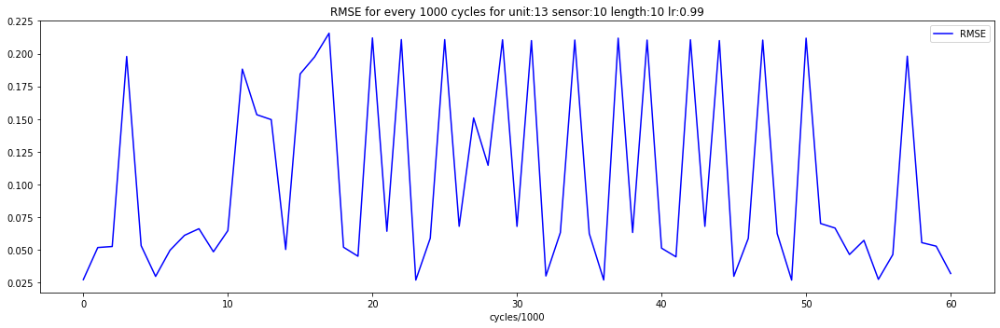

sequence_cols ['IONGAUGEPRESSURE', 'ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT', 'ETCHSUPPRESSORVOLTAGE', 'ETCHSUPPRESSORCURRENT', 'FLOWCOOLFLOWRATE', 'FLOWCOOLPRESSURE', 'ETCHGASCHANNEL1READBACK', 'ETCHPBNGASREADBACK', 'FIXTURETILTANGLE', 'ACTUALSTEPDURATION']
sequence generated, concatenating...
 data_matrix.shape (108317, 11)
 data_matrix.shape (61250, 11)
 data_matrix.shape (106375, 11)
 data_matrix.shape (56916, 11)
concatenated!
 data_matrix.shape (306920, 11)


  1%|          | 3048/332813 [00:00<00:10, 30474.94it/s]

sensor loop 0: IONGAUGEPRESSURE
RLS for adaptation(other cycles)


  0%|          | 887/306908 [00:00<00:34, 8868.63it/s]

Initialized value of sensor 0 -  mu:[-0.00336797], signma:[0.00371483], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:33<00:00, 9142.39it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


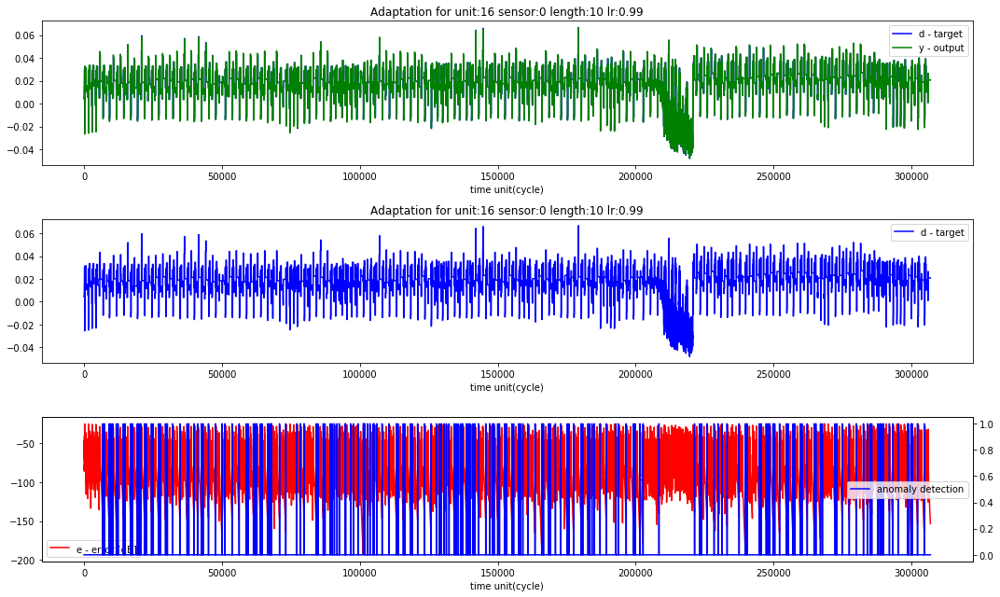

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


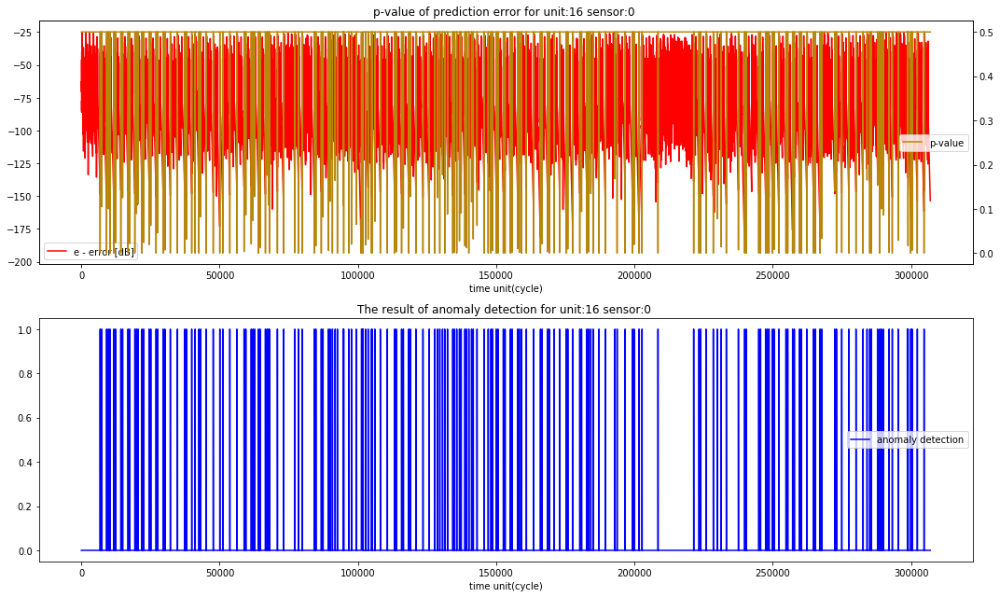

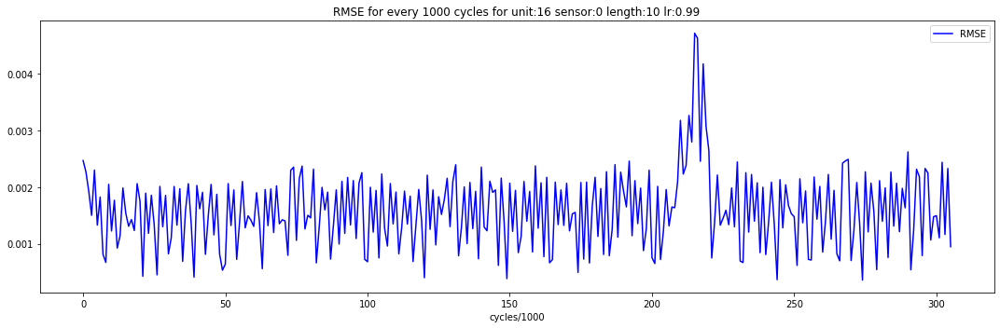

  1%|          | 3215/332813 [00:00<00:10, 32140.99it/s]

sensor loop 1: ETCHBEAMVOLTAGE
RLS for adaptation(other cycles)


  0%|          | 825/306908 [00:00<00:37, 8247.55it/s]

Initialized value of sensor 1 -  mu:[0.06562161], signma:[0.07251137], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:34<00:00, 8923.94it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


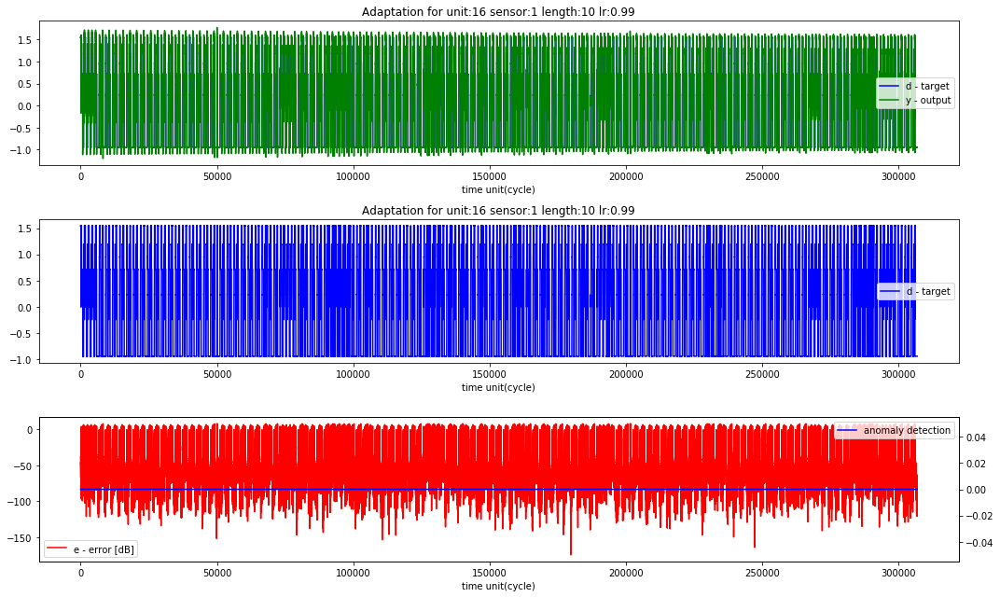

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


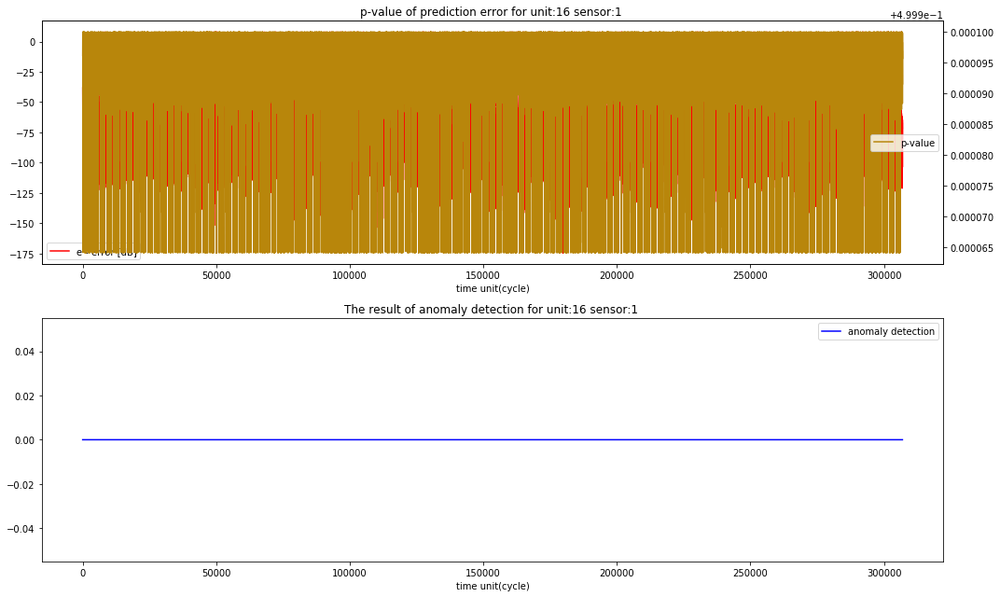

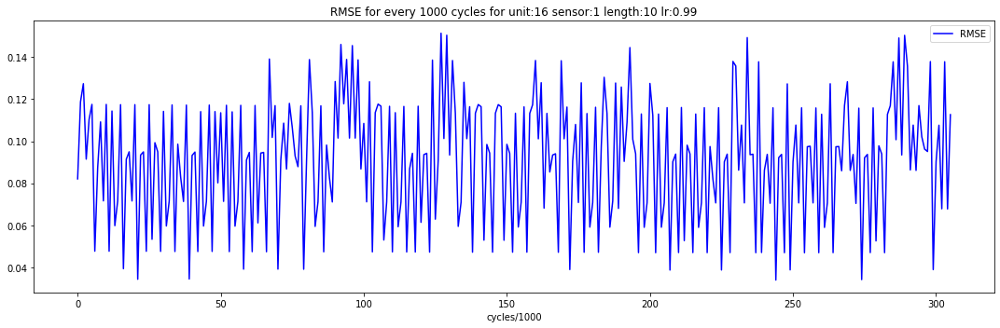

  1%|          | 3138/332813 [00:00<00:10, 31377.41it/s]

sensor loop 2: ETCHBEAMCURRENT
RLS for adaptation(other cycles)


  0%|          | 909/306908 [00:00<00:33, 9089.01it/s]

Initialized value of sensor 2 -  mu:[-0.01471555], signma:[0.04505807], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:33<00:00, 9188.78it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


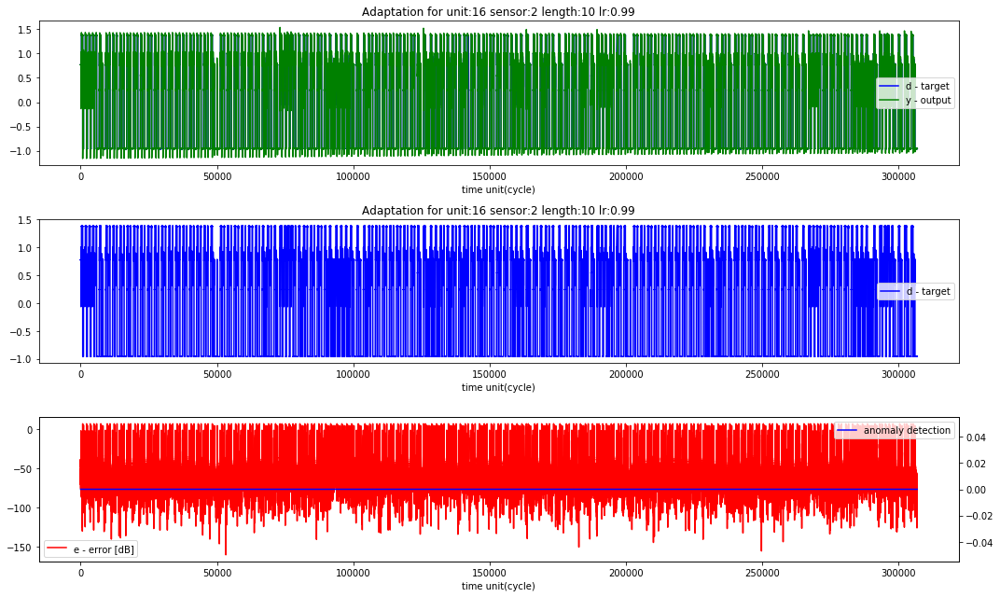

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


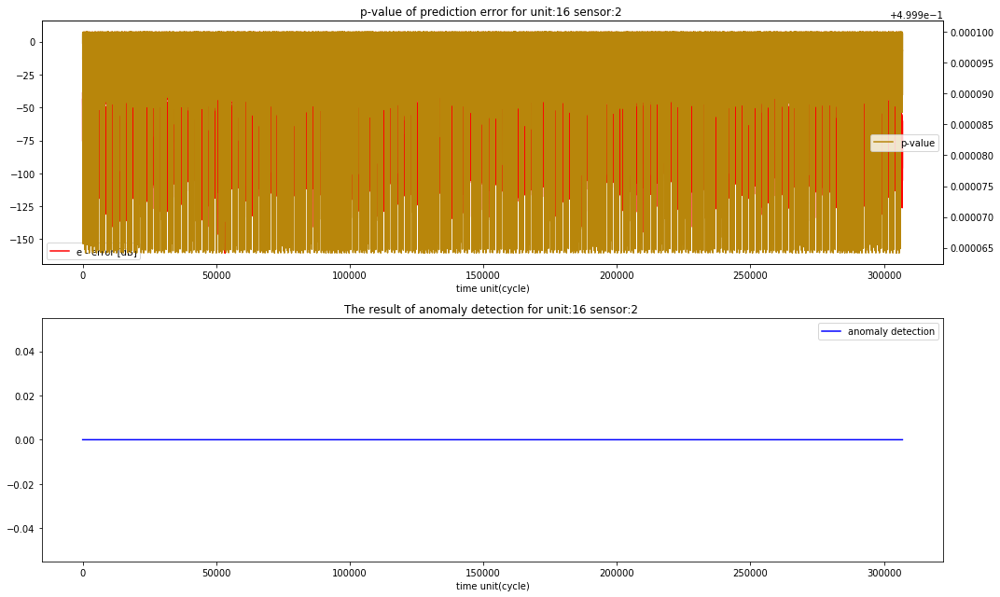

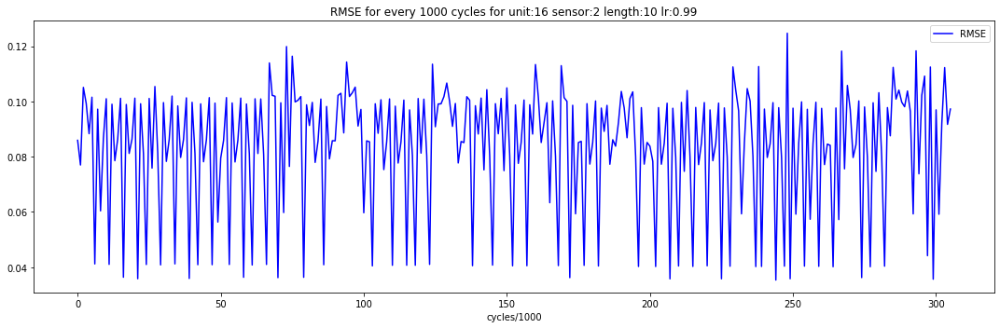

  1%|          | 3097/332813 [00:00<00:10, 30969.51it/s]

sensor loop 3: ETCHSUPPRESSORVOLTAGE
RLS for adaptation(other cycles)


  0%|          | 897/306908 [00:00<00:34, 8969.50it/s]

Initialized value of sensor 3 -  mu:[0.12053896], signma:[0.11955859], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:35<00:00, 8701.72it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


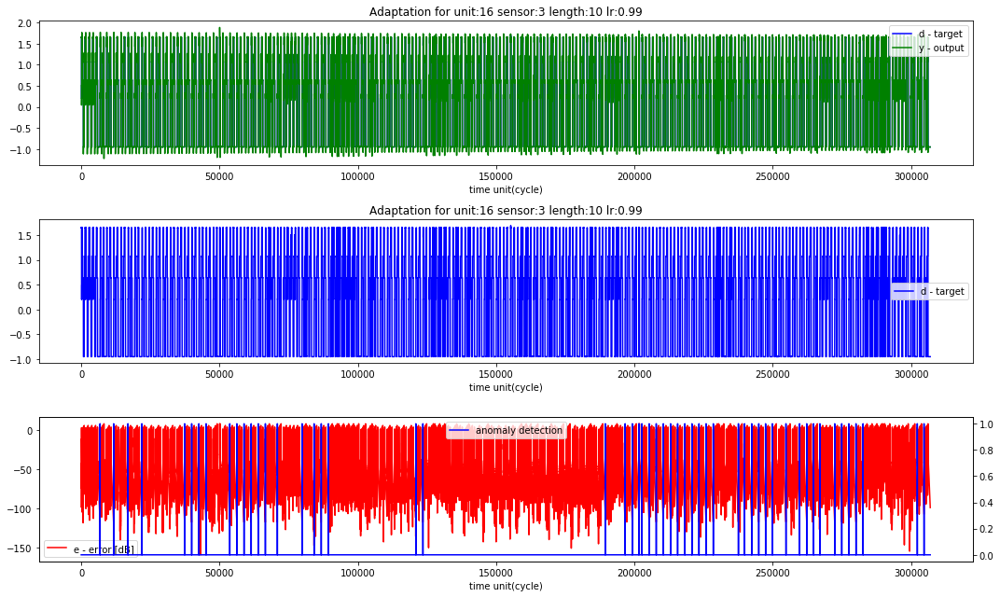

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


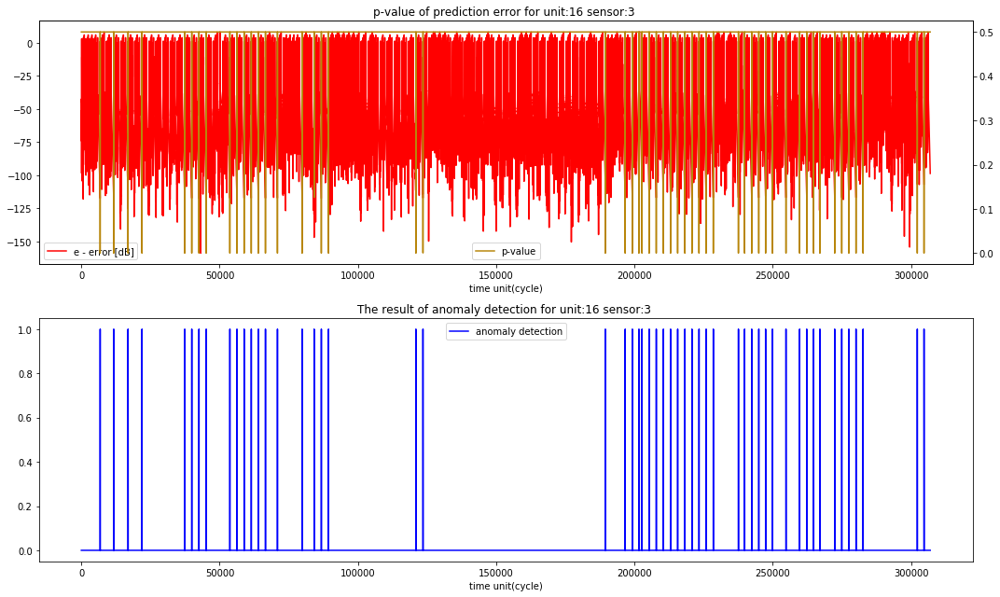

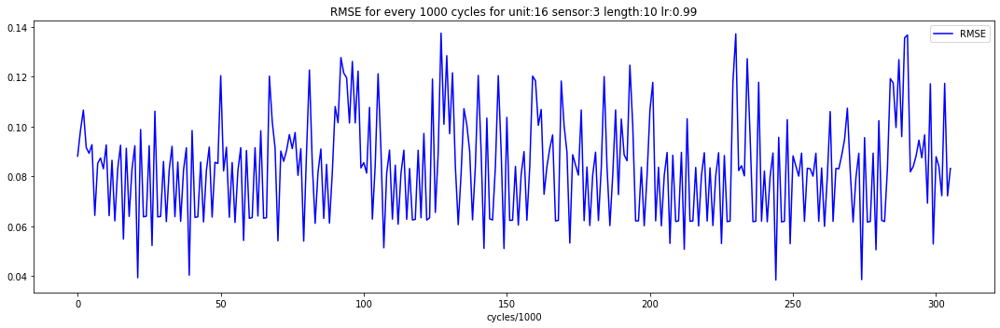

  1%|          | 3058/332813 [00:00<00:10, 30575.22it/s]

sensor loop 4: ETCHSUPPRESSORCURRENT
RLS for adaptation(other cycles)


  0%|          | 744/306908 [00:00<00:41, 7437.06it/s]

Initialized value of sensor 4 -  mu:[-0.03048813], signma:[0.06476916], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:34<00:00, 8829.07it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


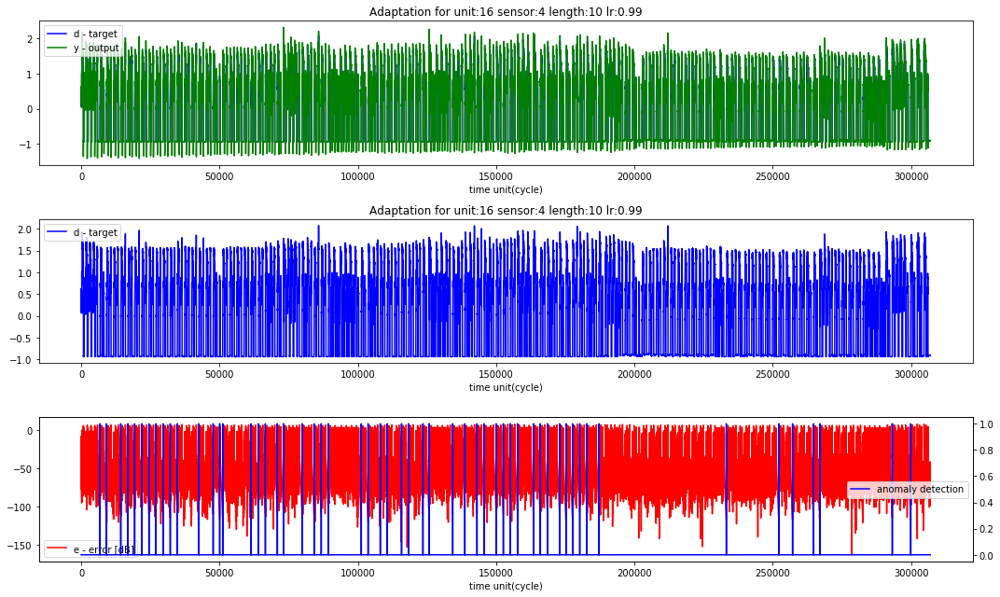

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


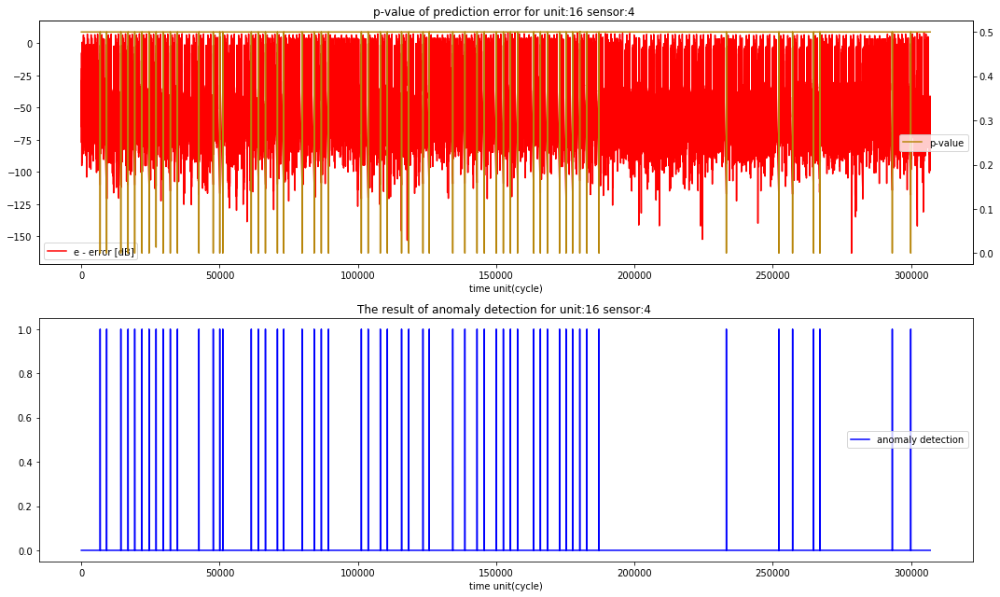

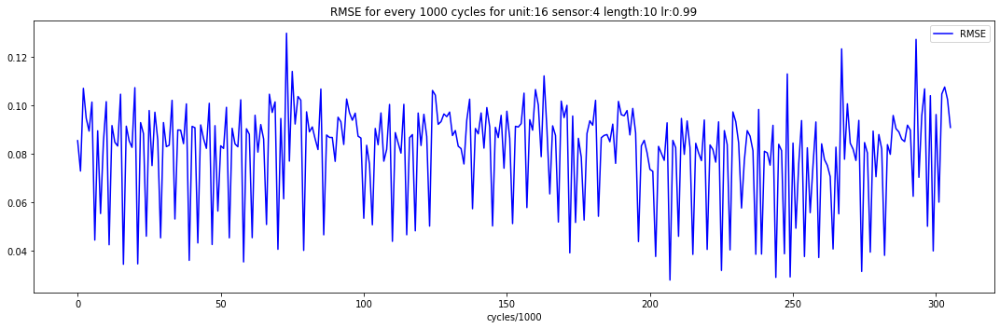

  1%|          | 3161/332813 [00:00<00:10, 31607.92it/s]

sensor loop 5: FLOWCOOLFLOWRATE
RLS for adaptation(other cycles)


  0%|          | 905/306908 [00:00<00:33, 9045.05it/s]

Initialized value of sensor 5 -  mu:[0.08109566], signma:[0.09515007], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:34<00:00, 8778.86it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


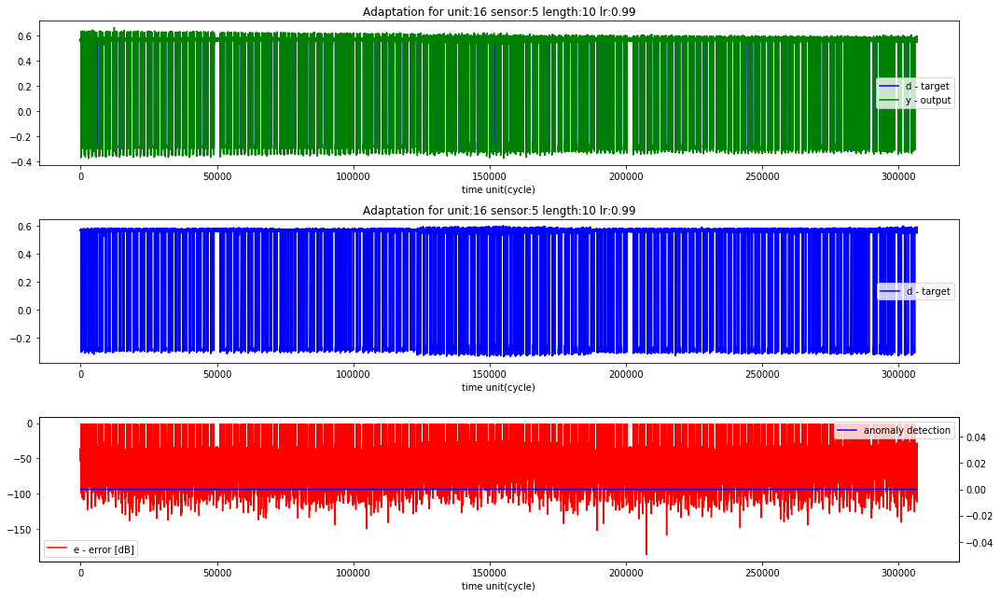

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


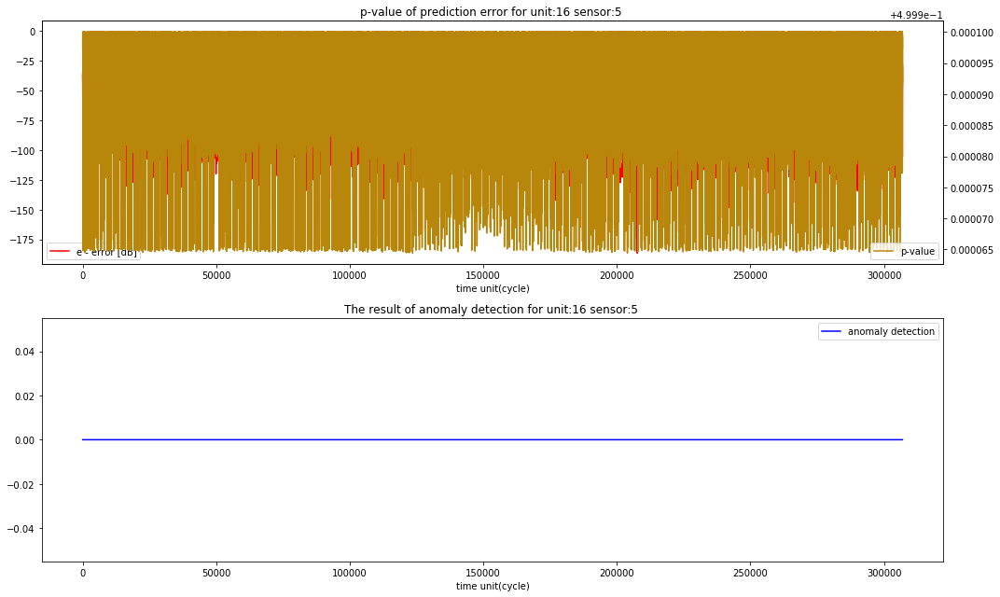

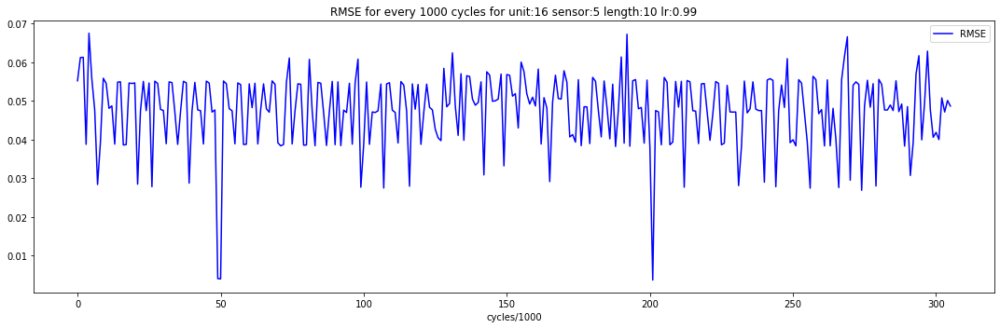

  1%|          | 2797/332813 [00:00<00:11, 27965.16it/s]

sensor loop 6: FLOWCOOLPRESSURE
RLS for adaptation(other cycles)


  0%|          | 921/306908 [00:00<00:33, 9203.91it/s]

Initialized value of sensor 6 -  mu:[0.033949], signma:[0.03730947], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:34<00:00, 8792.01it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


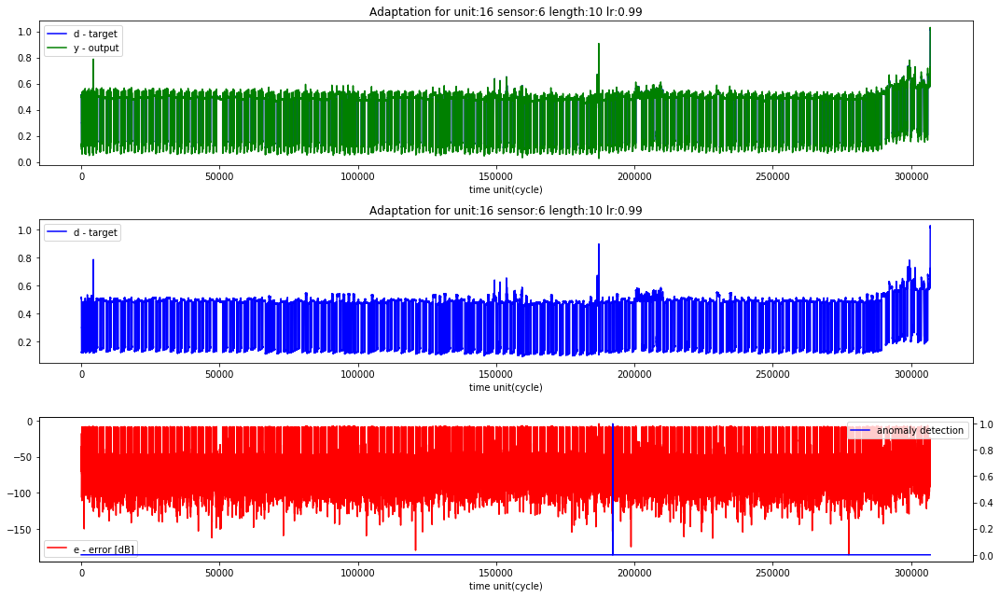

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


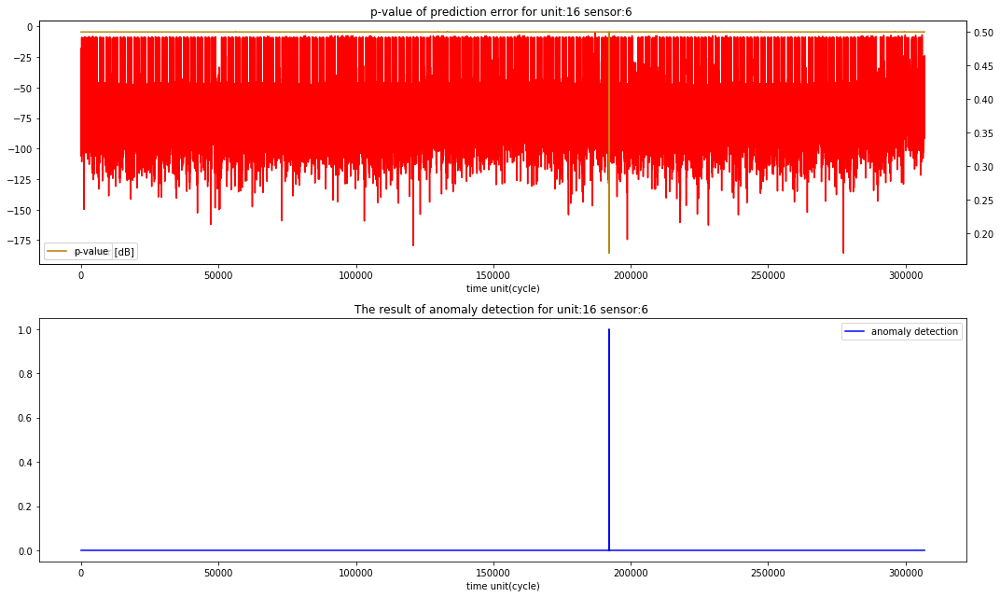

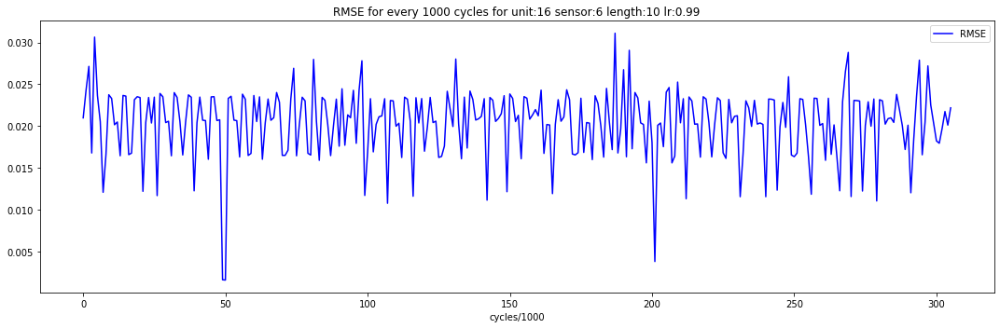

  1%|          | 3011/332813 [00:00<00:10, 30105.94it/s]

sensor loop 7: ETCHGASCHANNEL1READBACK
RLS for adaptation(other cycles)


  0%|          | 827/306908 [00:00<00:37, 8262.86it/s]

Initialized value of sensor 7 -  mu:[-0.26257634], signma:[0.27297381], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:34<00:00, 8882.87it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


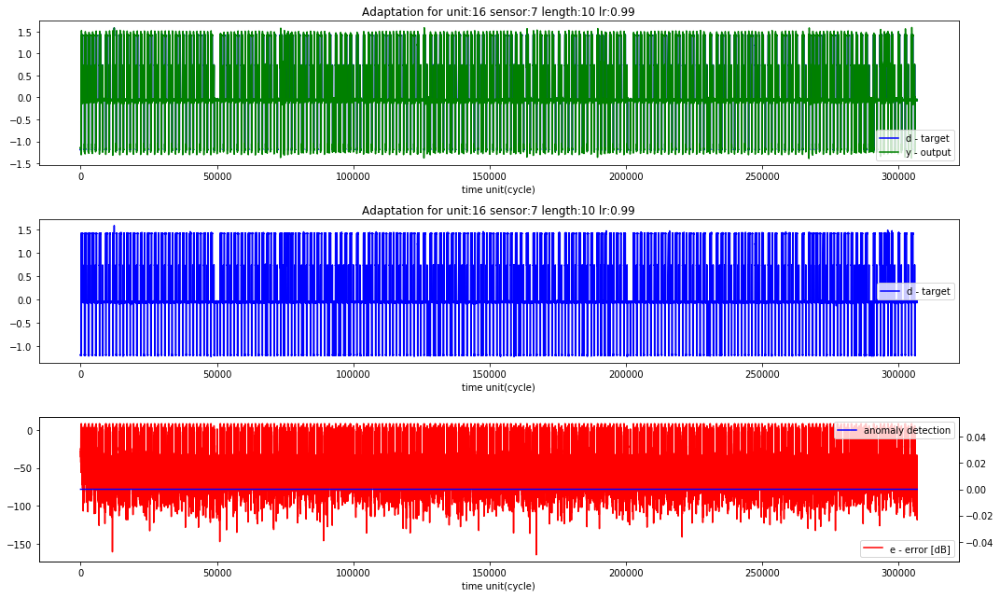

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


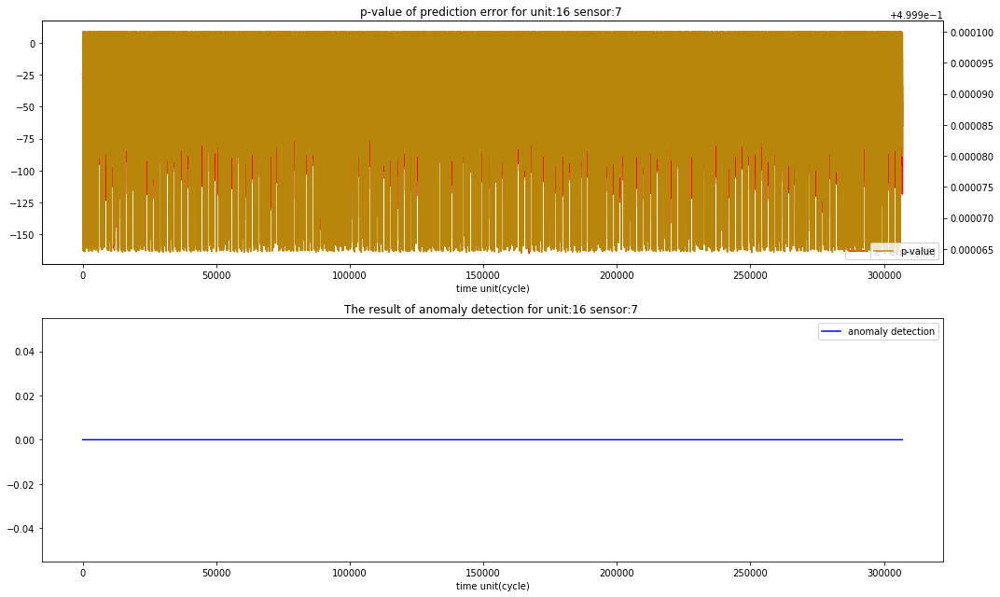

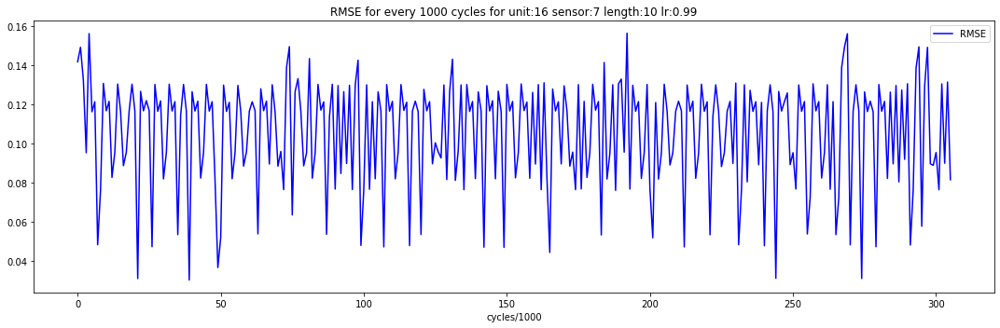

  1%|          | 3134/332813 [00:00<00:10, 31336.00it/s]

sensor loop 8: ETCHPBNGASREADBACK
RLS for adaptation(other cycles)


  0%|          | 857/306908 [00:00<00:35, 8565.68it/s]

Initialized value of sensor 8 -  mu:[-0.00014101], signma:[0.0025727], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:35<00:00, 8658.97it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


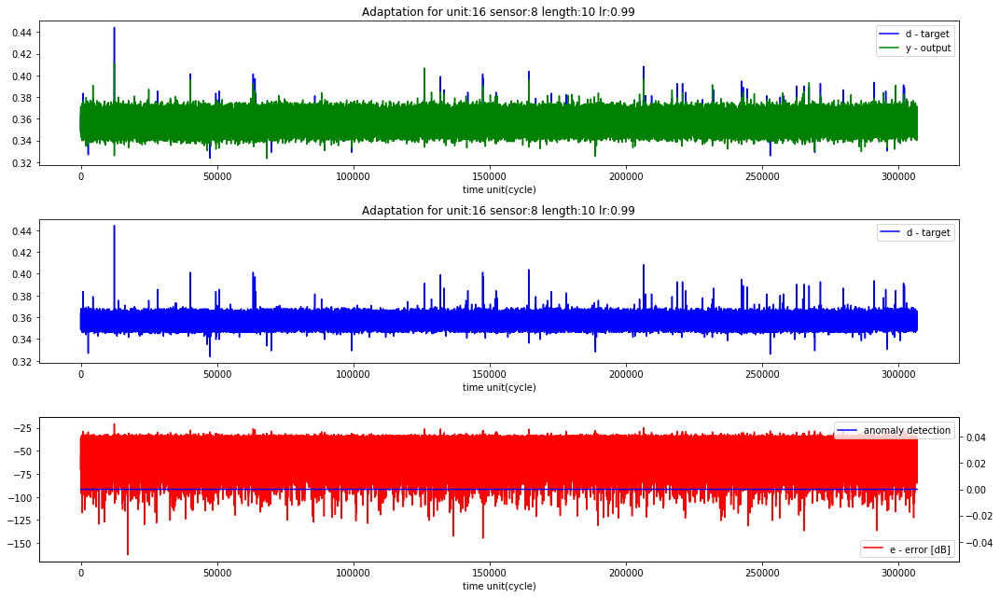

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


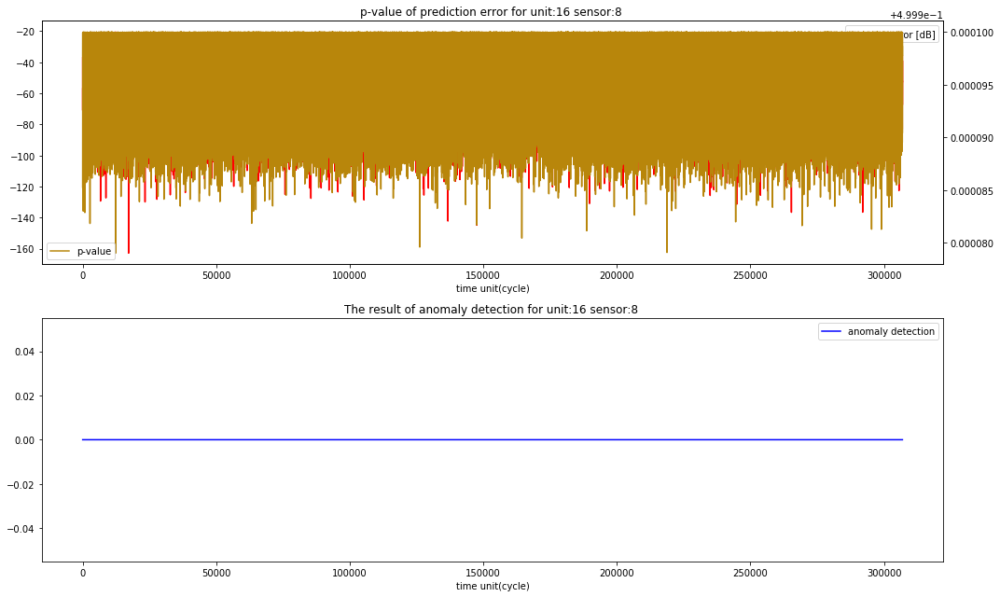

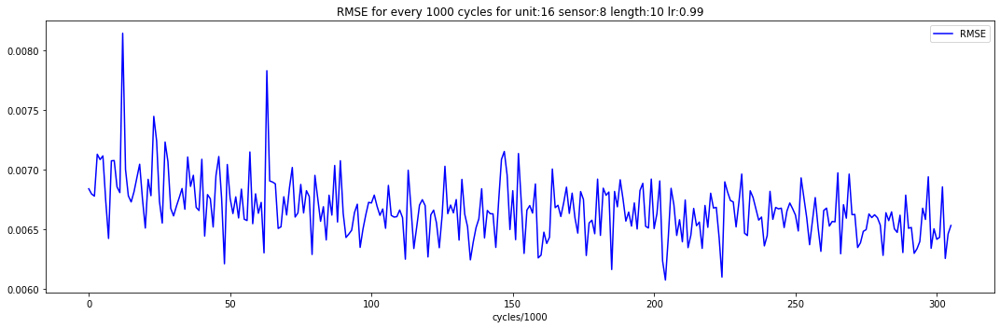

  1%|          | 2970/332813 [00:00<00:11, 29699.53it/s]

sensor loop 9: FIXTURETILTANGLE
RLS for adaptation(other cycles)


  0%|          | 904/306908 [00:00<00:33, 9038.52it/s]

Initialized value of sensor 9 -  mu:[-0.0320257], signma:[0.03374987], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:34<00:00, 8792.42it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


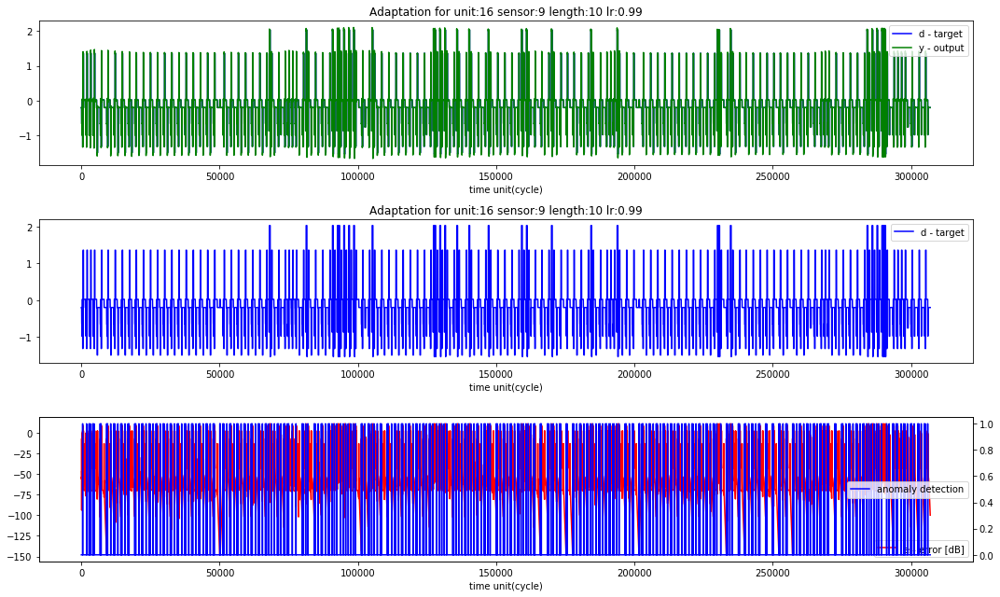

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


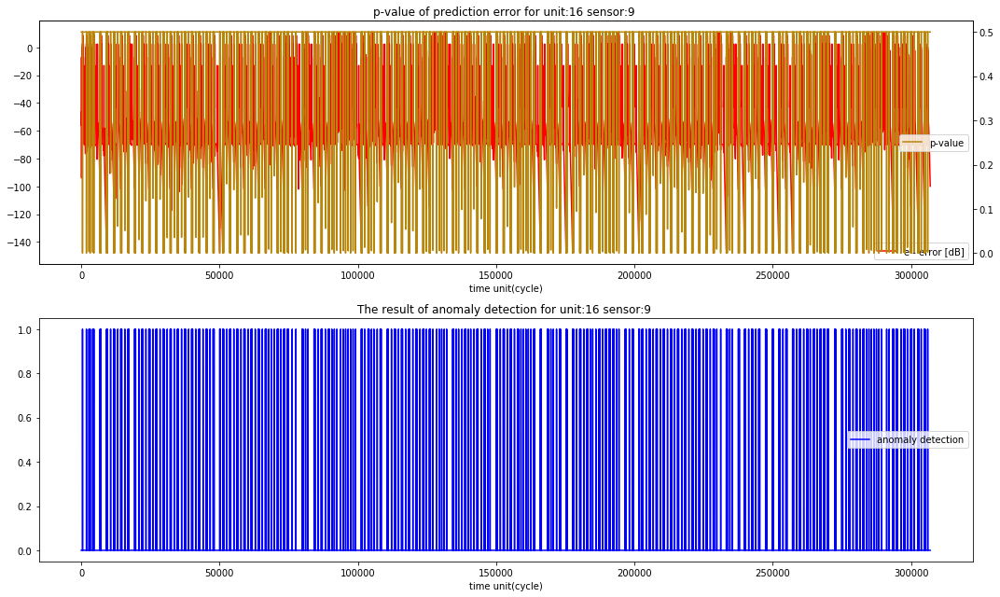

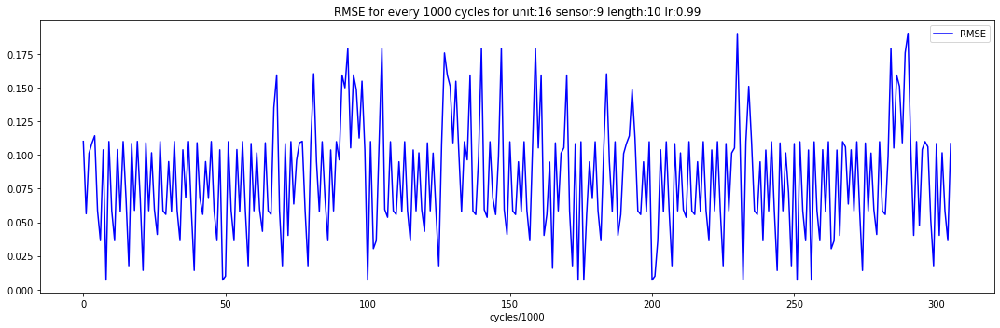

  1%|          | 3244/332813 [00:00<00:10, 32430.44it/s]

sensor loop 10: ACTUALSTEPDURATION
RLS for adaptation(other cycles)


  0%|          | 910/306908 [00:00<00:33, 9099.64it/s]

Initialized value of sensor 10 -  mu:[-0.03089413], signma:[0.00594698], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 306908/306908 [00:33<00:00, 9093.91it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


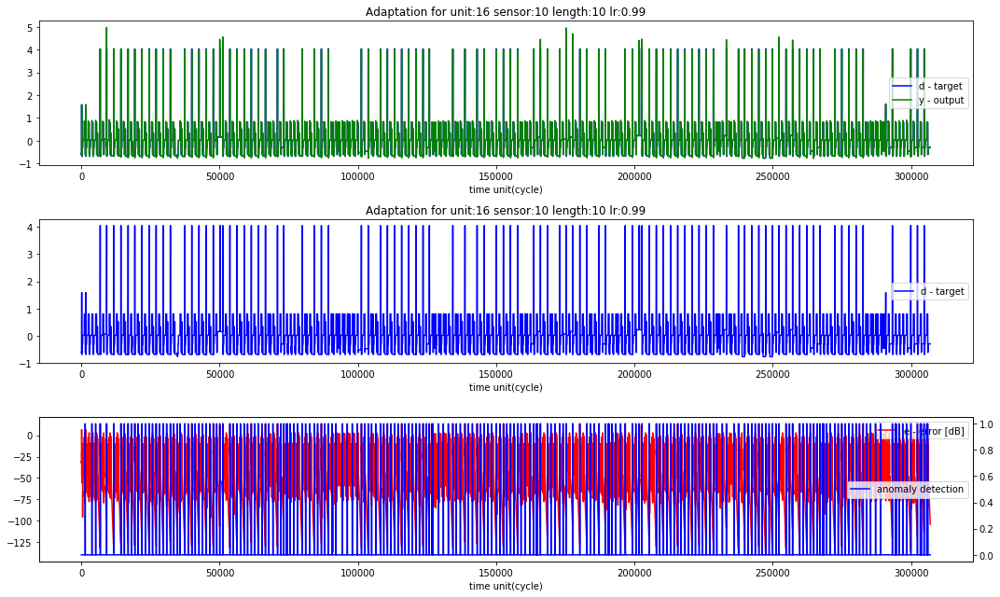

/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:286: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.


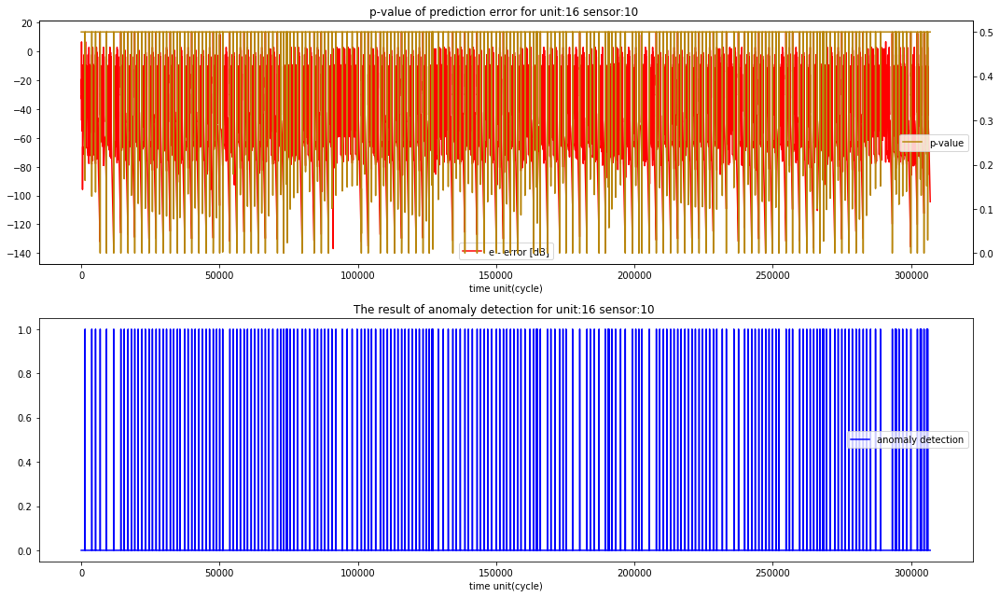

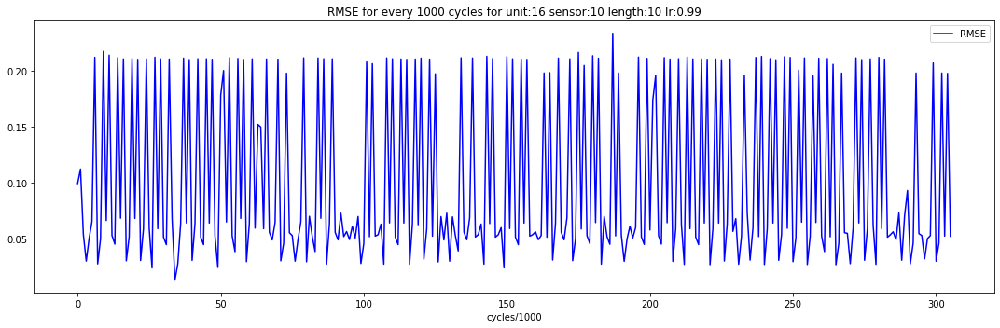

sequence_cols ['IONGAUGEPRESSURE', 'ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT', 'ETCHSUPPRESSORVOLTAGE', 'ETCHSUPPRESSORCURRENT', 'FLOWCOOLFLOWRATE', 'FLOWCOOLPRESSURE', 'ETCHGASCHANNEL1READBACK', 'ETCHPBNGASREADBACK', 'FIXTURETILTANGLE', 'ACTUALSTEPDURATION']
sequence generated, concatenating...
 data_matrix.shape (108317, 11)
 data_matrix.shape (61250, 11)
 data_matrix.shape (306920, 11)
 data_matrix.shape (56916, 11)
concatenated!
 data_matrix.shape (106375, 11)


  1%|          | 3115/533358 [00:00<00:17, 31146.24it/s]

sensor loop 0: IONGAUGEPRESSURE
RLS for adaptation(other cycles)


  1%|          | 929/106363 [00:00<00:11, 9288.50it/s]

Initialized value of sensor 0 -  mu:[-0.00336577], signma:[0.00371409], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:11<00:00, 9099.73it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


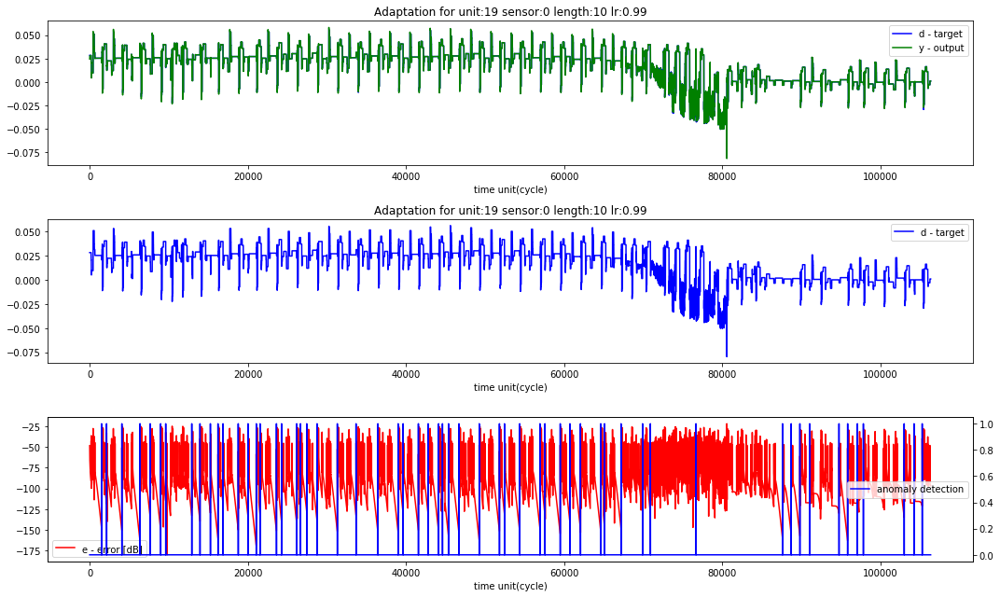

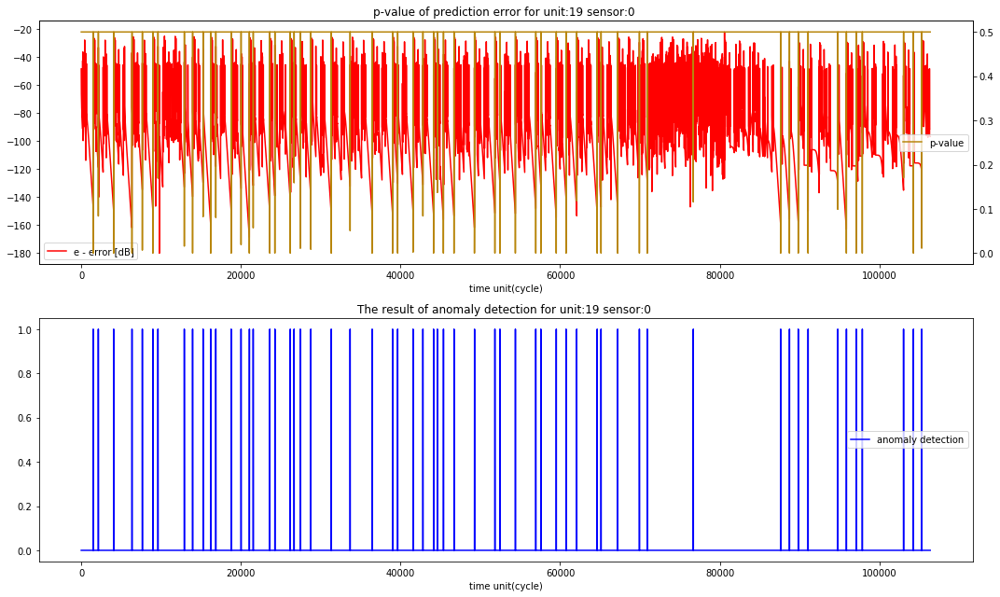

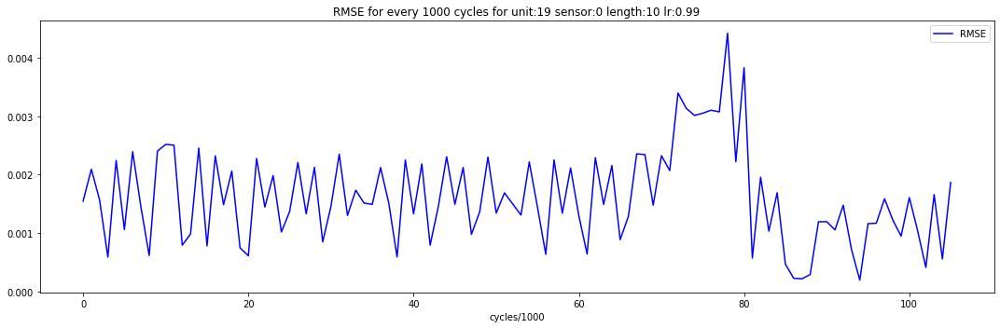

  1%|          | 3436/533358 [00:00<00:15, 34355.20it/s]

sensor loop 1: ETCHBEAMVOLTAGE
RLS for adaptation(other cycles)


  1%|          | 907/106363 [00:00<00:11, 9060.42it/s]

Initialized value of sensor 1 -  mu:[0.06557768], signma:[0.07253127], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:12<00:00, 8757.48it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


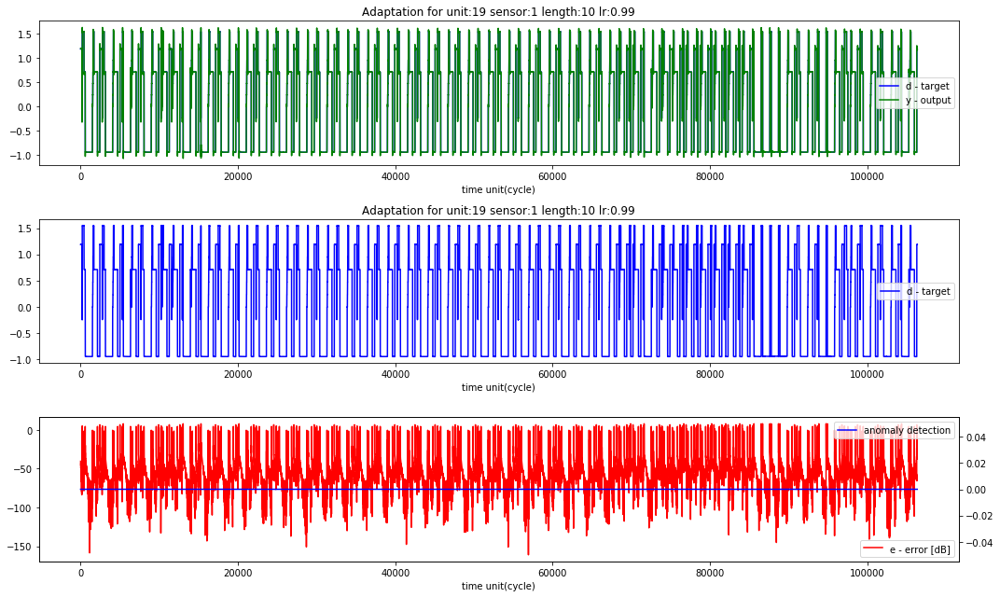

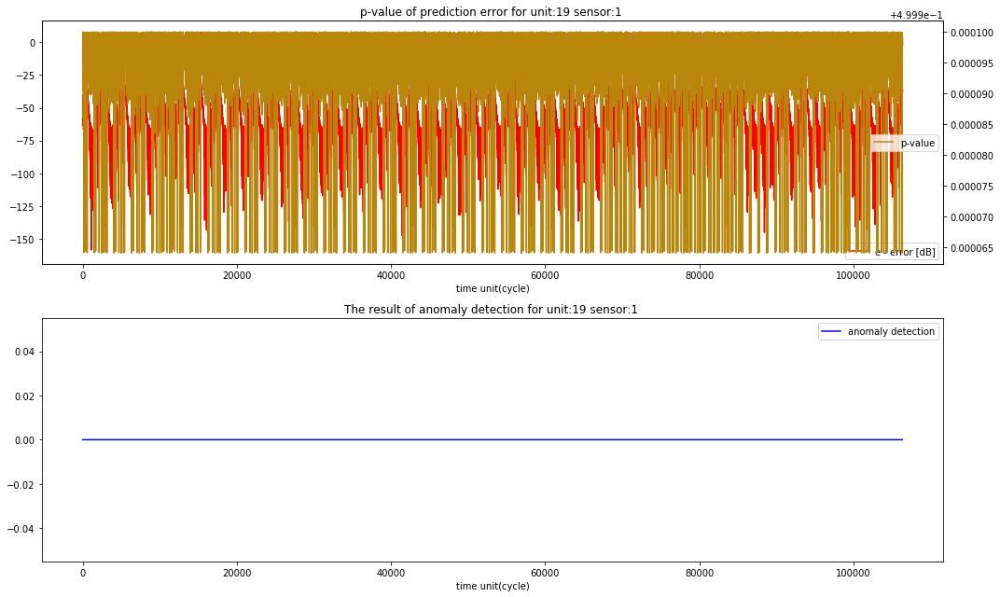

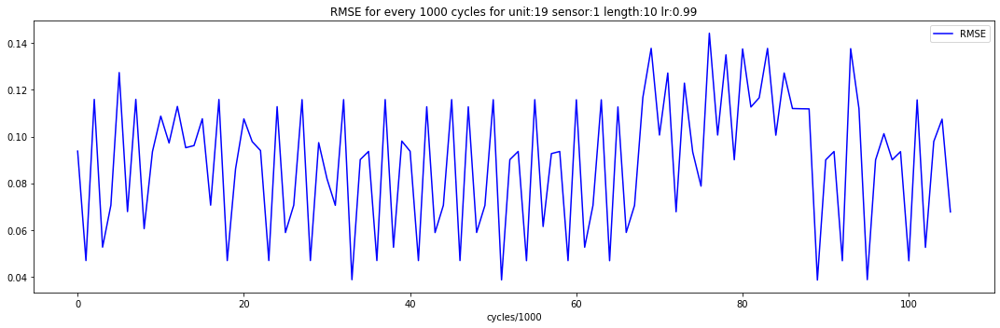

  1%|          | 3559/533358 [00:00<00:14, 35588.51it/s]

sensor loop 2: ETCHBEAMCURRENT
RLS for adaptation(other cycles)


  1%|          | 912/106363 [00:00<00:11, 9110.97it/s]

Initialized value of sensor 2 -  mu:[-0.01505014], signma:[0.04553534], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:13<00:00, 8130.36it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


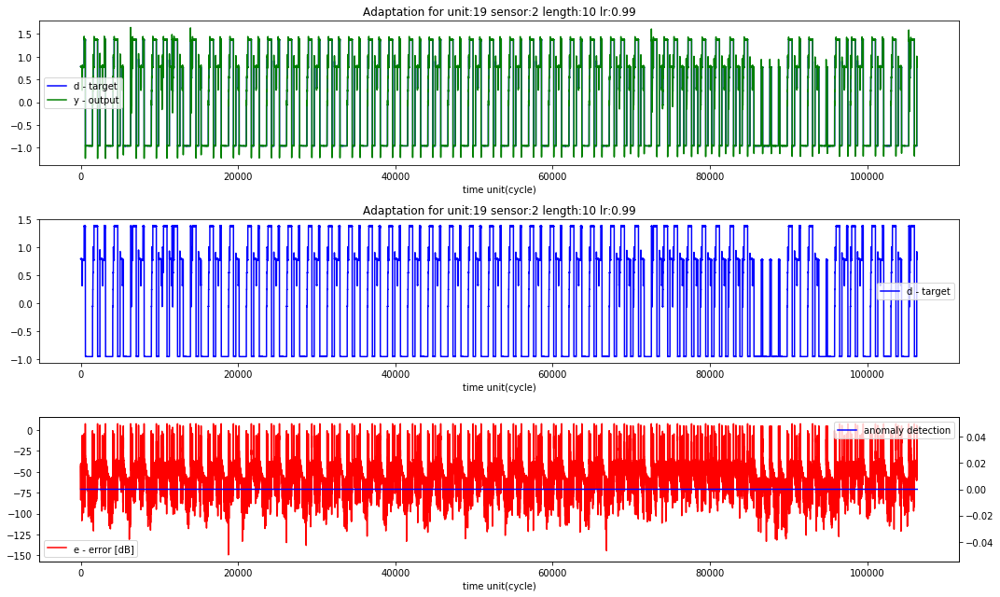

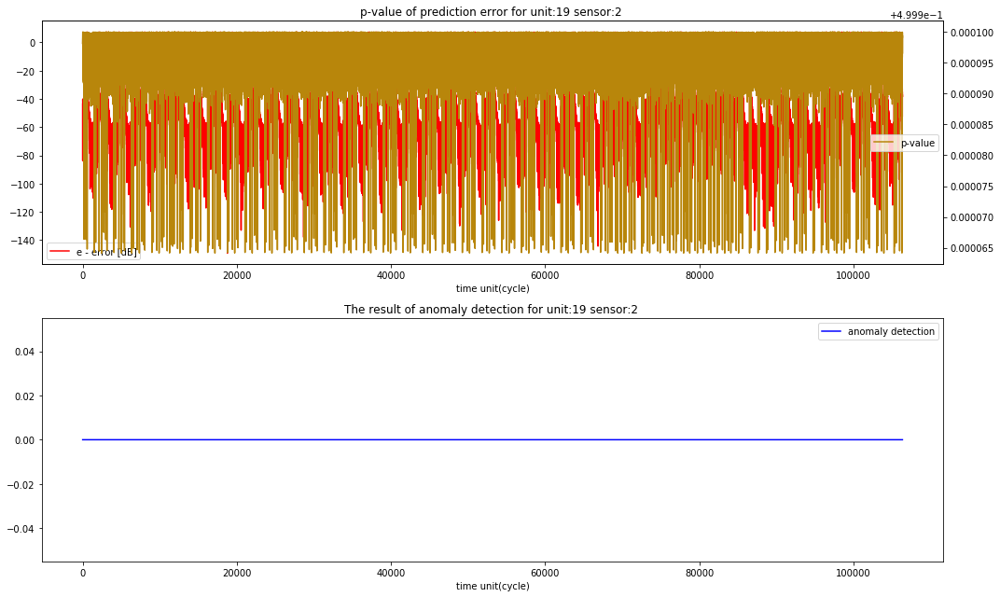

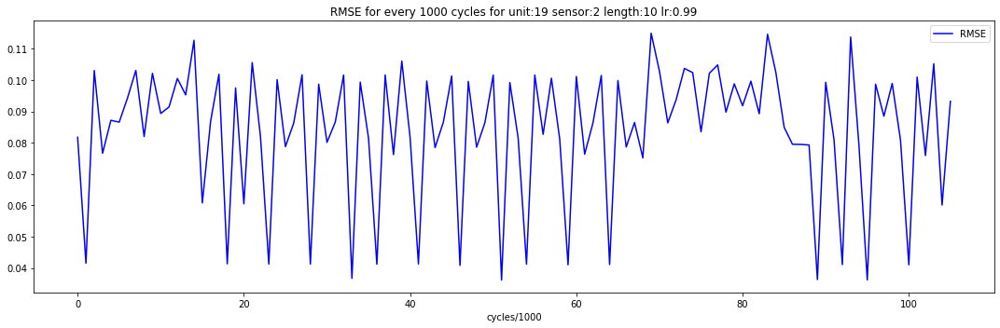

  1%|          | 3695/533358 [00:00<00:14, 36944.40it/s]

sensor loop 3: ETCHSUPPRESSORVOLTAGE
RLS for adaptation(other cycles)


  1%|          | 911/106363 [00:00<00:11, 9104.06it/s]

Initialized value of sensor 3 -  mu:[0.12050833], signma:[0.11819269], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:12<00:00, 8436.16it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


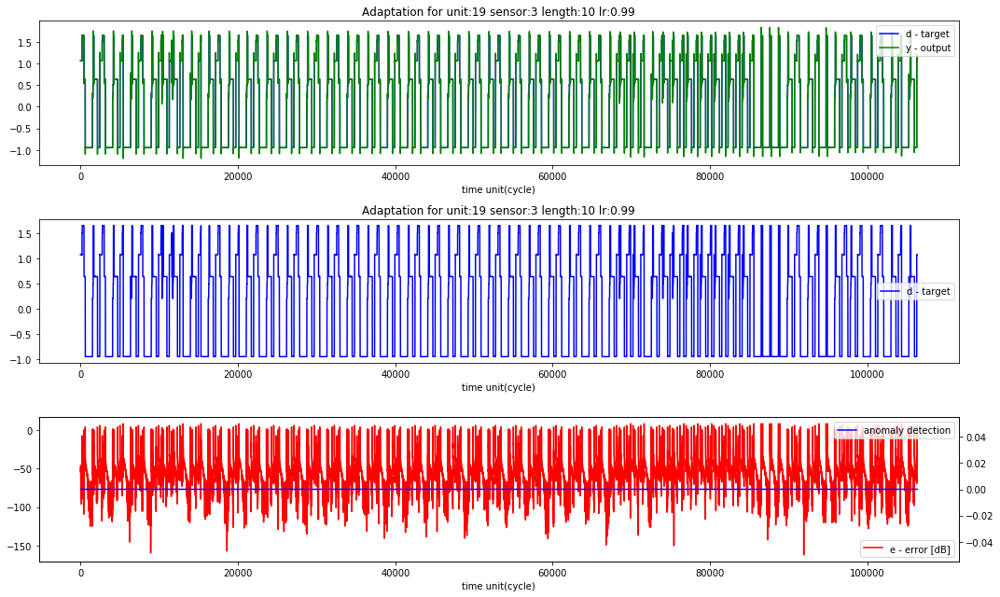

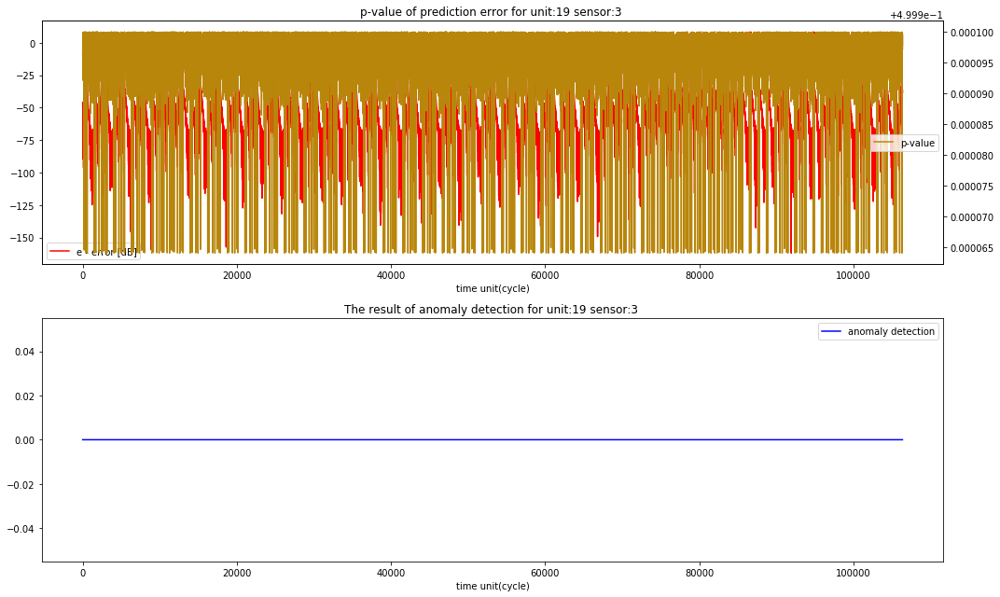

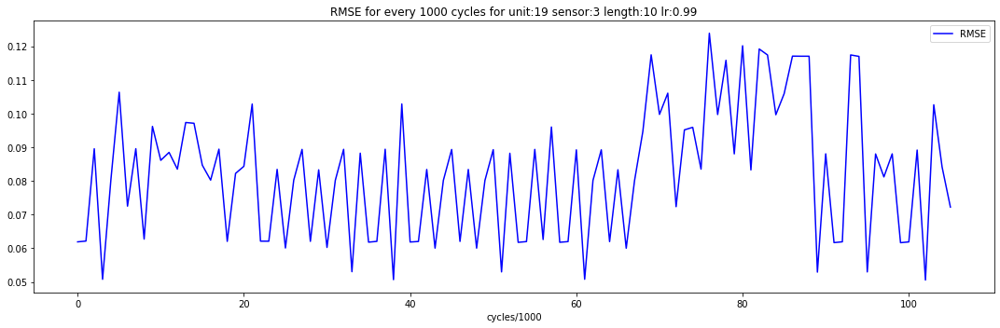

  1%|          | 3343/533358 [00:00<00:15, 33427.32it/s]

sensor loop 4: ETCHSUPPRESSORCURRENT
RLS for adaptation(other cycles)


  1%|          | 910/106363 [00:00<00:11, 9094.67it/s]

Initialized value of sensor 4 -  mu:[-0.0290457], signma:[0.05938845], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:11<00:00, 9264.50it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


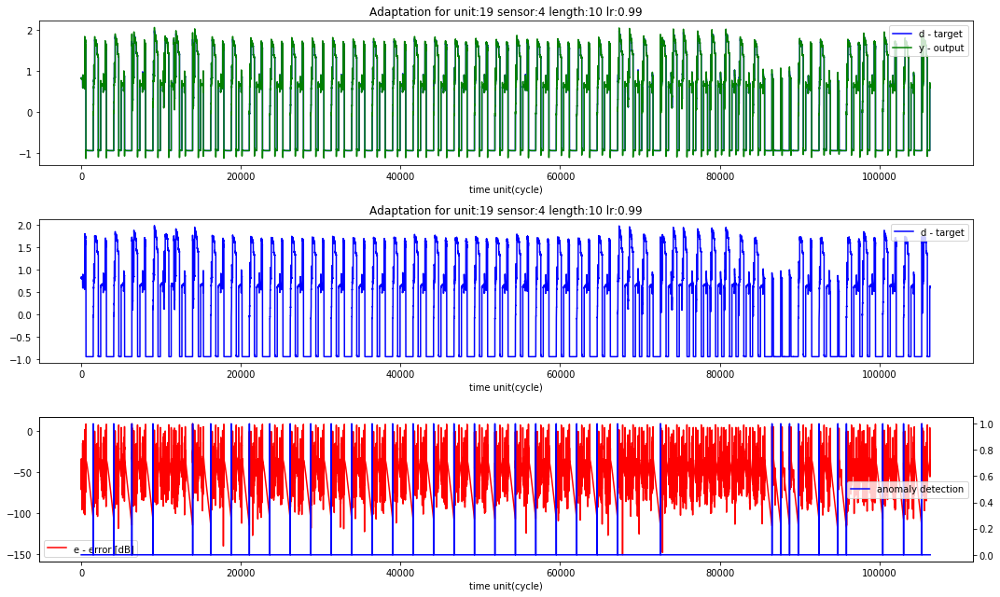

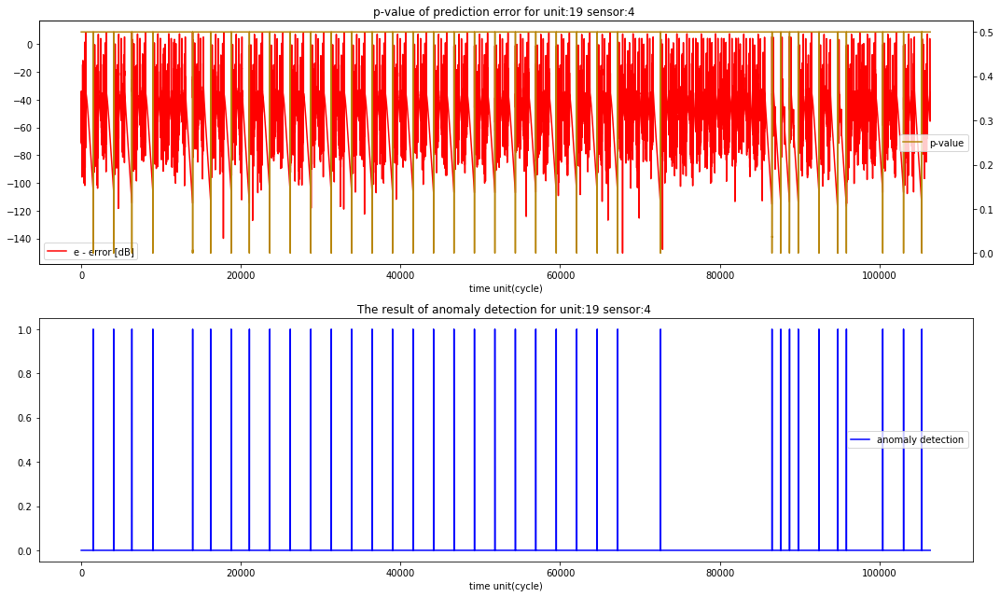

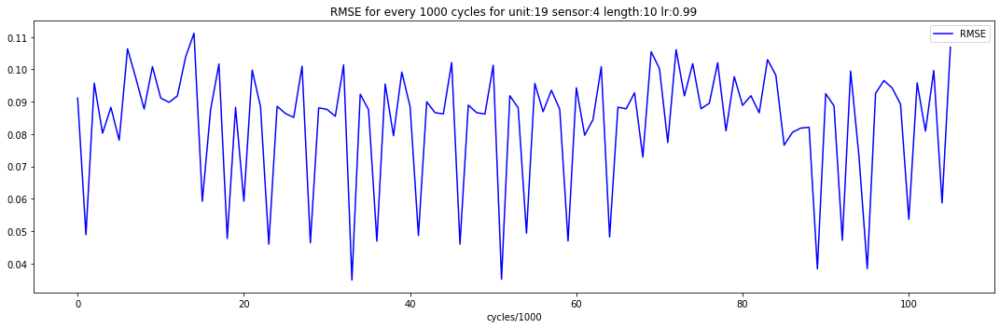

  1%|          | 3649/533358 [00:00<00:14, 36486.56it/s]

sensor loop 5: FLOWCOOLFLOWRATE
RLS for adaptation(other cycles)


  1%|          | 937/106363 [00:00<00:11, 9369.63it/s]

Initialized value of sensor 5 -  mu:[0.08111424], signma:[0.0951307], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:11<00:00, 8984.10it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


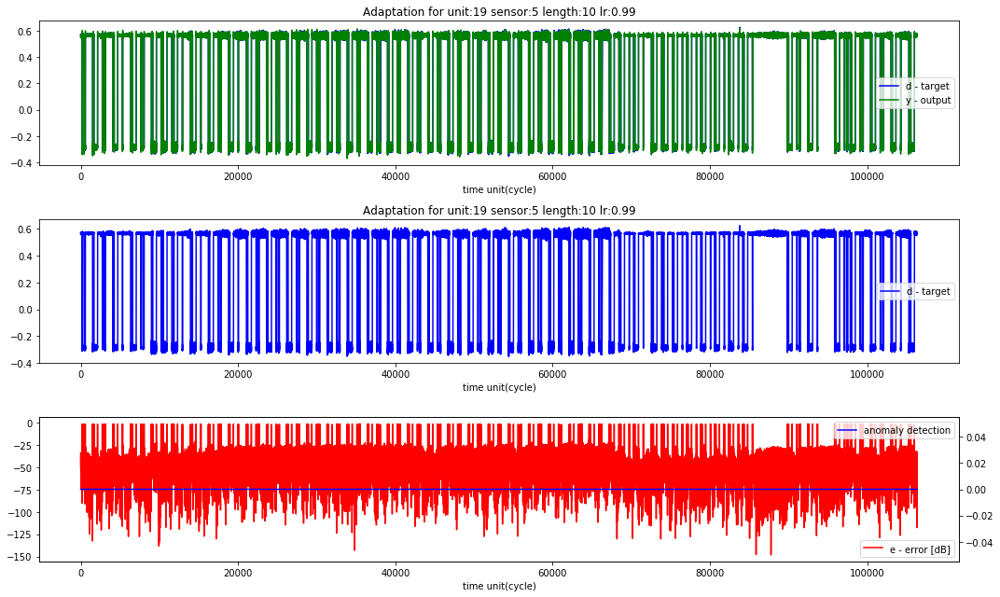

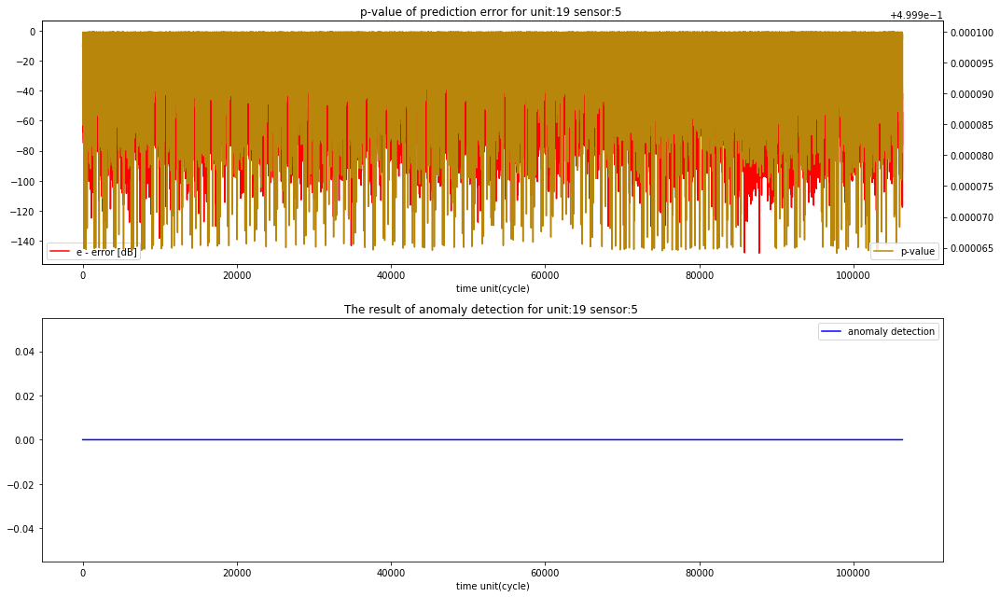

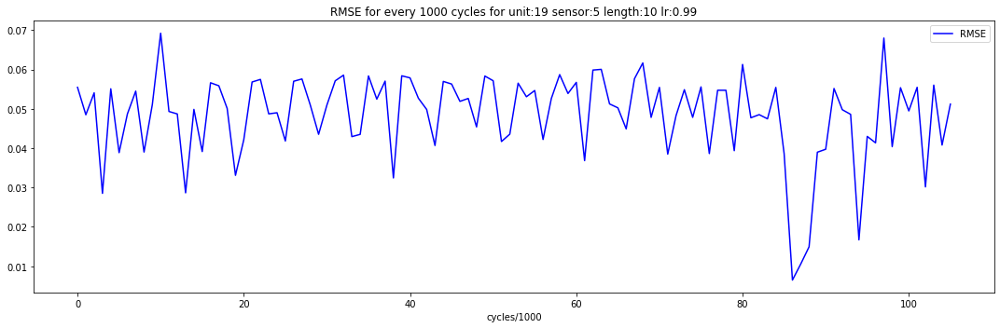

  1%|          | 3772/533358 [00:00<00:14, 37713.20it/s]

sensor loop 6: FLOWCOOLPRESSURE
RLS for adaptation(other cycles)


  1%|          | 912/106363 [00:00<00:11, 9112.32it/s]

Initialized value of sensor 6 -  mu:[0.03409508], signma:[0.03728206], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:11<00:00, 9484.14it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


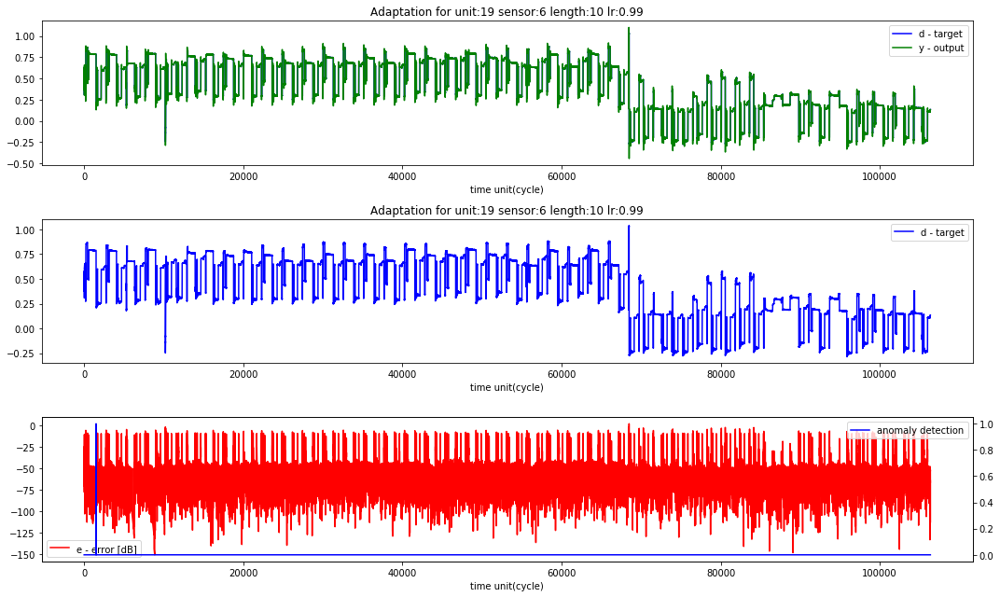

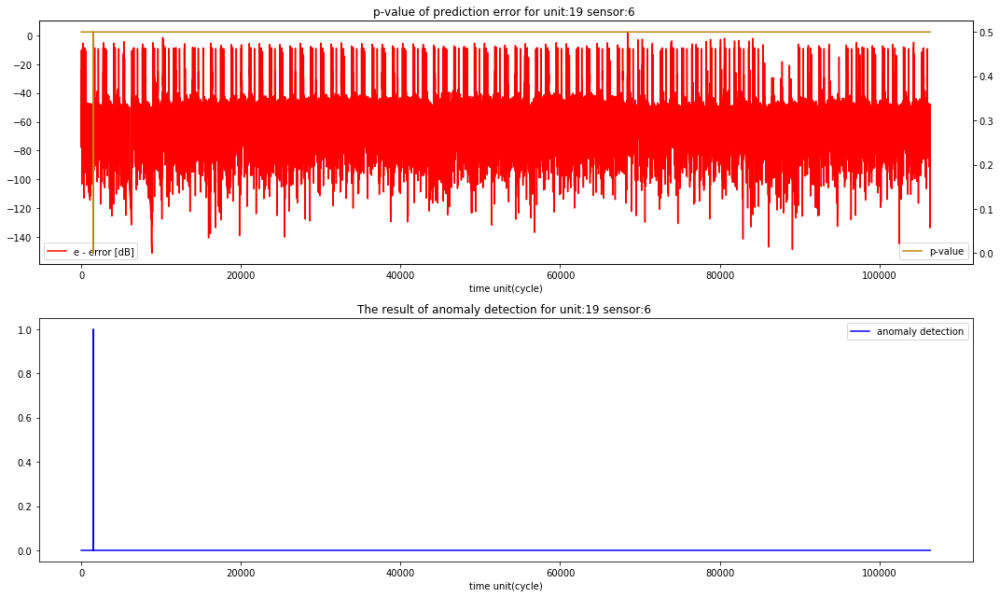

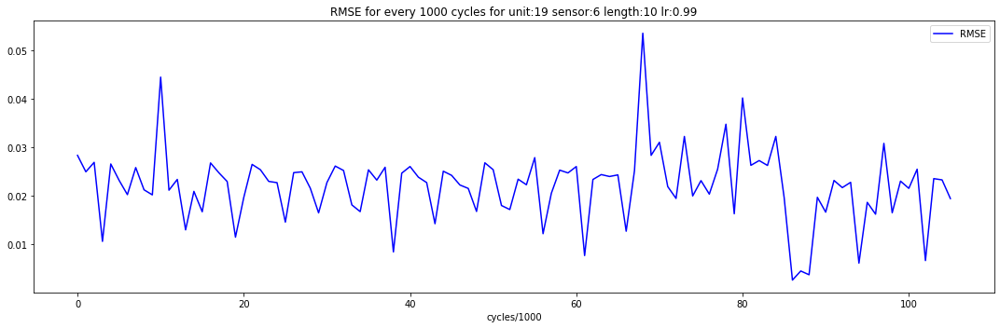

  1%|          | 3635/533358 [00:00<00:14, 36345.36it/s]

sensor loop 7: ETCHGASCHANNEL1READBACK
RLS for adaptation(other cycles)


  1%|          | 797/106363 [00:00<00:13, 7965.72it/s]

Initialized value of sensor 7 -  mu:[-0.2625736], signma:[0.27297795], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:12<00:00, 8711.17it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


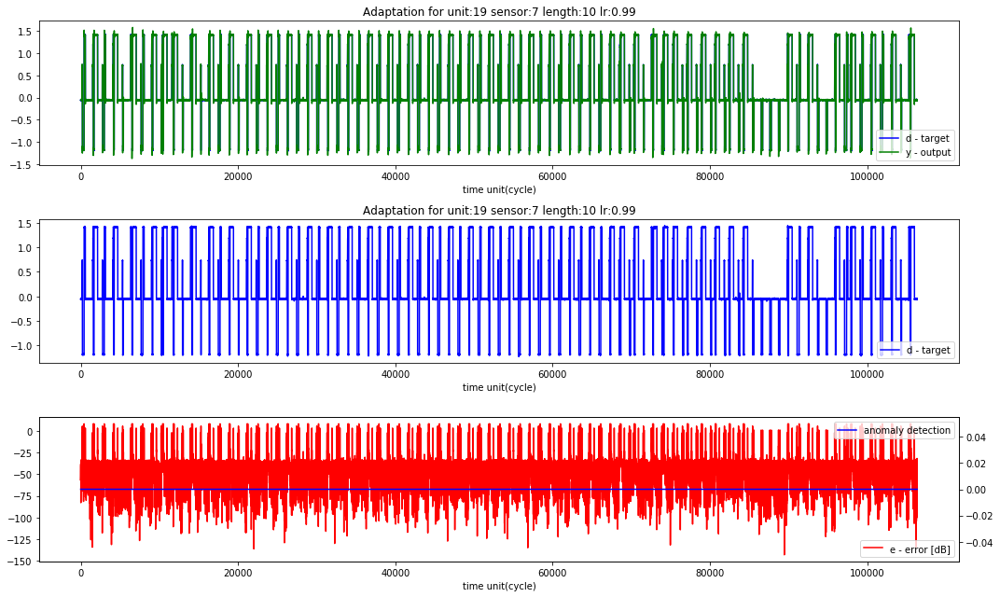

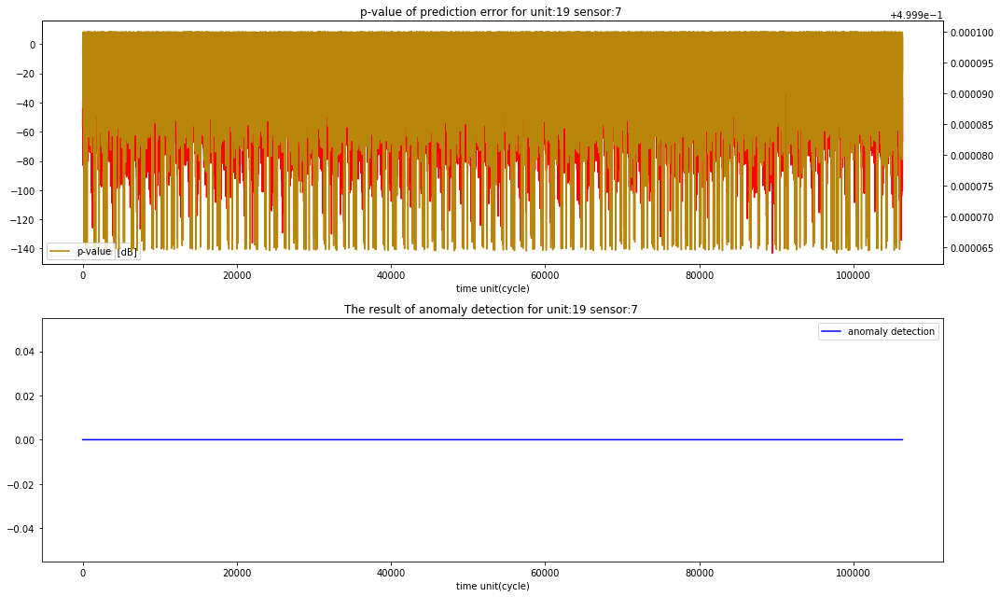

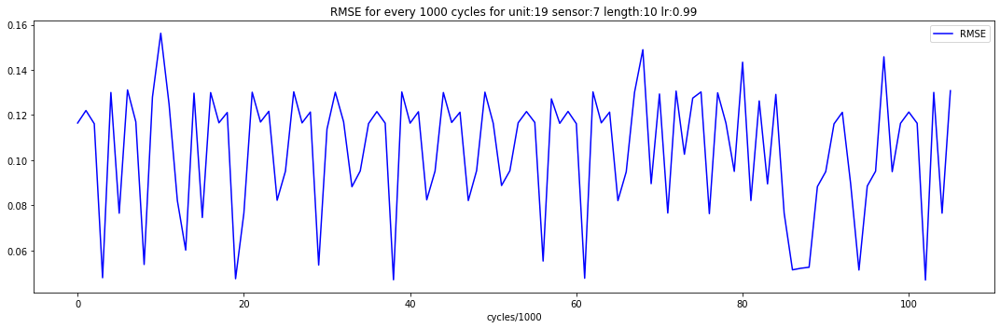

  1%|          | 3590/533358 [00:00<00:14, 35897.64it/s]

sensor loop 8: ETCHPBNGASREADBACK
RLS for adaptation(other cycles)


  1%|          | 914/106363 [00:00<00:11, 9133.87it/s]

Initialized value of sensor 8 -  mu:[9.3684535e-05], signma:[0.00220168], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:11<00:00, 9066.32it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


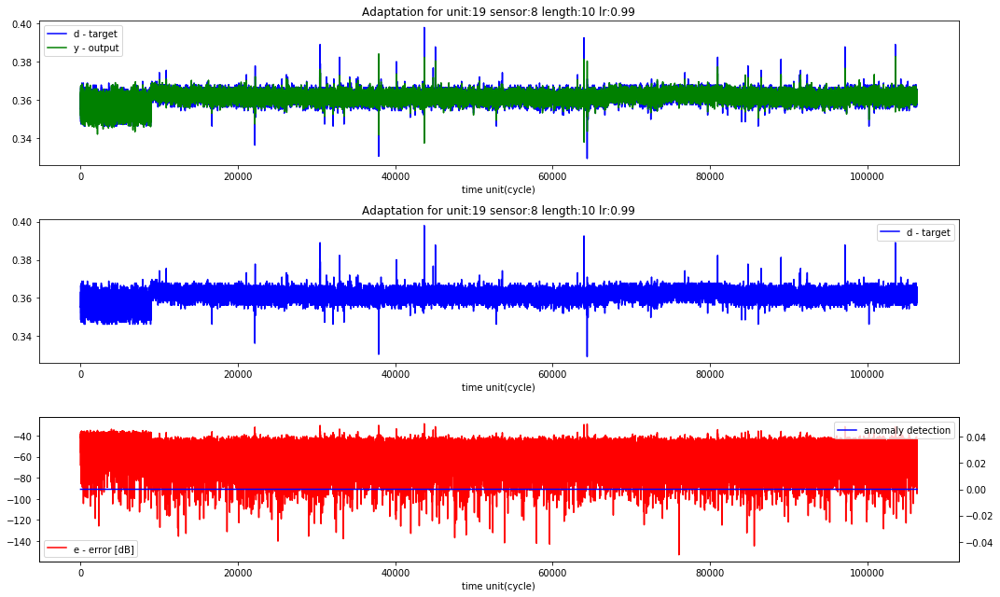

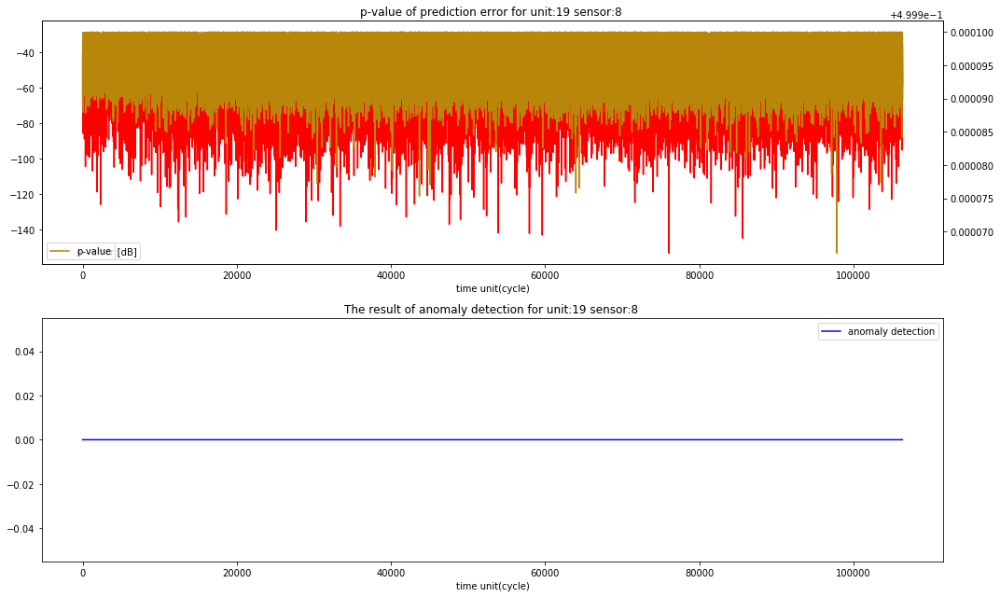

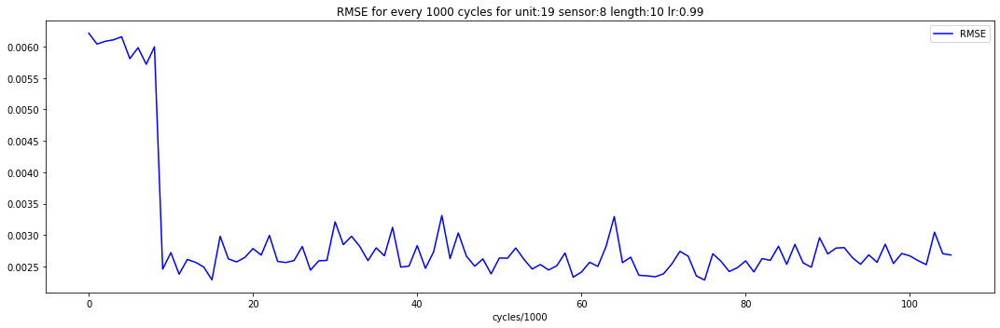

  1%|          | 3627/533358 [00:00<00:14, 36260.44it/s]

sensor loop 9: FIXTURETILTANGLE
RLS for adaptation(other cycles)


  1%|          | 900/106363 [00:00<00:11, 8991.99it/s]

Initialized value of sensor 9 -  mu:[-0.03206714], signma:[0.03374065], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:11<00:00, 9097.25it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


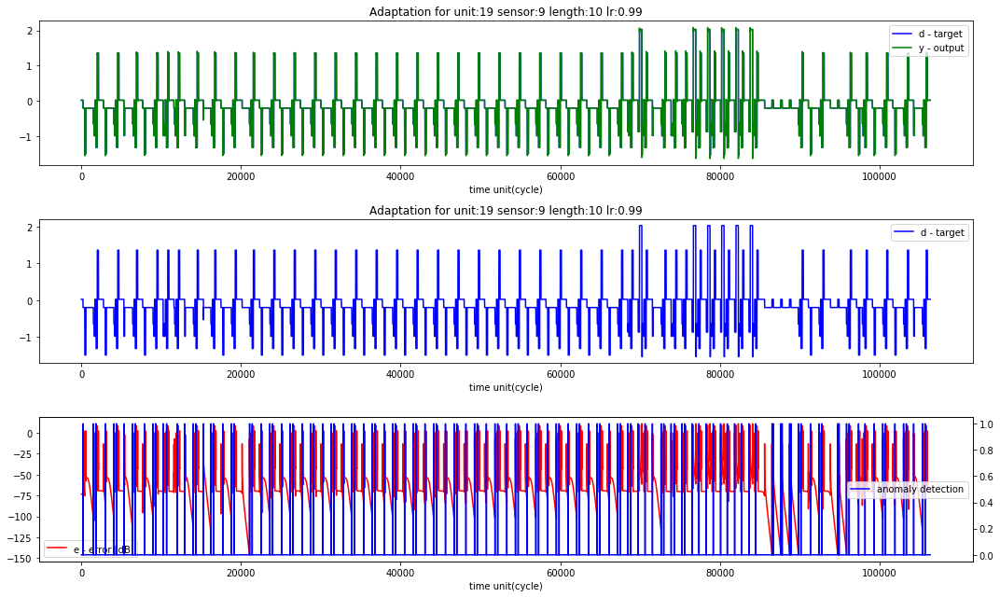

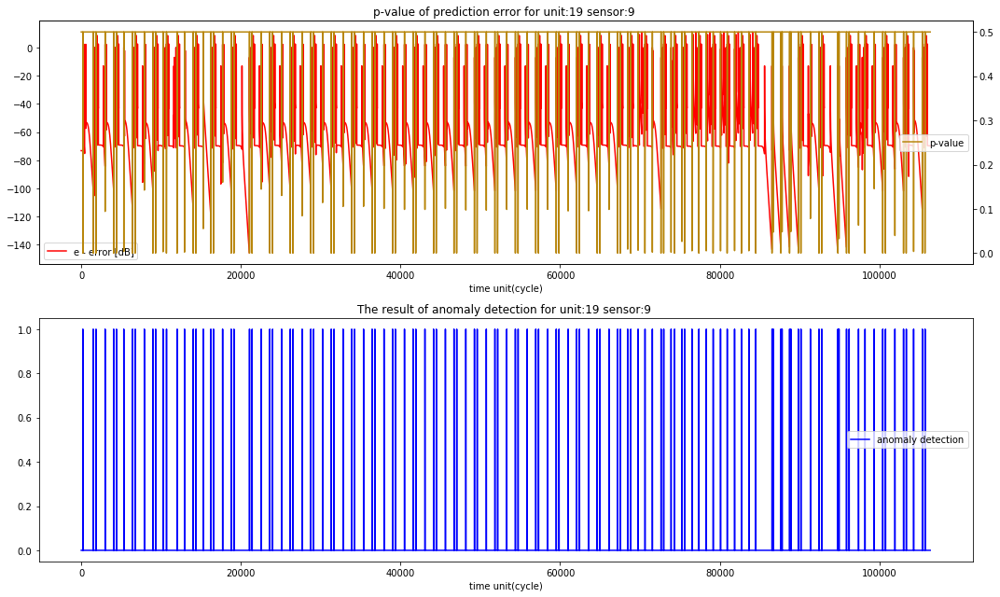

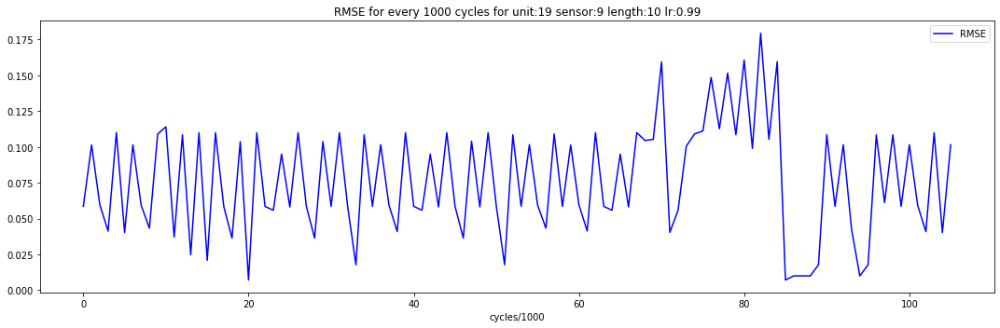

  1%|          | 3467/533358 [00:00<00:15, 34664.99it/s]

sensor loop 10: ACTUALSTEPDURATION
RLS for adaptation(other cycles)


  1%|          | 876/106363 [00:00<00:12, 8755.98it/s]

Initialized value of sensor 10 -  mu:[-0.03068068], signma:[0.00599553], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 106363/106363 [00:11<00:00, 9148.34it/s]
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:272: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
/home/hyunhomo/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


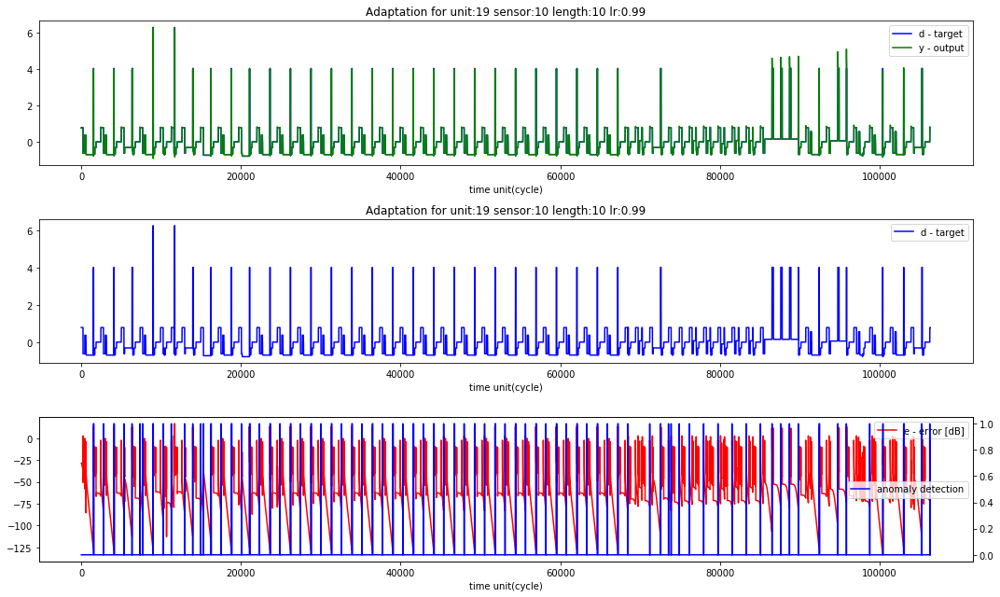

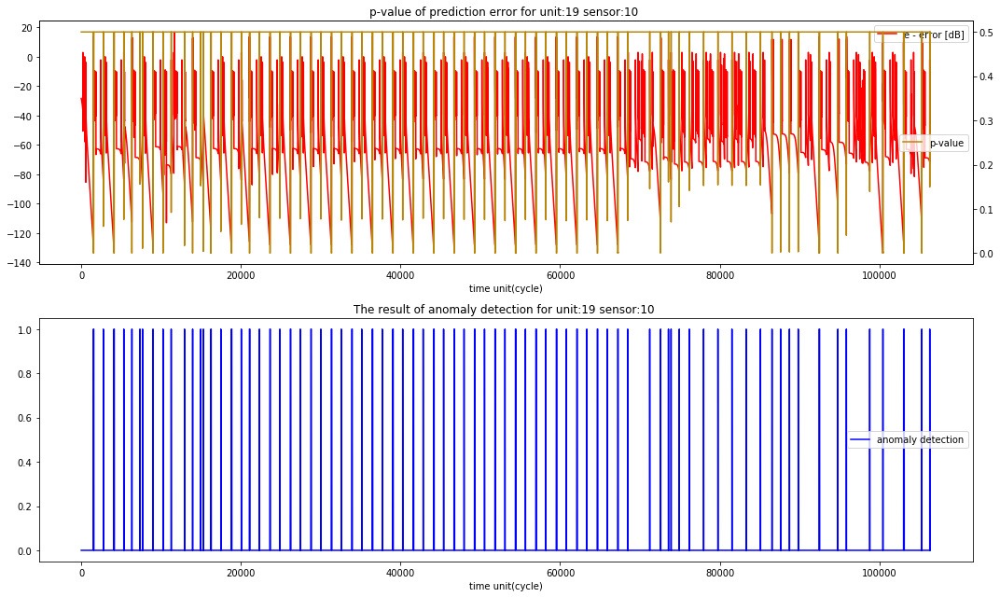

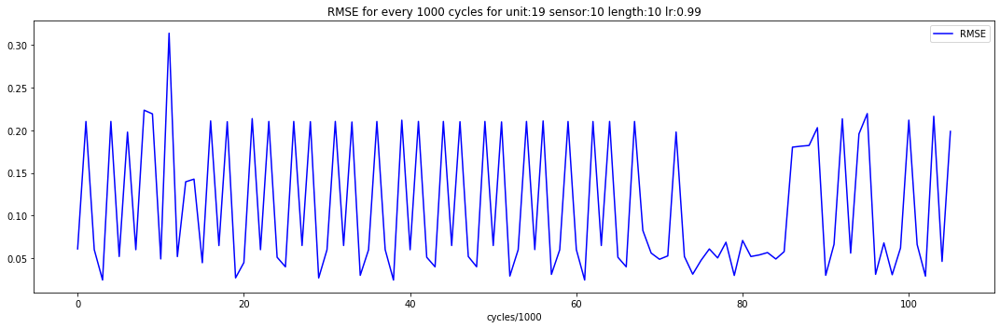

sequence_cols ['IONGAUGEPRESSURE', 'ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT', 'ETCHSUPPRESSORVOLTAGE', 'ETCHSUPPRESSORCURRENT', 'FLOWCOOLFLOWRATE', 'FLOWCOOLPRESSURE', 'ETCHGASCHANNEL1READBACK', 'ETCHPBNGASREADBACK', 'FIXTURETILTANGLE', 'ACTUALSTEPDURATION']
sequence generated, concatenating...
 data_matrix.shape (108317, 11)
 data_matrix.shape (61250, 11)
 data_matrix.shape (306920, 11)
 data_matrix.shape (106375, 11)
concatenated!


  0%|          | 0/582817 [00:00<?, ?it/s]

 data_matrix.shape (56916, 11)
sensor loop 0: IONGAUGEPRESSURE
RLS for adaptation(other cycles)


  2%|▏         | 912/56904 [00:00<00:06, 9112.32it/s]

Initialized value of sensor 0 -  mu:[1.50484468e-05], signma:[4.97145203e-07], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 9133.93it/s]


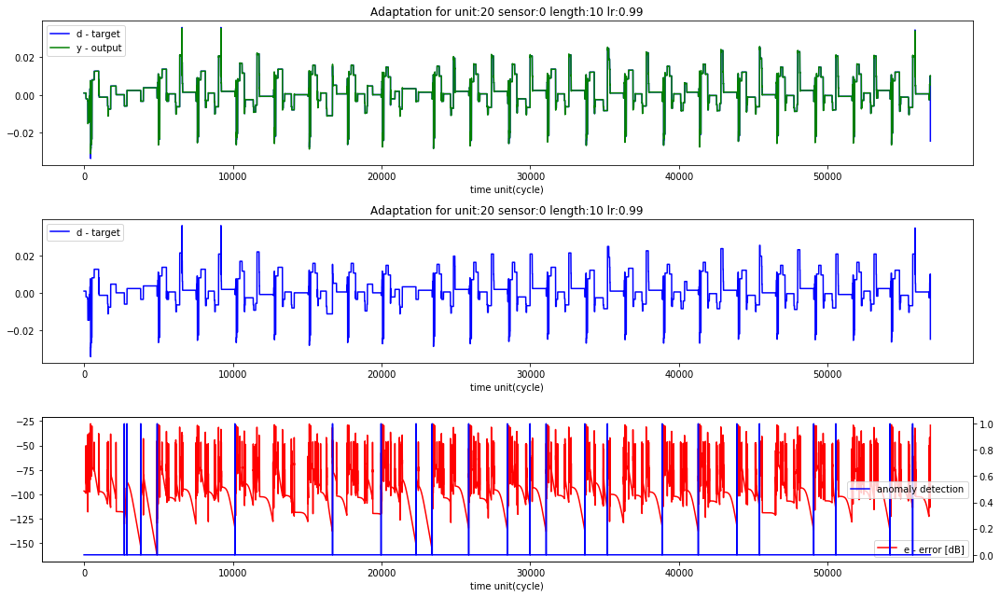

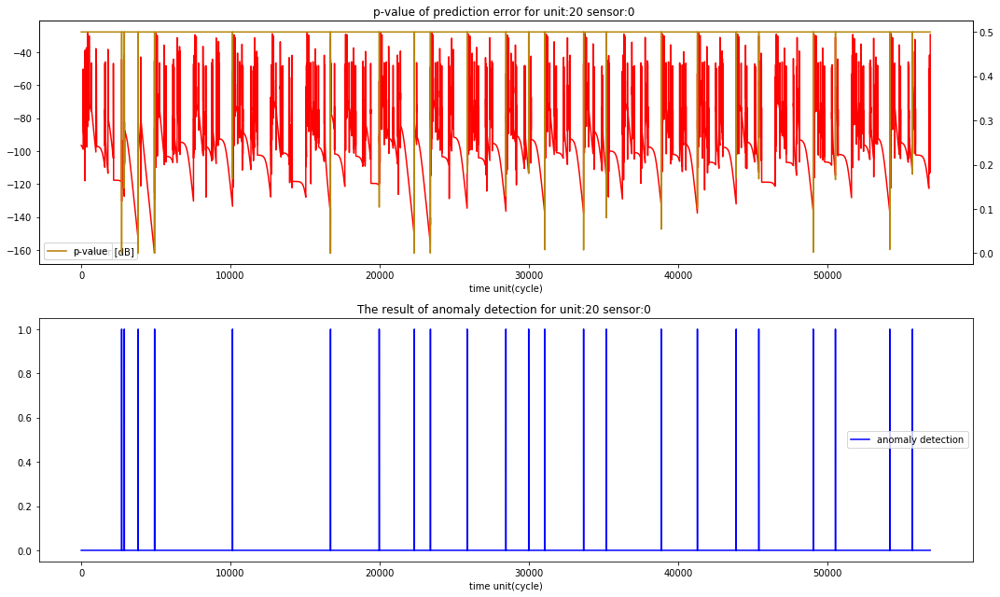

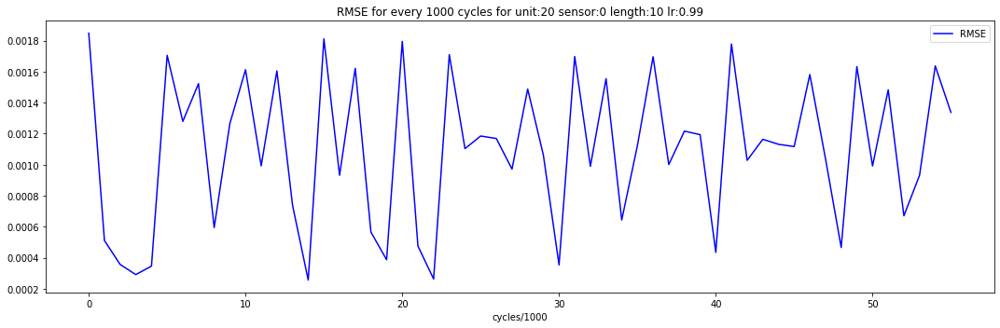

  1%|          | 3447/582817 [00:00<00:16, 34466.34it/s]

sensor loop 1: ETCHBEAMVOLTAGE
RLS for adaptation(other cycles)


  2%|▏         | 881/56904 [00:00<00:06, 8808.20it/s]

Initialized value of sensor 1 -  mu:[0.01621994], signma:[0.00436031], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 9155.41it/s]


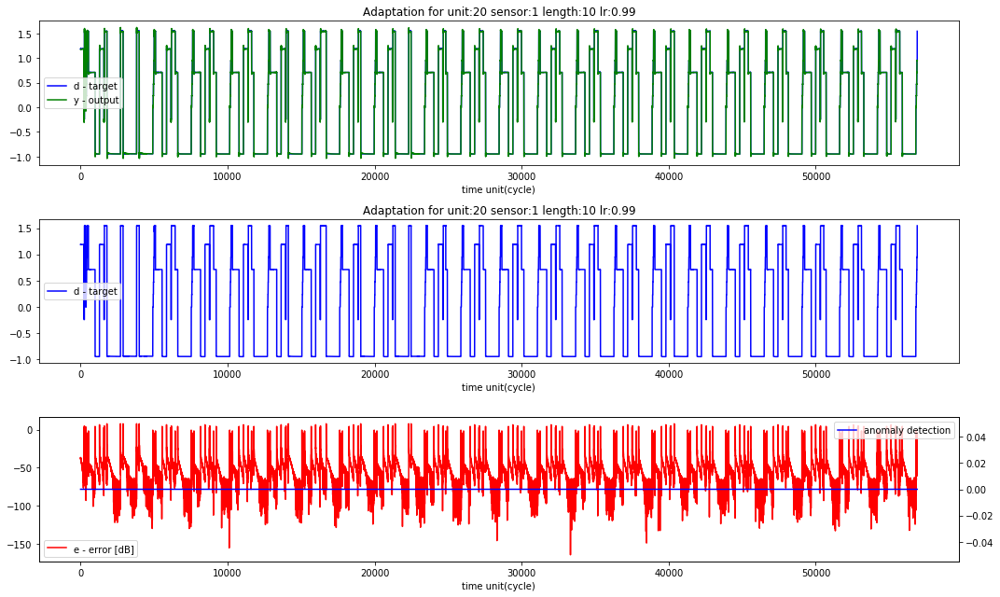

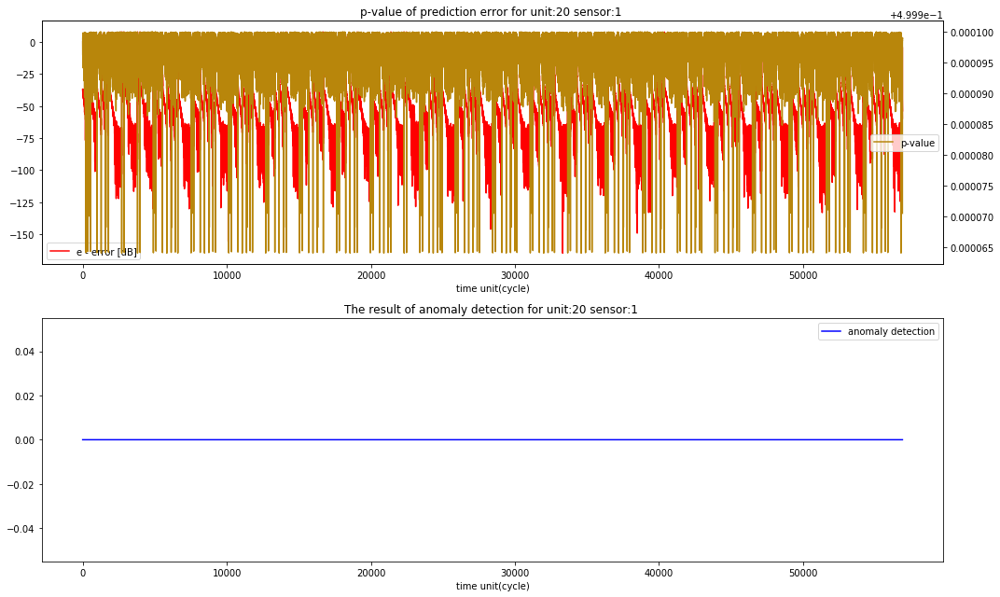

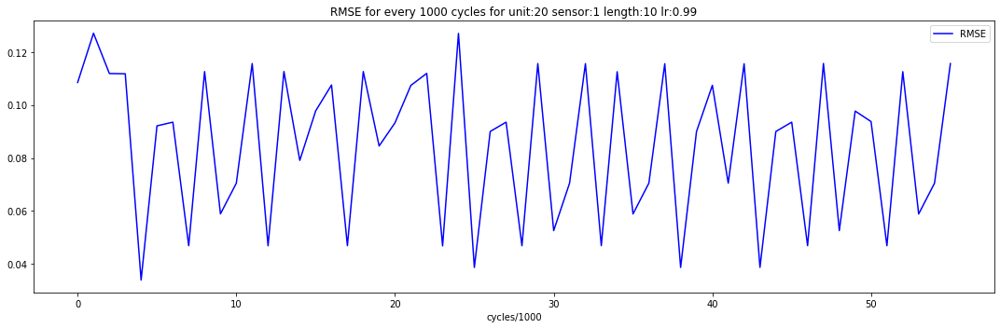

  1%|          | 3766/582817 [00:00<00:15, 37657.52it/s]

sensor loop 2: ETCHBEAMCURRENT
RLS for adaptation(other cycles)


  2%|▏         | 909/56904 [00:00<00:06, 9089.60it/s]

Initialized value of sensor 2 -  mu:[0.01232715], signma:[0.00434245], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 9191.65it/s]


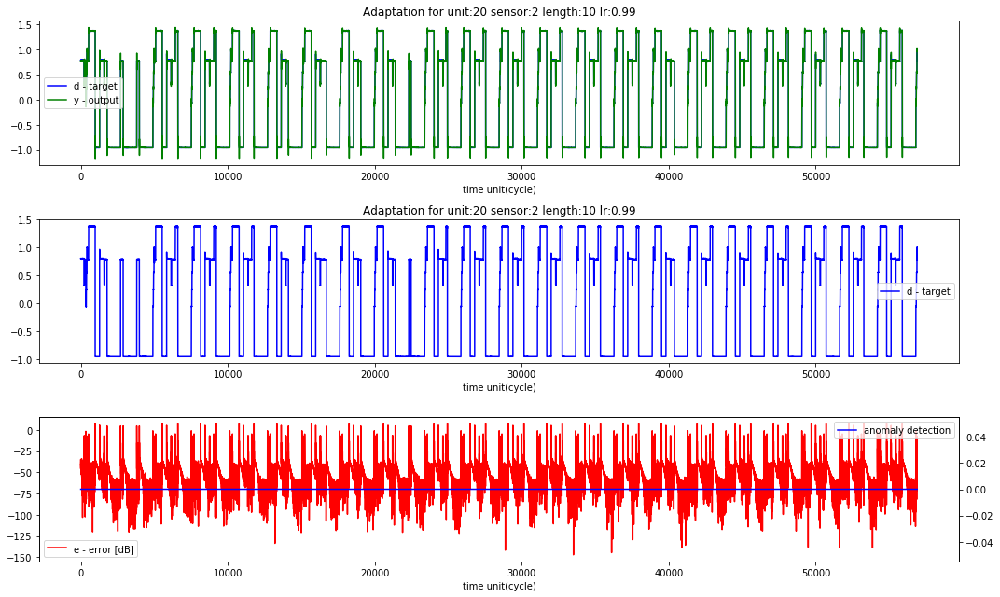

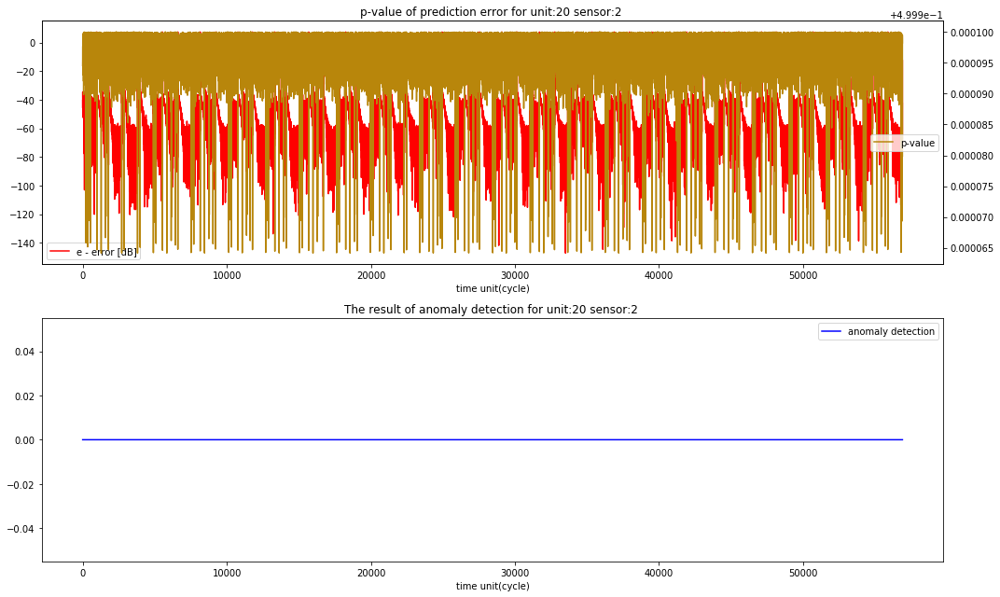

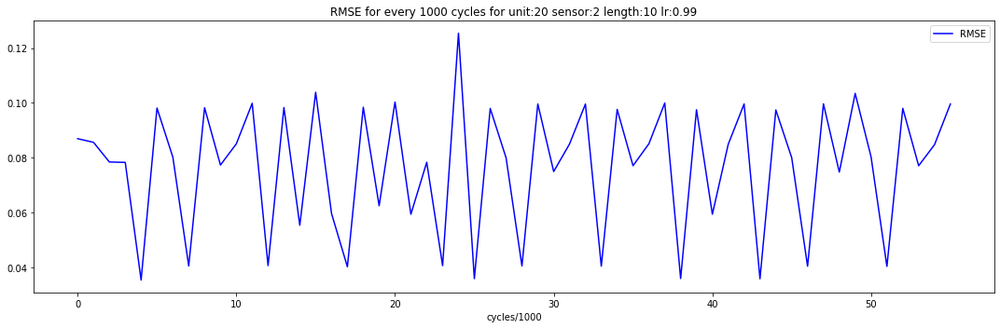

  1%|          | 3552/582817 [00:00<00:16, 35511.91it/s]

sensor loop 3: ETCHSUPPRESSORVOLTAGE
RLS for adaptation(other cycles)


  2%|▏         | 898/56904 [00:00<00:06, 8979.47it/s]

Initialized value of sensor 3 -  mu:[0.0145717], signma:[0.00395387], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 9075.40it/s]


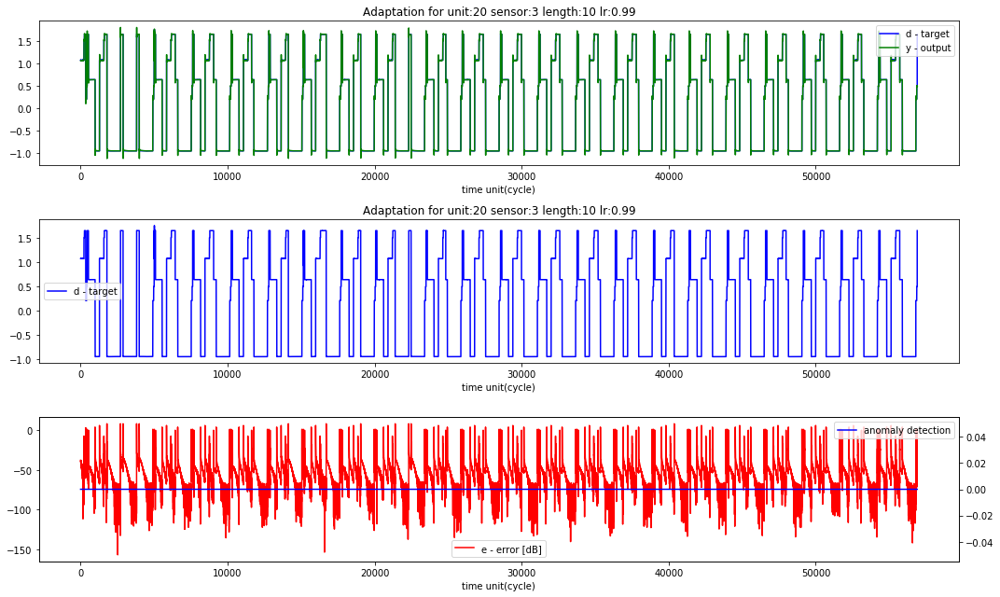

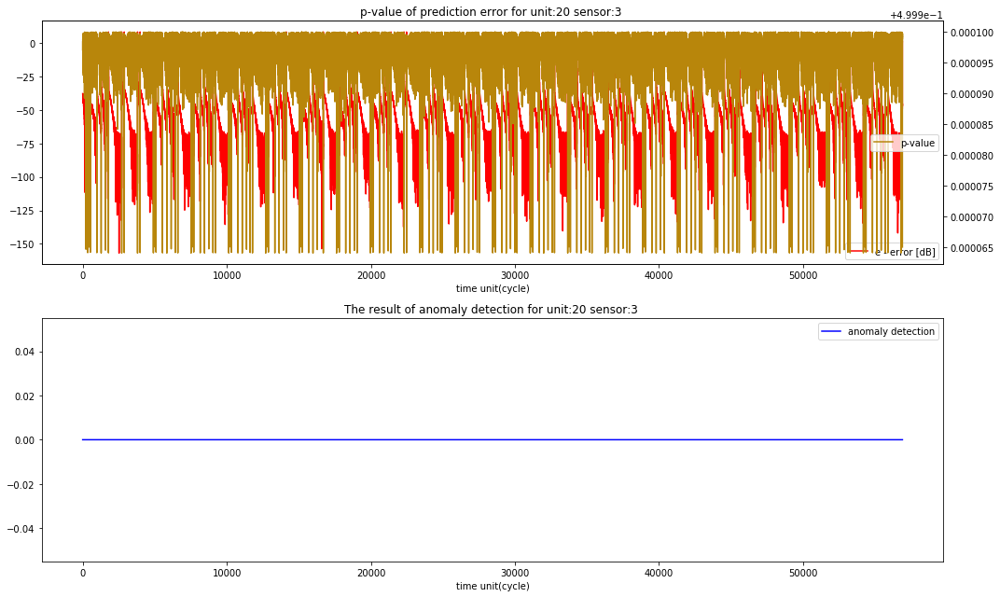

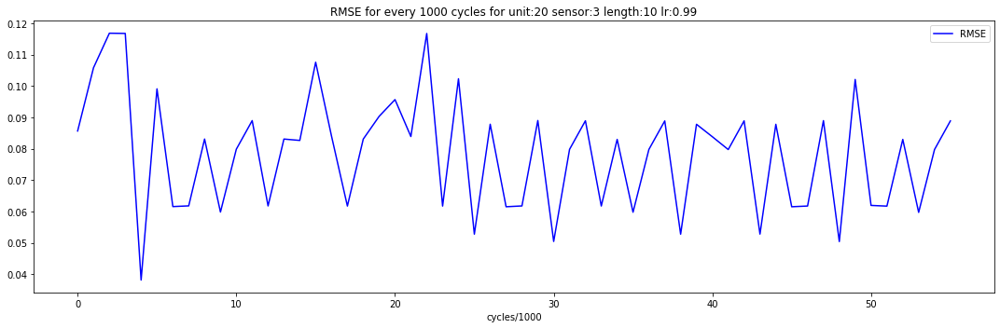

  1%|          | 3536/582817 [00:00<00:16, 35352.53it/s]

sensor loop 4: ETCHSUPPRESSORCURRENT
RLS for adaptation(other cycles)


  2%|▏         | 920/56904 [00:00<00:06, 9199.90it/s]

Initialized value of sensor 4 -  mu:[0.00940803], signma:[0.00521926], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 9051.58it/s]


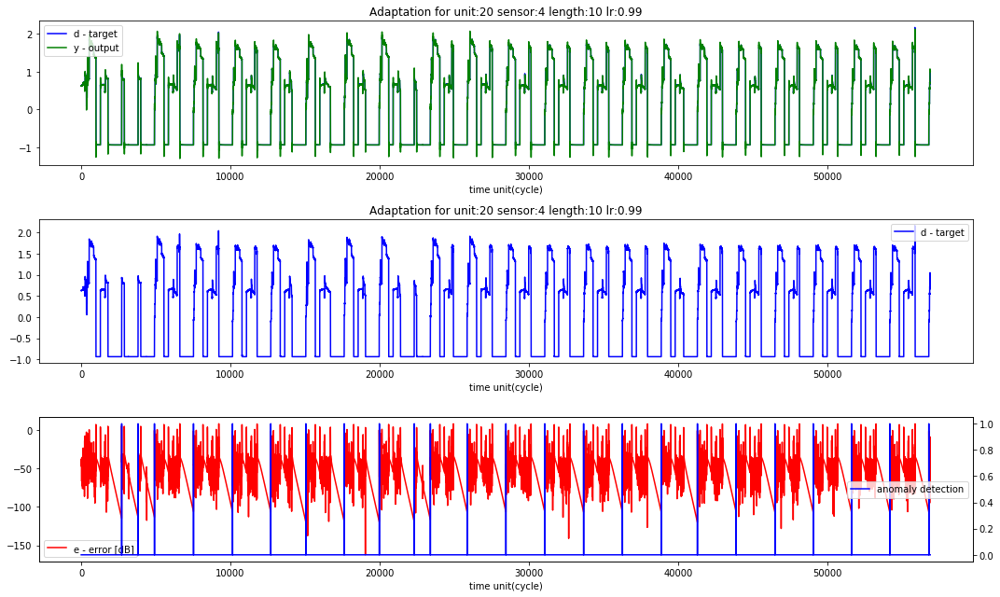

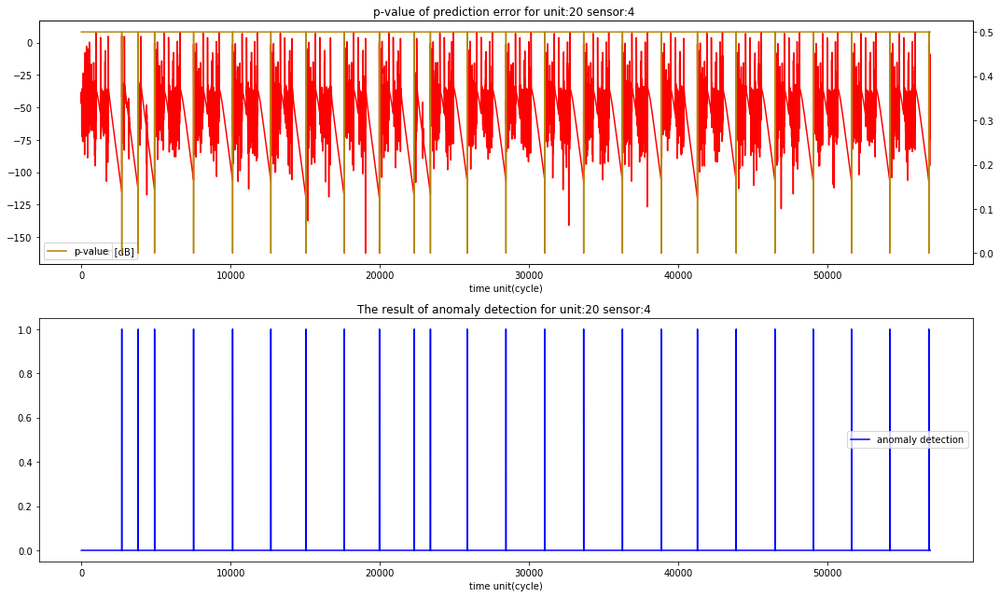

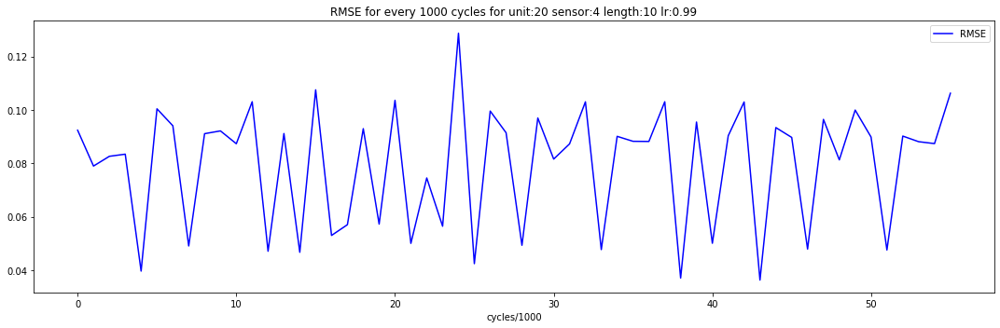

  1%|          | 3433/582817 [00:00<00:16, 34322.91it/s]

sensor loop 5: FLOWCOOLFLOWRATE
RLS for adaptation(other cycles)


  2%|▏         | 918/56904 [00:00<00:06, 9171.13it/s]

Initialized value of sensor 5 -  mu:[0.00069717], signma:[0.0018942], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 8910.08it/s]


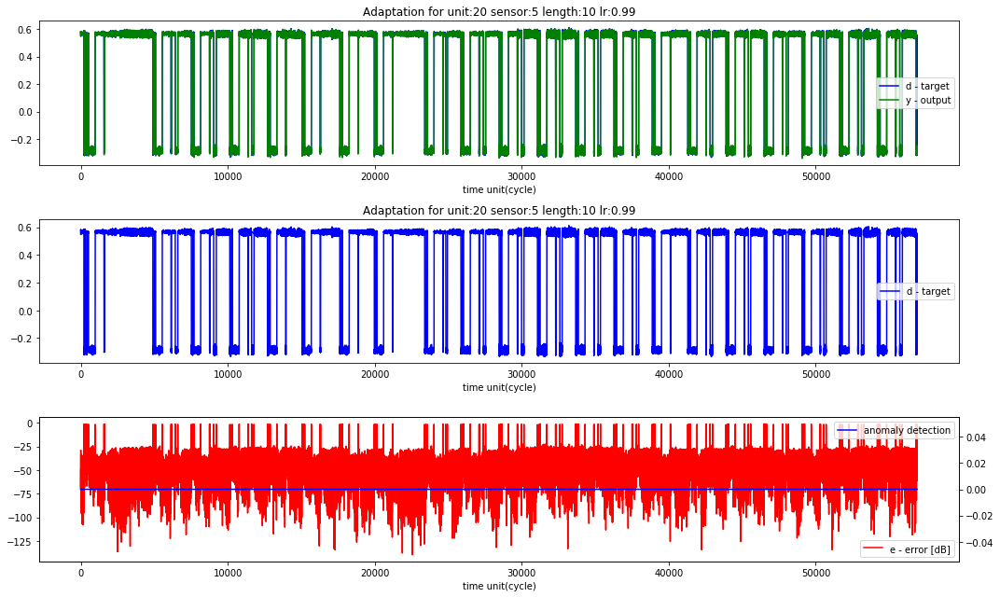

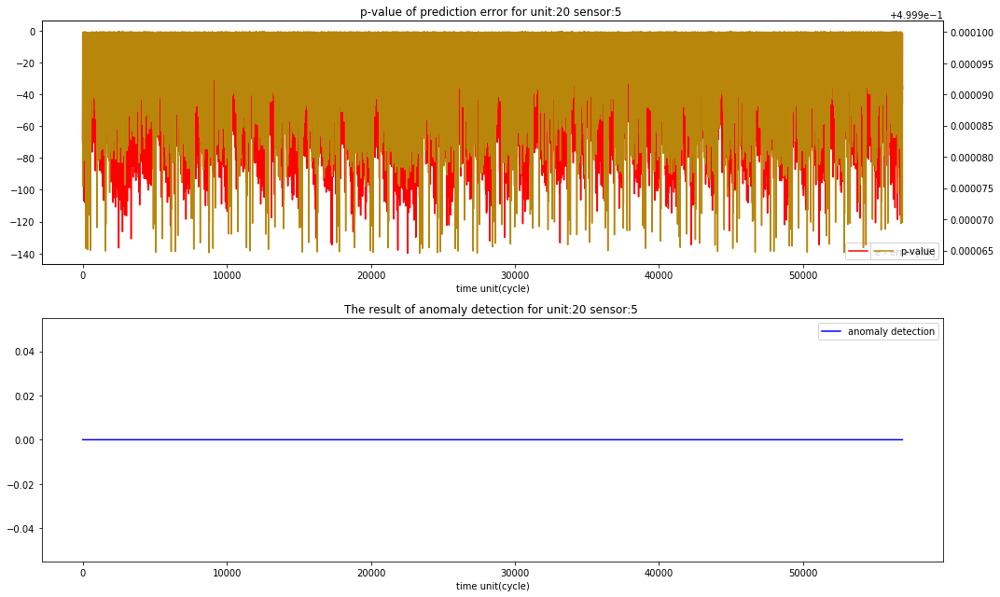

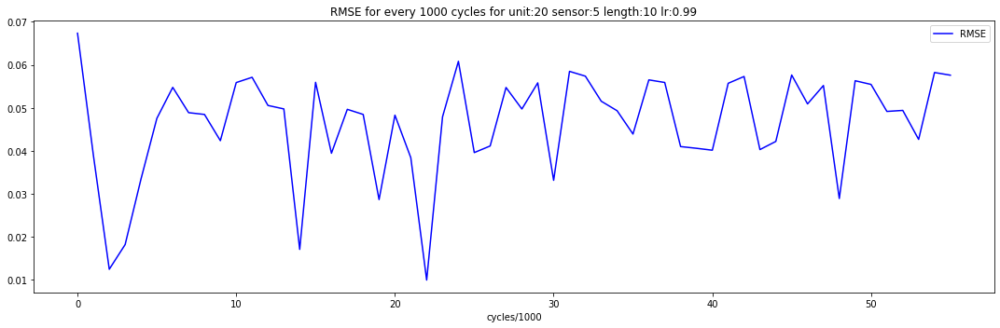

  1%|          | 3542/582817 [00:00<00:16, 35416.07it/s]

sensor loop 6: FLOWCOOLPRESSURE
RLS for adaptation(other cycles)


  2%|▏         | 856/56904 [00:00<00:06, 8552.42it/s]

Initialized value of sensor 6 -  mu:[0.00034872], signma:[0.00119945], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 8383.15it/s]


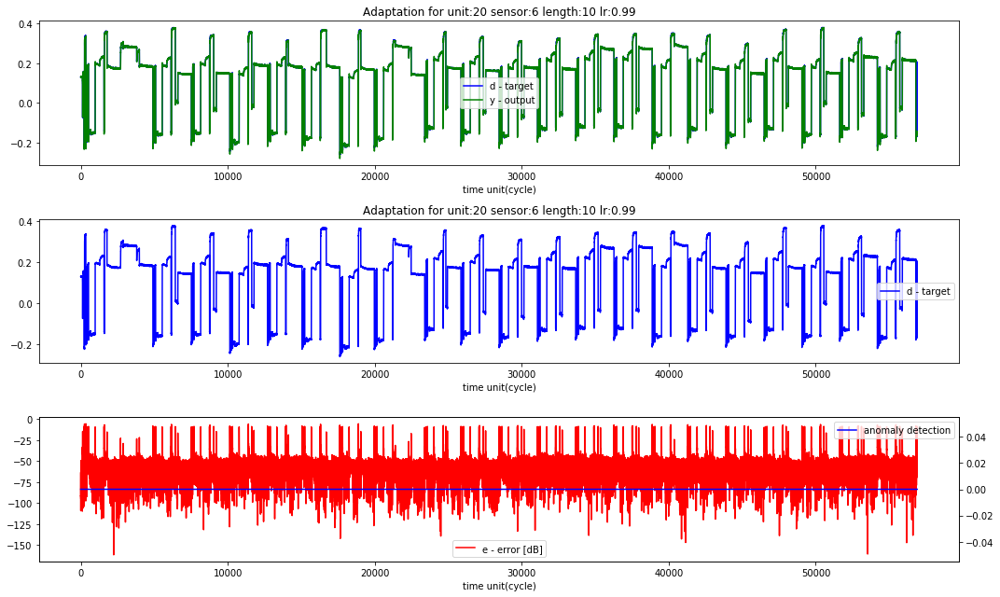

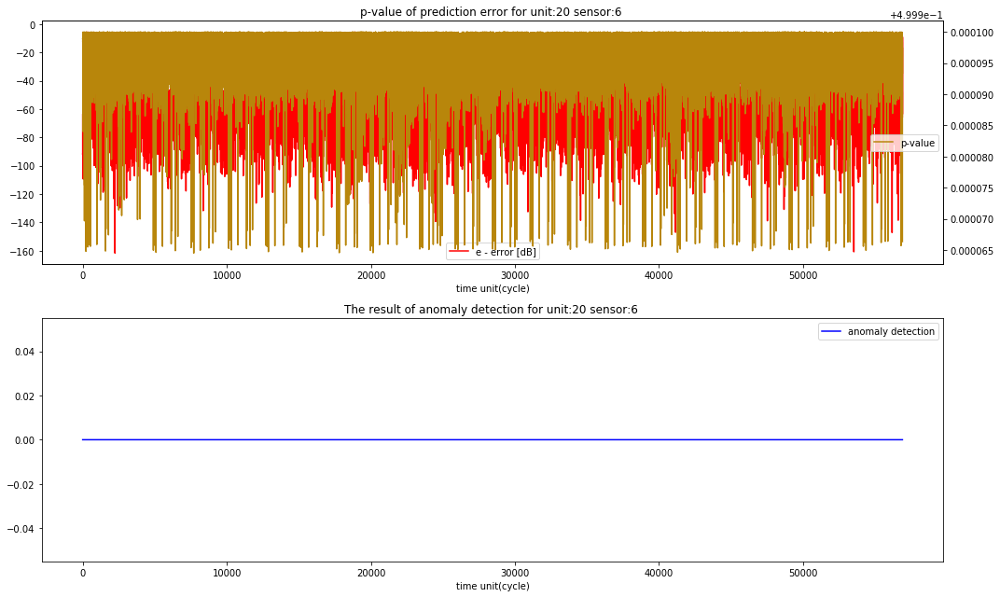

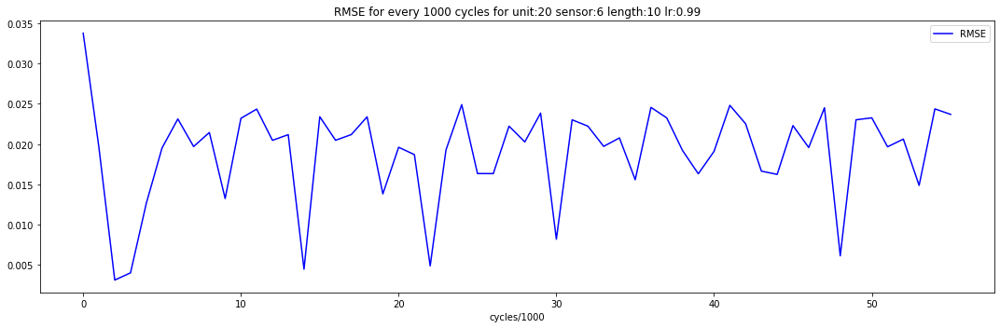

  1%|          | 3493/582817 [00:00<00:16, 34915.80it/s]

sensor loop 7: ETCHGASCHANNEL1READBACK
RLS for adaptation(other cycles)


  1%|▏         | 836/56904 [00:00<00:06, 8353.46it/s]

Initialized value of sensor 7 -  mu:[-0.00132703], signma:[0.00388618], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 8776.63it/s]


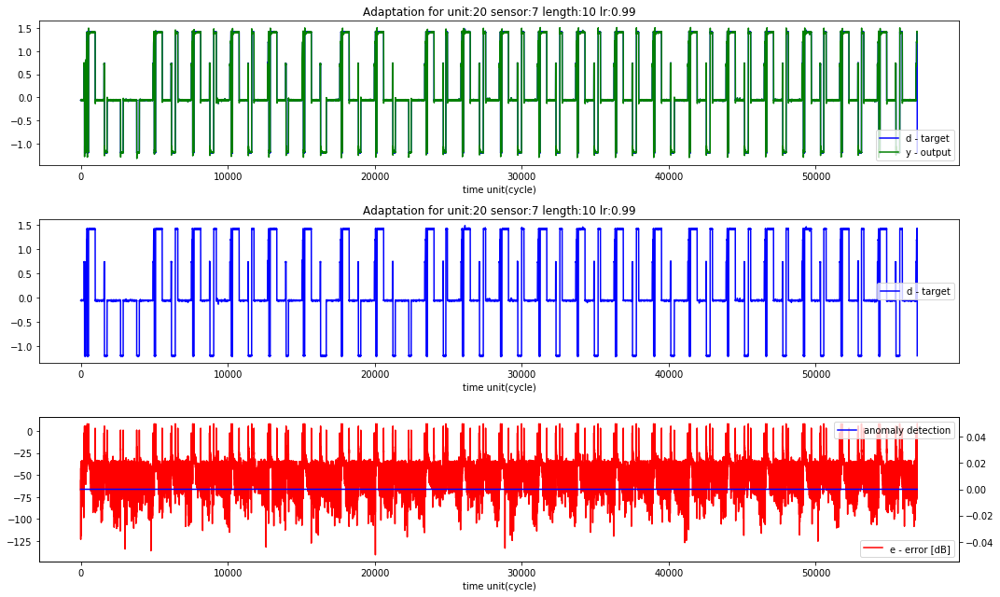

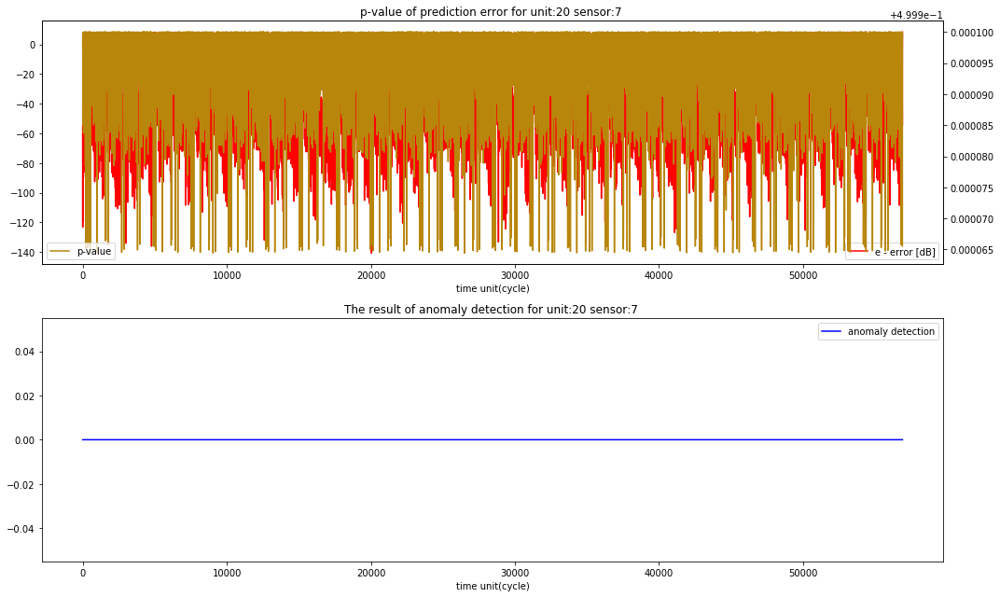

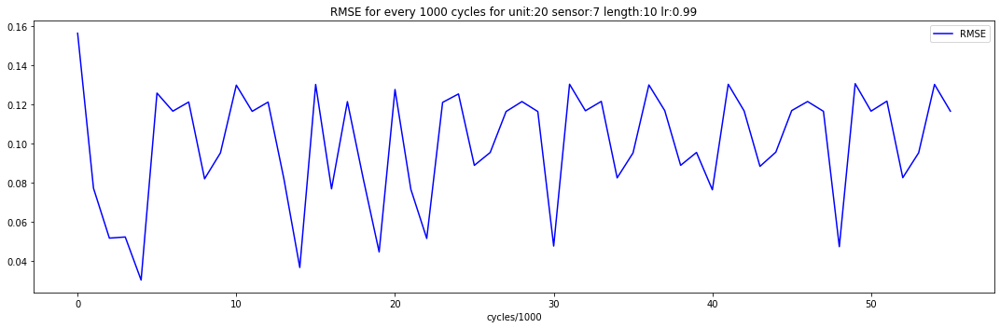

  1%|          | 3513/582817 [00:00<00:16, 35122.58it/s]

sensor loop 8: ETCHPBNGASREADBACK
RLS for adaptation(other cycles)


  2%|▏         | 917/56904 [00:00<00:06, 9168.30it/s]

Initialized value of sensor 8 -  mu:[0.00034697], signma:[0.00173954], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 9032.42it/s]


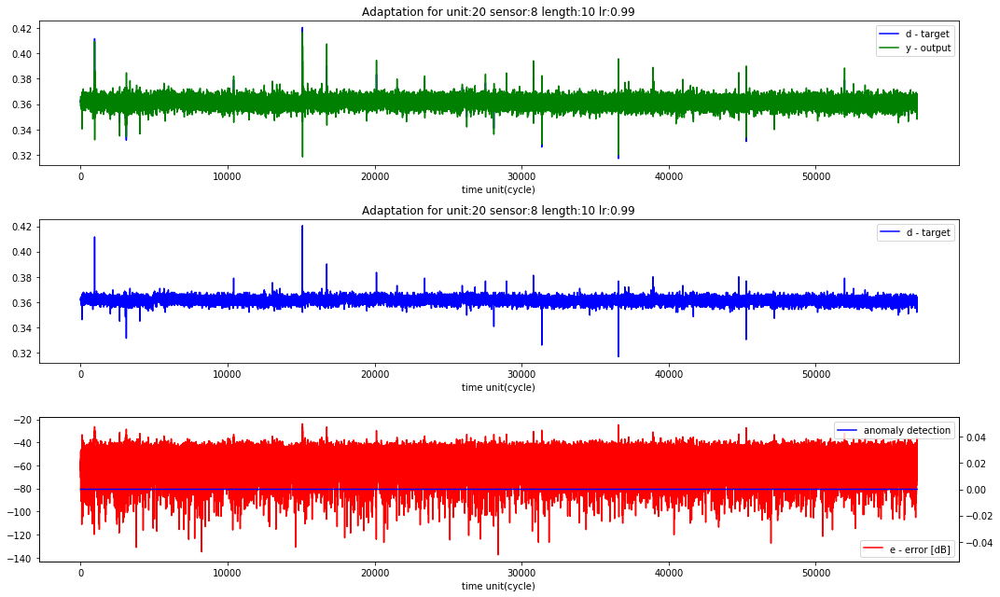

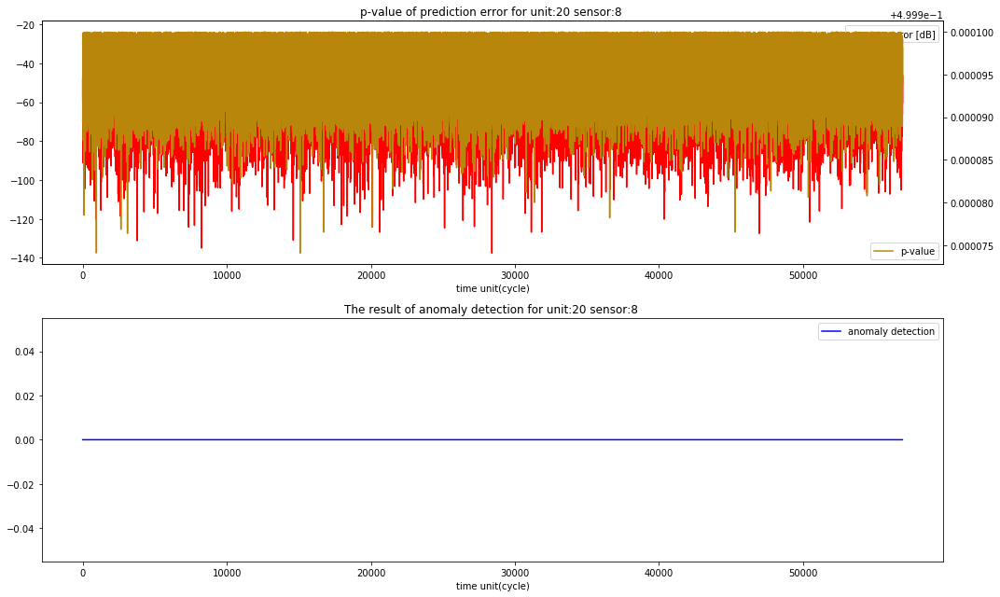

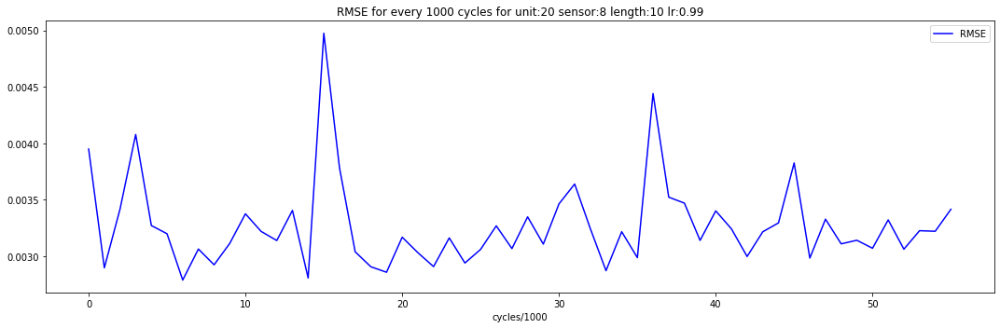

  1%|          | 3638/582817 [00:00<00:15, 36379.34it/s]

sensor loop 9: FIXTURETILTANGLE
RLS for adaptation(other cycles)


  2%|▏         | 895/56904 [00:00<00:06, 8946.92it/s]

Initialized value of sensor 9 -  mu:[0.00032528], signma:[2.71694725e-07], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 8968.69it/s]


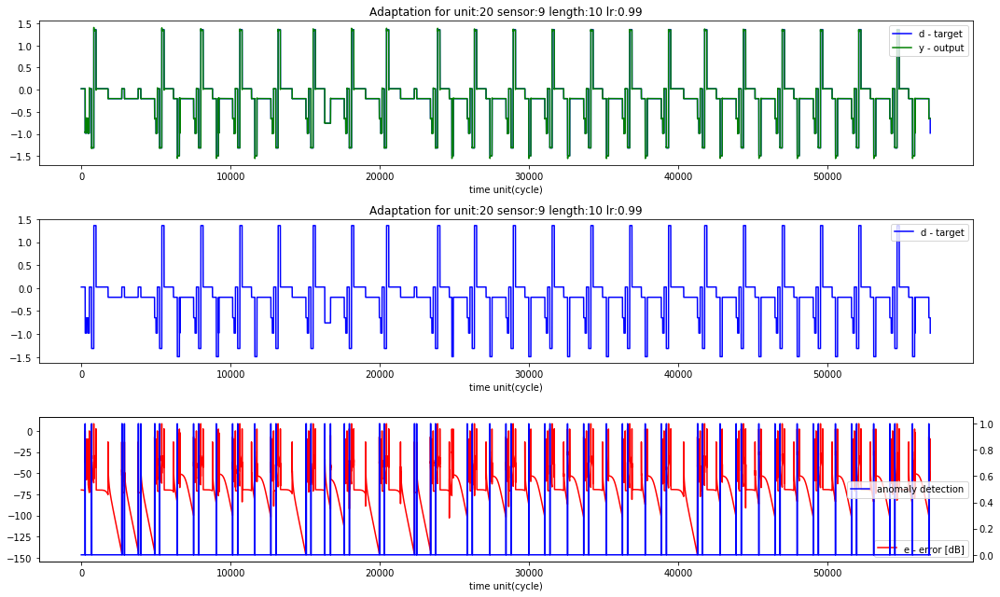

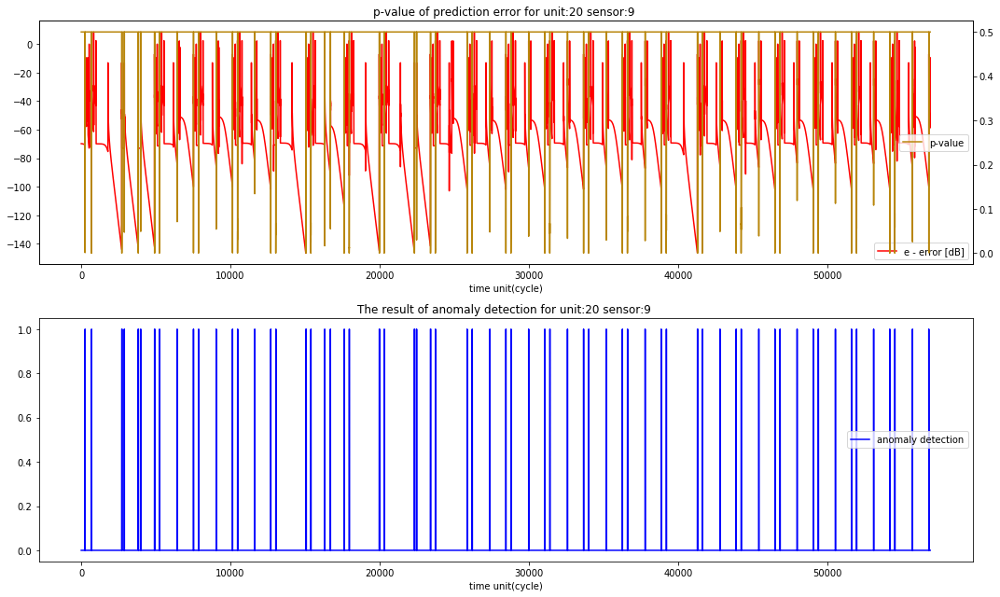

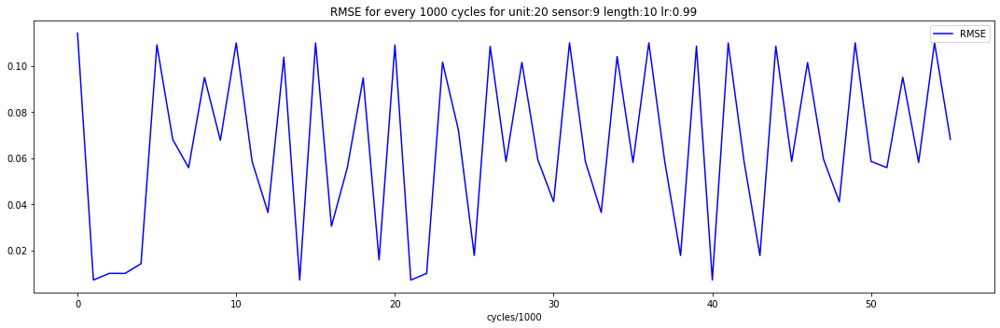

  1%|          | 3493/582817 [00:00<00:16, 34926.20it/s]

sensor loop 10: ACTUALSTEPDURATION
RLS for adaptation(other cycles)


  2%|▏         | 898/56904 [00:00<00:06, 8977.16it/s]

Initialized value of sensor 10 -  mu:[-0.00379885], signma:[0.00177034], thold_ad:100000, thold_p:100000
RLS for selected sensor


100%|██████████| 56904/56904 [00:06<00:00, 8881.92it/s]


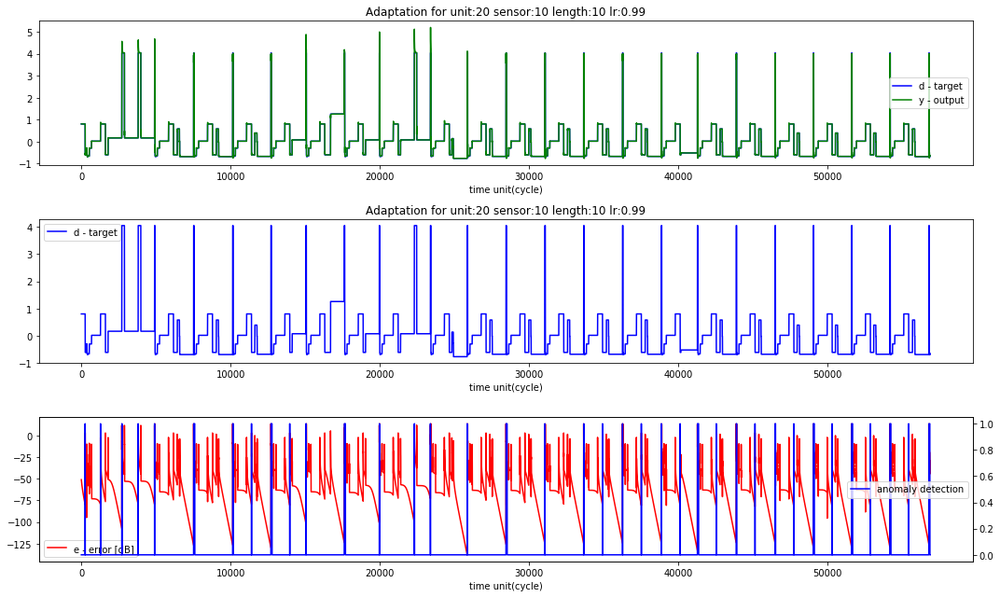

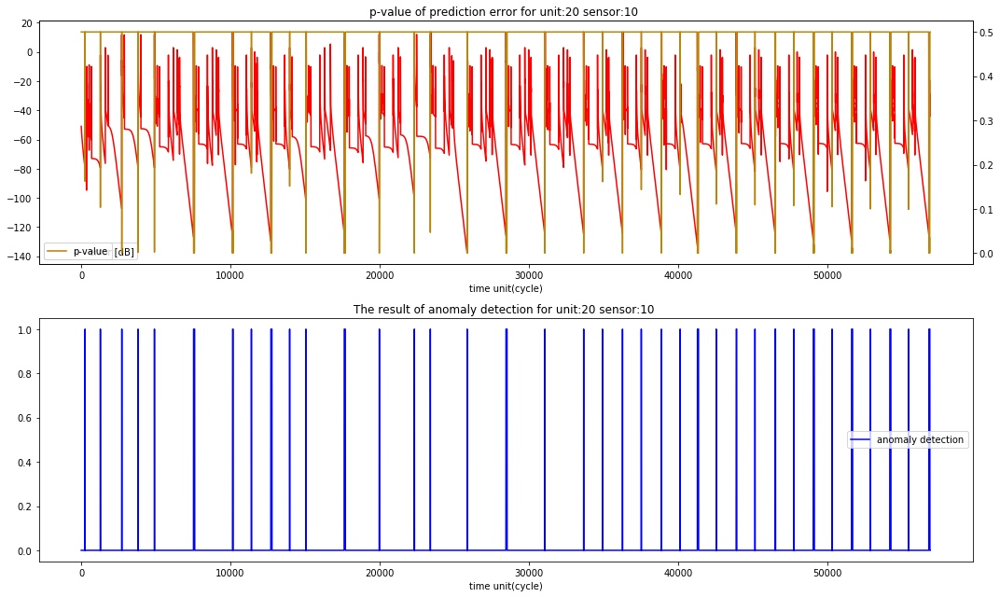

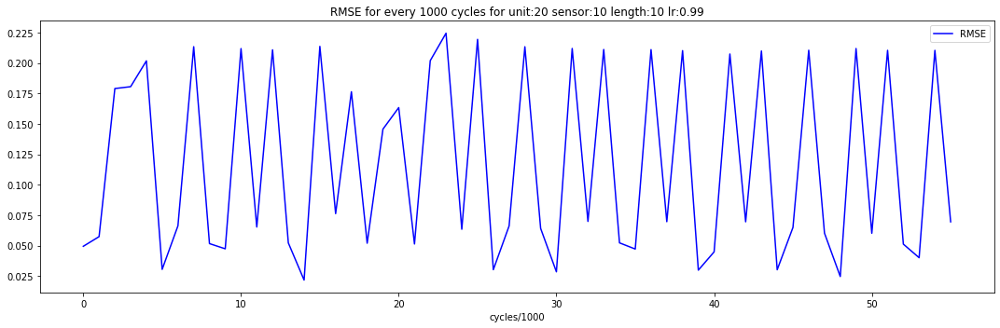

In [11]:


### Initialize the parameters for anomaly detection 
anomaly = False
mu = 10
sigma = 10
lmbd_mu = 0.1
lmbd_sigma = 0.1
thold_ad = 100000
thold_p = 100000

'''
Index(['time', 'Tool', 'stage', 'Lot', 'runnum', 'recipe', 'recipe_step',
       'IONGAUGEPRESSURE', 'ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT',
       'ETCHSUPPRESSORVOLTAGE', 'ETCHSUPPRESSORCURRENT', 'FLOWCOOLFLOWRATE',
       'FLOWCOOLPRESSURE', 'ETCHGASCHANNEL1READBACK', 'ETCHPBNGASREADBACK',
       'FIXTURETILTANGLE', 'ROTATIONSPEED', 'ACTUALROTATIONANGLE',
       'FIXTURESHUTTERPOSITION', 'ETCHSOURCEUSAGE', 'ETCHAUXSOURCETIMER',
       'ETCHAUX2SOURCETIMER', 'ACTUALSTEPDURATION',
       'TTF_FlowCool Pressure Dropped Below Limit',
       'TTF_Flowcool Pressure Too High Check Flowcool Pump',
       'TTF_Flowcool leak', 'failure_cycle'],
      dtype='object')


'''
sensor_idx = ['IONGAUGEPRESSURE','ETCHBEAMVOLTAGE', 'ETCHBEAMCURRENT', 'ETCHSUPPRESSORVOLTAGE',
              'ETCHSUPPRESSORCURRENT', 'FLOWCOOLFLOWRATE','FLOWCOOLPRESSURE',
              'ETCHGASCHANNEL1READBACK', 'ETCHPBNGASREADBACK',
              'FIXTURETILTANGLE','ACTUALSTEPDURATION']



for cycle in cycle_list:
    
    p_err_s_list = []
    
    # pick the feature columns
    sensor_dataframe = df_train_ttf_merged.drop(columns=['time','Tool', 'stage' , 'runnum', 'Lot','recipe','recipe_step',
                                                         'ROTATIONSPEED', 'ACTUALROTATIONANGLE',
                                                          'ETCHSOURCEUSAGE', 'ETCHAUXSOURCETIMER','ETCHAUX2SOURCETIMER',
                                                         'FIXTURESHUTTERPOSITION','TTF_FlowCool Pressure Dropped Below Limit',
                                                         'TTF_Flowcool Pressure Too High Check Flowcool Pump','TTF_Flowcool leak',
                                                        'failure_cycle'])
    sequence_cols = sensor_dataframe.columns.values.tolist()
    print ("sequence_cols",sequence_cols)

    # generator for the sequences
    # transform each id of the train dataset in a sequence
    seq_gen = (list(gen_sequence(df_train_ttf_merged[df_train_ttf_merged['failure_cycle'] == id], sequence_length, sequence_cols))
               for id in np.delete(cycle_list,np.where(cycle_list == cycle)))

    # generate sequences and convert to numpy array
    print ("sequence generated, concatenating...")
    seq_array  = np.concatenate(list(seq_gen))
    # seq_array = np.concatenate(list(seq_gen)).astype(np.float32)
#     print(seq_array)

    print ("concatenated!")

    # generator for the sequences
    # transform each id of the train dataset in a sequence
    target_seq_gen = (list(gen_target(df_train_ttf_merged[df_train_ttf_merged['failure_cycle'] == id], sequence_length, pred_length, sequence_cols))
               for id in np.delete(cycle_list,np.where(cycle_list == cycle)))

    # print ("target_seq_gen", target_seq_gen)
    # generate sequences and convert to numpy array
    target_seq_array  = np.concatenate(list(target_seq_gen))
    # target_seq_array = np.concatenate(list(target_seq_gen)).astype(np.float32)
#     print(target_seq_array)
#     print(target_seq_array.shape)



    # generate RUL labels
    label_gen = [gen_labels(df_train_ttf_merged[df_train_ttf_merged['failure_cycle'] == id], 
                            sequence_length, ['TTF_FlowCool Pressure Dropped Below Limit'])
                 for id in np.delete(cycle_list,np.where(cycle_list == cycle))]

    label_array = np.concatenate(label_gen).astype(np.float32)

    
    ## sequence of time series data and target measurement values for selected machine (unit_id_idx)
    seq_gen_m_id = (list(gen_sequence(df_train_ttf_merged[df_train_ttf_merged['failure_cycle'] == cycle], sequence_length, sequence_cols))
               )

    # generate sequences and convert to numpy array
    seq_array_m_id  = np.array(list(seq_gen_m_id))
    # seq_array = np.concatenate(list(seq_gen)).astype(np.float32)
    # print(seq_array_m_id)
#     print(seq_array_m_id.shape)



    # generator for the sequences
    # transform each id of the train dataset in a sequence
    target_seq_gen_m_id = (list(gen_target(df_train_ttf_merged[df_train_ttf_merged['failure_cycle'] == cycle], sequence_length, pred_length, sequence_cols))
               )

    # print ("target_seq_gen", target_seq_gen)
    # generate sequences and convert to numpy array
    target_seq_array_m_id  = np.array(list(target_seq_gen_m_id))
    # target_seq_array = np.concatenate(list(target_seq_gen)).astype(np.float32)
    # print(target_seq_array_m_id)
#     print(target_seq_array_m_id.shape)
    
    
    

    for s_i in range(len(sensor_idx)):
        print ("sensor loop %s: %s" %(s_i,sensor_idx[s_i] ))
        
        # Initialize the parameters of anomaly detection for each time series (sensor data)
        anomaly = False
        mu = 10
        sigma = 10
        lmbd_mu = 0.1
        lmbd_sigma = 0.1
        thold_ad = 100000
        thold_p = 100000


        ### Prediction error estimation with RLS

        ## Check data shape (last instance of each unit is excluded)
    #     print ("other sensors input data shape: " , seq_array[:,:,0].shape)
    #     print ("other sensors target measurement shape: ", target_seq_array[:,:,0].shape)
    #     print ("RUL array shape: ", label_array.shape)

        ## Apadt model first
        ## An example how to filter data measured in real-time
        # these two function supplement your online measurment

        s2_input_array = seq_array[:,:,s_i]
        s2_target_array = target_seq_array[:,:,s_i]

        N = s2_input_array.shape[0]
        log_d = np.zeros(N)
        log_y = np.zeros(N)
        filt = pa.filters.FilterRLS(sequence_length, mu=lr)
        
        init_p_err_list = []
        
        print ("RLS for adaptation(other cycles)")
        for k in tqdm(range(N-1)):
            # measure input
#             print ("k",k)
            x = s2_input_array[k]
        #     print (x)
        #     print (x.shape)
            # predict new value
            y = filt.predict(x)
            # do the important stuff with prediction output
#             pass    
            # measure output
            d = s2_target_array[k]
        #     print ("d", d)
        #     print ("y", y)
            # update filter
            filt.adapt(d, x)

            epsilon = d-y
            """
            Here, after computing prediction error for each sensor of other TTF(R2F) cycle, use those
            prediction erros to initinalize the parameters(factors) for anomaly detection 

            """
            #initialize mean and absolute deviation
            
            if k < 10 :
                pass
                
            elif k >= 10 and k < 30 :
                init_p_err_list.append(epsilon)
#                 print (init_p_err_list)
            
            # start from 'mean of first 10 samples', 'absolute deviation of a sample from this mean'
            elif k == 30:
#                 print ("it should be appear only 30")
                mu = np.mean(init_p_err_list)
                sigma = abs(init_p_err_list[int(k/2)] - mu)
            
            # half of overall sample is used for the first initial phase
            elif k > 30 and k < int((N-1)/2) :
                mu, sigma = InitPhaseOne (epsilon, mu, sigma, lmbd_mu, lmbd_sigma)
            
            # remaining half would be used for the second phase
            else :
#                 pass
#                 print ("it is else statement")
                mu,sigma, thold_ad = InitPhaseTwo (epsilon, mu, sigma, lmbd_mu, lmbd_sigma, thold_ad)
                thold_p = InitPhasePvalue (epsilon, mu, sigma, thold_p, conf_lv = 0.20)
#             print ("epsilon:%s, mu:%s, signma:%s, thold_ad:%s, thold_p:%s" %(epsilon, mu,sigma, thold_ad, thold_p))

        print ("Initialized value of sensor %s -  mu:%s, signma:%s, thold_ad:%s, thold_p:%s" %(s_i, mu,sigma, thold_ad, thold_p))    
        




            
        #only sensor_02

        s2_input_m_id = seq_array_m_id[:,:,s_i]
        s2_target_m_id = target_seq_array_m_id[:,:,s_i]


        N = s2_input_m_id.shape[0]
        log_d = np.zeros(N-1)
        log_y = np.zeros(N-1)
        epsilon_array = np.zeros(N-1)
        anomaly_array = np.zeros(N-1)
        p_value_array = np.zeros(N-1)
        
        print ("RLS for selected sensor")
        for k in tqdm(range(N-1)):
            # measure input
#             print ("k",k)
            x = s2_input_m_id[k]
        #     print (x)
        #     print (x.shape)
            # predict new value
            y = filt.predict(x)
            # do the important stuff with prediction output
#             pass    
            # measure output
            d = s2_target_m_id[k]
    #         print ("d", d)
    #         print ("y", y)
            # update filter
            filt.adapt(d, x)
            # log values
            log_d[k] = d
            log_y[k] = y

            epsilon = d-y
            """
            Use Initilized paramters above to compute anomaly and p value,
            compute every loop( online)
            anomaly(True/False) and p-value will be assigned into array/list and display
            
            """
            mu, sigma , anomaly, p_value = Detection (epsilon, mu, sigma, lmbd_mu, lmbd_sigma, thold_ad, thold_p, anomaly=False)
#             print ("online update - epsilon:%s,  mu:%s , sigma:%s" %(epsilon, mu,sigma))
#             print ("detection results - anaomaly:%s , p_value:%s" %(anomaly, p_value))
            
            # log values
            log_d[k] = d
            log_y[k] = y
            # save prediction error to array for each sensor
            epsilon_array[k] = epsilon
            anomaly_array[k] = anomaly
            p_value_array[k] = p_value
            
        
        # An array of each sensor is appended to list
        p_err_s_list.append(epsilon_array)


        
        
        ### show results
        plt.figure(figsize=(15,9))
        plt.subplot(311);plt.title("Adaptation for unit:%s sensor:%s length:%s lr:%s" %(cycle,s_i, sequence_length, lr));plt.xlabel("time unit(cycle)")
        plt.plot(log_d,"b", label="d - target")
        plt.plot(log_y,"g", label="y - output");plt.legend()
        plt.subplot(312);plt.title("Adaptation for unit:%s sensor:%s length:%s lr:%s" %(cycle,s_i, sequence_length, lr));plt.xlabel("time unit(cycle)")
        plt.plot(log_d,"b", label="d - target");plt.legend()
        ax1 = plt.subplot(313)
        ax1.set_xlabel("time unit(cycle)")
        ax2 = ax1.twinx()
        ax1.plot(10*np.log10((log_d-log_y)**2),"r", label="e - error [dB]");ax1.legend()
        ax2.plot(anomaly_array,"b", label="anomaly detection");ax2.legend()
        plt.legend(); plt.tight_layout(); plt.show()




        ## Plots for the anomaly detection
        plt.figure(figsize=(15,9))
        ax1 = plt.subplot(211);plt.title("p-value of prediction error for unit:%s sensor:%s " %(cycle,s_i));plt.xlabel("time unit(cycle)")
        ax1.set_xlabel("time unit(cycle)")
        ax2 = ax1.twinx()
        ax1.plot(10*np.log10((log_d-log_y)**2),"r", label="e - error [dB]");ax1.legend()      
        ax2.plot(p_value_array,"darkgoldenrod", label="p-value");ax2.legend()        
        plt.subplot(212);plt.title("The result of anomaly detection for unit:%s sensor:%s " %(cycle,s_i));plt.xlabel("time unit(cycle)")
        plt.plot(anomaly_array,"b", label="anomaly detection");plt.legend()
        plt.legend(); plt.tight_layout(); plt.show()    



        ## Numerical evaluation


        y_actual = log_d
        y_predicted = log_y

        first_n_rmse = sqrt(mean_squared_error(y_actual[:n], y_predicted[:n]))
        last_n_rmse = sqrt(mean_squared_error(y_actual[-n:], y_predicted[-n:]))

    #     print ("first %s cycles RMSE of prediction: %s" %(n,first_n_rmse))
    #     print ("last %s cycles RMSE of prediction: %s" %(n,last_n_rmse))





        '''
        RMSE evaluation with fixed window size n
        '''

        # s2_input_m_id = seq_array_m_id[:,:,sensor_idx]
        # s2_target_m_id = target_seq_array_m_id[:,:,sensor_idx]
        # x = s2_input_m_id
        # d = s2_target_m_id

        # y, e, w = filt.run(d, x)
        # y_actual = d
        # y_predicted = y





    #     print (len(y_predicted))
    #     print (int(len(y_predicted)/n))
        rmse_list = []
        for iter in range(int(len(y_predicted)/n)) :
            rmse_temp = sqrt(mean_squared_error(y_actual[n*iter:n*(iter+1)], y_predicted[n*iter:n*(iter+1)]))
            rmse_list.append(rmse_temp)



    #     print (rmse_list)

        ### show results
        fig_rmse = plt.figure(figsize=(15,5))
        plt.plot(rmse_list,"b", label="RMSE")
        plt.xlabel("cycles/%s" %n)
        plt.title("RMSE for every %s cycles for unit:%s sensor:%s length:%s lr:%s" %(n,cycle,s_i, sequence_length, lr))
        plt.legend(); plt.tight_layout(); plt.show()
        fig_rmse.savefig("plots/rmse_u_%s_s_%s_len_%s_lr_%s.png" %(cycle,s_i,sequence_length, lr))


 
        
        

        
        filt = 0
